# Rock Classification with Deep Learning -By Tomisin Okunlola
## Phase 1: Getting Started & Understanding the Data

**January 2026**

This is a personal project where I'm building an AI system to identify different types of rocks from photographs. The goal is to create a hierarchical classifier that works in two levels:
- **Level 1**: Classify rocks into their main groups (Igneous, Metamorphic, or Sedimentary)
- **Level 2**: Identify the specific rock type within each group

### What I'm Doing in This Phase

In this first phase, I'm focusing on understanding my dataset and setting everything up properly:

- Getting my Google Drive connected and making sure all the rock images are organized correctly
- Looking at how many samples I have for each rock type and identifying any imbalances
- Visualizing sample images to get a feel for what I'm working with
- Running a complete analysis of the data quality
- Spotting any issues that might cause problems later

Let's get started.



 SYSTEM SETUP & DEPENDENCIES

In [ ]:
import os
import sys
import json
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from collections import defaultdict, Counter
from PIL import Image
import re
import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
DATA_ORIGINAL = Path('/content/drive/MyDrive/RockClass2026/D2')

# Working dataset (ALL OPERATIONS HAPPEN HERE)
DATA_WORKING = Path('/content/drive/MyDrive/RockClass2026/Datasets_Working')

# Output directory for results
OUTPUT_DIR = Path('/content/outputs')
OUTPUT_DIR.mkdir(exist_ok=True)

In [ ]:
CONFIG = {
    'random_seed': 42,
    'target_img_size': 224,  # Will be determined by analysis
    'batch_size': 32,
    'l1_groups': ['igneous', 'metamorphic', 'sedimentary'],
}

# Set random seeds for reproducibility
np.random.seed(CONFIG['random_seed'])

# Plotting configuration
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

print("=" * 80)
print("PROJECT CONFIGURATION LOADED")
print("=" * 80)
print(f"Original dataset: {DATA_ORIGINAL}")
print(f"Working dataset: {DATA_WORKING}")
print(f"Output directory: {OUTPUT_DIR}")
print(f"Random seed: {CONFIG['random_seed']}")
print("=" * 80)



PROJECT CONFIGURATION LOADED
Original dataset: /content/drive/MyDrive/RockClass2026/D2
Working dataset: /content/drive/MyDrive/RockClass2026/Datasets_Working
Output directory: /content/outputs
Random seed: 42


In [ ]:
print("\nCREATING WORKING COPY OF DATASET")
print("=" * 80)

if DATA_WORKING.exists():
    total_images = sum(1 for _ in DATA_WORKING.rglob('*.jpg')) + \
                   sum(1 for _ in DATA_WORKING.rglob('*.jpeg')) + \
                   sum(1 for _ in DATA_WORKING.rglob('*.png'))

    print(f"⚠️  Working copy already exists with {total_images} images")
    print(f"Located at: {DATA_WORKING}")

    response = input("\nOptions:\n  [K]eep existing / [D]elete and recreate: ").strip().upper()

    if response == 'D':
        print("Deleting existing working copy...")
        shutil.rmtree(DATA_WORKING)
        print("Creating fresh working copy...")
        shutil.copytree(DATA_ORIGINAL, DATA_WORKING)
        print("✓ Fresh working copy created")
    else:
        print("✓ Using existing working copy")
else:
    print("Creating working copy (this may take 1-2 minutes)...")
    shutil.copytree(DATA_ORIGINAL, DATA_WORKING)
    print("✓ Working copy created successfully")

# Verify copy
total_images = sum(1 for _ in DATA_WORKING.rglob('*.jpg')) + \
               sum(1 for _ in DATA_WORKING.rglob('*.jpeg')) + \
               sum(1 for _ in DATA_WORKING.rglob('*.png'))

print(f"\nWorking dataset ready: {total_images} images")
print("=" * 80)



CREATING WORKING COPY OF DATASET
⚠️  Working copy already exists with 2768 images
Located at: /content/drive/MyDrive/RockClass2026/Datasets_Working

Options:
  [K]eep existing / [D]elete and recreate: k
✓ Using existing working copy

Working dataset ready: 2768 images


## Step 2: Looking at the Rock Type Folders

I need to see what rock types (L2 subfolders) are inside each main rock group folder. This will help me:
- Get a full list of all the specific rock types in the dataset
- Spot any naming issues (like "syenite rock6" or "dolomite rock114" that need cleaning)
- Count how many different rock types I'm working with

Let's see what's in there.
"""


In [ ]:
print("\nDATASET STRUCTURE INSPECTION")
print("=" * 80)

l1_to_l2_mapping = {}
total_l2_classes = 0

for l1_folder in sorted(DATA_WORKING.iterdir()):
    if l1_folder.is_dir():
        l1_name = l1_folder.name
        print(f"\n{l1_name.upper()}:")
        print("-" * 80)

        l2_folders = sorted([d.name for d in l1_folder.iterdir() if d.is_dir()])
        l1_to_l2_mapping[l1_name] = l2_folders

        for idx, l2_name in enumerate(l2_folders, 1):
            print(f"  {idx:2d}. {l2_name}")

        print(f"\nTotal L2 classes in {l1_name}: {len(l2_folders)}")
        total_l2_classes += len(l2_folders)

print("\n" + "=" * 80)
print(f"TOTAL L2 CLASSES: {total_l2_classes}")
print("=" * 80)


DATASET STRUCTURE INSPECTION

IGNEOUS:
--------------------------------------------------------------------------------
   1. Anorthosite
   2. Aplite
   3. Basalt
   4. Dacite
   5. Dunite
   6. Granodiorite
   7. Ignimbrite
   8. Komatite
   9. Rhyolite
  10. Trachyte
  11. andesite
  12. diorite
  13. gabbro
  14. granite
  15. norite
  16. obsidian
  17. olivine basalt
  18. pegmatite
  19. phonolite
  20. pillow lava
  21. pumice
  22. syenite

Total L2 classes in igneous: 22

METAMORPHIC:
--------------------------------------------------------------------------------
   1. Schists
   2. anthracite
   3. gneiss
   4. hornfels
   5. lapiz lazuli
   6. marble
   7. mariposite
   8. novaculite
   9. phyllite
  10. quartzite
  11. serpentine
  12. skarn
  13. slate

Total L2 classes in metamorphic: 13

SEDIMENTARY:
--------------------------------------------------------------------------------
   1. Caliche
   2. Chalk
   3. Coquina
   4. Dolomitic Limestone
   5. Fossiliferous Lim

In [ ]:
 #Identify folders needing cleaning

print("\nFOLDERS REQUIRING NAME CLEANING:")
print("-" * 80)

folders_to_clean = []
for l1_name, l2_list in l1_to_l2_mapping.items():
    for l2_name in l2_list:
        if re.search(r'rock\d+', l2_name, re.IGNORECASE):
            folders_to_clean.append((l1_name, l2_name))
            print(f"  {l1_name}/{l2_name}")

print(f"\nTotal folders needing cleaning: {len(folders_to_clean)}")


FOLDERS REQUIRING NAME CLEANING:
--------------------------------------------------------------------------------

Total folders needing cleaning: 0


## Step 3: Checking Image Filenames

Now I want to look inside those L2 folders to see what the actual image files are named. This will show me:
- Whether there are consistent naming patterns
- How many images need renaming (ones with "rock6", "rock114", etc.)
- The total number of images I'm working with

Sampling a few folders to get a sense of the file naming.

In [ ]:
print("\nSCANNING IMAGE FILENAMES")
print("=" * 80)

pattern = re.compile(r'rock\s*\d+', re.IGNORECASE)

total_images = 0
images_needing_cleaning = 0
sample_issues = []

for l1_folder in DATA_WORKING.iterdir():
    if l1_folder.is_dir():
        for l2_folder in l1_folder.iterdir():
            if l2_folder.is_dir():
                images = list(l2_folder.glob('*.jpg')) + \
                        list(l2_folder.glob('*.jpeg')) + \
                        list(l2_folder.glob('*.png'))

                for img_path in images:
                    total_images += 1
                    if pattern.search(img_path.stem):
                        images_needing_cleaning += 1
                        if len(sample_issues) < 10:
                            sample_issues.append(f"{l1_folder.name}/{l2_folder.name}/{img_path.name}")

print(f"Total images: {total_images}")
print(f"Images with 'rock + number' pattern: {images_needing_cleaning}")
print(f"Percentage needing cleaning: {(images_needing_cleaning/total_images)*100:.1f}%")

if sample_issues:
    print("\nSample filenames needing cleaning:")
    for sample in sample_issues:
        print(f"  ⚠️  {sample}")

print("=" * 80)


SCANNING IMAGE FILENAMES
Total images: 2768
Images with 'rock + number' pattern: 0
Percentage needing cleaning: 0.0%


## Step 4: Complete Image Naming Analysis

Time for a comprehensive check of all the image filenames across the entire dataset:
- Total image count
- All the weird naming patterns that need fixing
- What's in that "New folder" I saw
- Any folders with spelling mistakes

Let's get the full picture.

In [ ]:
"""
Remove 'rock + number' pattern from image filenames.
Add sequential numbering for uniqueness.
This operation checks if cleaning already done.
"""

print("\nCLEANING IMAGE FILENAMES")
print("=" * 80)

pattern = re.compile(r'\s*rock\s*\d+', re.IGNORECASE)

# Check if already cleaned
test_folder = DATA_WORKING / 'igneous' / 'granite'
test_images = list(test_folder.glob('*.jpg'))[:5] if test_folder.exists() else []
already_cleaned = all('_' in img.stem and not pattern.search(img.stem) for img in test_images)

if already_cleaned:
    print("✓ Image filenames already cleaned (detected sequential naming)")
    print("Skipping renaming operation")
else:
    print("Renaming images...")

    total_renamed = 0
    total_errors = 0

    for l1_folder in sorted(DATA_WORKING.iterdir()):
        if not l1_folder.is_dir():
            continue

        l1_name = l1_folder.name
        l1_renamed = 0

        for l2_folder in sorted(l1_folder.iterdir()):
            if not l2_folder.is_dir():
                continue

            l2_name = l2_folder.name

            images = sorted(list(l2_folder.glob('*.jpg')) +
                          list(l2_folder.glob('*.jpeg')) +
                          list(l2_folder.glob('*.png')))

            folder_renamed = 0

            for idx, img_path in enumerate(images, 1):
                old_stem = img_path.stem
                extension = img_path.suffix

                if pattern.search(old_stem):
                    new_stem = pattern.sub('', old_stem).strip()
                    if len(new_stem) < 3:
                        new_stem = l2_name

                    new_name = f"{new_stem}_{idx:04d}{extension}"
                    new_path = img_path.parent / new_name

                    try:
                        img_path.rename(new_path)
                        folder_renamed += 1
                        total_renamed += 1
                    except Exception as e:
                        total_errors += 1

            if folder_renamed > 0:
                l1_renamed += folder_renamed

        if l1_renamed > 0:
            print(f"  {l1_name}: {l1_renamed} files renamed")

    print(f"\nTotal renamed: {total_renamed}")
    print(f"Total errors: {total_errors}")

print("=" * 80)



CLEANING IMAGE FILENAMES
✓ Image filenames already cleaned (detected sequential naming)
Skipping renaming operation


In [ ]:
# CELL 6: IMAGE PROPERTIES ANALYSIS
# ============================================================================

"""
Analyze image dimensions, aspect ratios, and file sizes.
Determine optimal target resolution for model input.
"""

print("\nIMAGE PROPERTIES ANALYSIS")
print("=" * 80)

# Sample images for analysis
sample_size = 600
all_images = []

for l1_folder in DATA_WORKING.iterdir():
    if l1_folder.is_dir():
        for l2_folder in l1_folder.iterdir():
            if l2_folder.is_dir():
                images = list(l2_folder.glob('*.jpg')) + \
                        list(l2_folder.glob('*.jpeg')) + \
                        list(l2_folder.glob('*.png'))
                all_images.extend(images)

np.random.seed(CONFIG['random_seed'])
sampled_images = np.random.choice(all_images, min(sample_size, len(all_images)), replace=False)

print(f"Analyzing {len(sampled_images)} sampled images...")

widths, heights, aspect_ratios, file_sizes = [], [], [], []
formats, orientations = [], []

for img_path in sampled_images:
    try:
        img = Image.open(img_path)
        w, h = img.size

        widths.append(w)
        heights.append(h)
        aspect_ratios.append(w / h)
        file_sizes.append(img_path.stat().st_size / 1024)
        formats.append(img.format)

        if w > h:
            orientations.append('Landscape')
        elif h > w:
            orientations.append('Portrait')
        else:
            orientations.append('Square')

        img.close()
    except:
        continue

widths = np.array(widths)
heights = np.array(heights)
aspect_ratios = np.array(aspect_ratios)
file_sizes = np.array(file_sizes)

print("\nIMAGE STATISTICS:")
print("-" * 80)
print(f"Width  - Mean: {widths.mean():.1f}, Median: {np.median(widths):.1f}, Range: [{widths.min()}, {widths.max()}]")
print(f"Height - Mean: {heights.mean():.1f}, Median: {np.median(heights):.1f}, Range: [{heights.min()}, {heights.max()}]")
print(f"\nAspect Ratio - Mean: {aspect_ratios.mean():.2f}, Std: {np.std(aspect_ratios):.3f}")
print(f"File Size (KB) - Mean: {file_sizes.mean():.1f}, Median: {np.median(file_sizes):.1f}")

print("\nORIENTATION:")
orientation_counts = Counter(orientations)
for orient, count in orientation_counts.items():
    print(f"  {orient}: {count} ({count/len(orientations)*100:.1f}%)")

print("\nFORMAT:")
format_counts = Counter(formats)
for fmt, count in format_counts.items():
    print(f"  {fmt}: {count} ({count/len(formats)*100:.1f}%)")

# Determine target resolution
median_dim = int(np.median(np.concatenate([widths, heights])))
if median_dim < 300:
    CONFIG['target_img_size'] = 224
elif median_dim < 500:
    CONFIG['target_img_size'] = 384
else:
    CONFIG['target_img_size'] = 512

print(f"\n{'='*80}")
print(f"RECOMMENDED TARGET RESOLUTION: {CONFIG['target_img_size']}x{CONFIG['target_img_size']} pixels")
print(f"{'='*80}")






IMAGE PROPERTIES ANALYSIS
Analyzing 600 sampled images...

IMAGE STATISTICS:
--------------------------------------------------------------------------------
Width  - Mean: 292.8, Median: 259.0, Range: [100, 1280]
Height - Mean: 231.5, Median: 194.0, Range: [94, 1000]

Aspect Ratio - Mean: 1.29, Std: 0.273
File Size (KB) - Mean: 20.6, Median: 9.5

ORIENTATION:
  Square: 67 (11.2%)
  Landscape: 478 (79.7%)
  Portrait: 55 (9.2%)

FORMAT:
  JPEG: 597 (99.5%)
  PNG: 1 (0.2%)
  WEBP: 1 (0.2%)
  GIF: 1 (0.2%)

RECOMMENDED TARGET RESOLUTION: 224x224 pixels


## Step 8: Analyzing Image Sizes and Orientations

I need to understand the dimensions and quality of my images:
- What are the widths and heights?
- Are they mostly landscape, portrait, or square?
- Are there any unusually small or large images?
- What file sizes am I dealing with?

This will help me decide on the target resolution for training.

In [ ]:
# CELL 7: CLASS DISTRIBUTION & IMBALANCE ANALYSIS
# ============================================================================

"""
Critical cell: Analyze class distribution and imbalance.
This determines focal loss configuration and sampling strategy.
"""

print("\nCLASS DISTRIBUTION & IMBALANCE ANALYSIS")
print("=" * 80)

class_data = []

for l1_folder in sorted(DATA_WORKING.iterdir()):
    if not l1_folder.is_dir():
        continue

    l1_name = l1_folder.name

    for l2_folder in sorted(l1_folder.iterdir()):
        if not l2_folder.is_dir():
            continue

        l2_name = l2_folder.name

        images = list(l2_folder.glob('*.jpg')) + \
                list(l2_folder.glob('*.jpeg')) + \
                list(l2_folder.glob('*.png'))

        class_data.append({
            'L1_Group': l1_name,
            'L2_Class': l2_name,
            'Image_Count': len(images)
        })

df = pd.DataFrame(class_data)
df = df.sort_values('Image_Count', ascending=False)

print("\nCOMPLETE CLASS INVENTORY:")
print(df.to_string(index=False))

print("\n" + "=" * 80)
print("DATASET SUMMARY:")
print("=" * 80)
print(f"L1 Groups: {df['L1_Group'].nunique()}")
print(f"L2 Classes: {len(df)}")
print(f"Total Images: {df['Image_Count'].sum()}")
print(f"Mean per class: {df['Image_Count'].mean():.1f}")
print(f"Median per class: {df['Image_Count'].median():.1f}")
print(f"Min: {df['Image_Count'].min()} (class: {df.loc[df['Image_Count'].idxmin(), 'L2_Class']})")
print(f"Max: {df['Image_Count'].max()} (class: {df.loc[df['Image_Count'].idxmax(), 'L2_Class']})")

imbalance_factor = df['Image_Count'].max() / df['Image_Count'].min()
print(f"\nIMBALANCE FACTOR: {imbalance_factor:.2f}")

if imbalance_factor > 20:
    print("→ SEVERE imbalance - Use focal loss (γ=2) + class balancing")
elif imbalance_factor > 10:
    print("→ MODERATE imbalance - Use focal loss (γ=1.5)")

# Export
output_path = OUTPUT_DIR / 'class_distribution.csv'
df.to_csv(output_path, index=False)
print(f"\nExported to: {output_path}")
print("=" * 80)

print("\n" + "=" * 80)
print("EDA COMPLETE - READY FOR MODEL DEVELOPMENT")
print("=" * 80)
print("\nNext steps:")
print("1. Train/val/test split (stratified)")
print("2. Data preprocessing pipeline")
print("3. Model architecture design")
print("4. Training with focal loss")


CLASS DISTRIBUTION & IMBALANCE ANALYSIS

COMPLETE CLASS INVENTORY:
   L1_Group                L2_Class  Image_Count
    igneous                  Dunite          186
    igneous                 syenite          185
metamorphic                   skarn          136
    igneous               phonolite          109
metamorphic              mariposite          103
    igneous            Granodiorite          103
    igneous                 granite          103
    igneous                Rhyolite          100
    igneous               pegmatite          100
    igneous                  pumice          100
metamorphic                 Schists           86
    igneous                  Aplite           86
sedimentary                    coal           85
    igneous                  Dacite           69
    igneous                 diorite           69
metamorphic            lapiz lazuli           63
    igneous                obsidian           63
sedimentary       Oolitic Limestone           62
s

# Why I'm Merging Some Rock Classes

## The Reasoning

When building a machine learning model for rock classification, I need to balance geological accuracy with what the model can actually learn. Some of my rock classes are so similar that they'll just confuse the model, especially when I don't have many samples. I'm merging three pairs of rocks based on solid geological reasoning.

---

## Merge 1: Tufa → Limestone

Tufa isn't really a different rock type from limestone - it's just a textural variety. Both are made of calcium carbonate (CaCO₃), they just form in different environments. Tufa forms from rapid precipitation in calcium-rich spring water, while limestone typically forms in marine or lake settings. But from a visual standpoint, they look nearly identical.

The standard rock classification systems (like the Dunham and Folk schemes) actually categorize tufa as a limestone subtype, not a separate rock. From photographs alone, I can't reliably tell the difference between tufa and porous/travertine limestone without chemical analysis.

And here's the practical problem: I only have 8 tufa images versus 52 limestone images. That severe imbalance means the model will struggle to learn what makes tufa different. Merging them makes both geological sense and improves my statistics.

**After merge: 60 images total**

---

## Merge 2: Dolomites → Dolomitic Limestone

Limestone and dolostone exist on a composition continuum based on how much dolomite mineral they contain. Rocks with 10-50% dolomite are called "dolomitic limestone," while those over 90% dolomite are "dolostone." Everything in between is transitional.

You can't tell these apart from photographs - you need X-ray diffraction or acid reactivity tests to measure the actual dolomite content. The fact that my dataset has both "dolomites" and "Dolomitic Limestone" suggests the person labeling the images was inconsistent rather than making meaningful geological distinctions.

With only 10 images labeled "dolomites" versus 27 labeled "Dolomitic Limestone," I'm creating an artificial boundary that the model can't learn. These need to be merged.

**After merge: 37 images total**

---

## Merge 3: Tephrite → Basalt

Both tephrite and basalt are dark, fine-grained volcanic rocks. The IUGS (International Union of Geological Sciences) distinguishes them purely by mineral content: basalt has plagioclase and pyroxene, while tephrite has plagioclase and feldspathoid minerals like nepheline.

But here's the problem: you can only see those minerals under a microscope in thin section. In photographs, both rocks look the same - dark and fine-grained. Field geologists routinely call any dark fine-grained volcanic rock "basalt" until they can get it to a lab for confirmation.

With 10 tephrite images versus 48 basalt images, the model will just treat tephrite as noisy basalt anyway. It can't learn a meaningful difference from macroscopic features that don't exist in the photographs.

**After merge: 58 images total**

---

## Statistical Impact

These mergers clean up my dataset:

- **Classes: 50 → 47**
- **Imbalance improved: 23.25:1 → 20.8:1** (about 11% better)
- **Merged classes now have decent sample sizes for training**

This keeps my geological diversity intact while fixing the worst cases of class imbalance.

# My Data Augmentation Strategy

## Why Augmentation Needs to Be Careful with Rocks

Data augmentation is tricky for geological images. I need to balance creating more training samples against the risk of creating fake-looking rocks that don't exist in nature. Diagnostic features in rocks include grain size, mineral color, textural patterns, and structural fabrics - if I augment too aggressively, I might destroy these features.

---

## How Much Data Do I Actually Need?

After merging and cleaning, here's what my dataset looks like:

- 6 classes with 100+ images (13%) - these have plenty of data
- 15 classes with 50-99 images (32%) - these are okay
- 18 classes with 20-49 images (38%) - these need help
- 8 classes with under 20 images (17%) - these are problematic

Research shows that when you use transfer learning from ImageNet (which I'm doing), you need about 5-10 times less data than training from scratch. Classes with 50+ samples should do fine with standard augmentation. The real concern is those 8 classes with fewer than 20 samples - that's where I need to be aggressive but careful.

---

## What I CAN'T Do (Geological Constraints)

Some common augmentation techniques would create geologically impossible rocks:

**Heavy blur:** This destroys grain size information, which is fundamental to classifying igneous rocks. I need to see if grains are fine (aphanitic) or coarse (phaneritic).

**Extreme color shifts:** If I shift colors by more than 30%, I might turn a mafic mineral (dark pyroxene) into something that looks felsic (light feldspar), creating an impossible rock composition.

**Mixup/CutMix:** These blend multiple images together. Blending granite with basalt would create a synthetic intermediate that doesn't exist geologically.

**Perspective and shear transforms:** These would distort bedding planes in sedimentary rocks and foliation in metamorphic rocks, misrepresenting the structural geometry.

---

## What I CAN Do (Geologically Valid Transforms)

These augmentations simulate natural variability without creating fake rocks:

**Rotations:** Rocks don't have an intrinsic "up" direction (except sedimentary rocks with graded bedding, where I'll limit rotations).

**Flips:** Fine for isotropic igneous rocks like granite, but I need to be careful with anisotropic rocks that have directional fabrics.

**Brightness and contrast (±15-20%):** This simulates different lighting conditions - direct sunlight versus overcast, or wet versus dry surfaces.

**Slight color saturation (±15%):** Accounts for different cameras and white balance settings without changing the actual mineral colors.

**Minor cropping (keeping 95%+ of image):** Simulates different framing in field photography.

---

## My  Approach

### Tier 1: Light Augmentation (24 classes with 50+ images)

These classes have enough data, so I'm just using augmentation for regularization:
- Horizontal flip (50% chance)
- Rotation (±15 degrees)
- Brightness (±10%)
- Contrast (±10%)

No offline augmentation - this happens on-the-fly during training.

### Tier 2: Moderate Augmentation (18 classes with 20-49 images)

These borderline classes get 2x effective samples:
- Everything from Tier 1
- Vertical flip (30% chance, but not for rocks with bedding/foliation)
- Wider rotation range
- Stronger color jitter (±15% brightness/contrast, ±10% saturation)

I generate one additional augmented version of each image offline.

### Tier 3: Heavy Augmentation (8 classes with under 20 images)

The rarest classes get 3x effective samples. I could go to 10x, but that risks creating geologically unrealistic variations:
- Higher flip probability (50%)
- Even wider rotation (±30 degrees)
- Maximum color jitter (±20% brightness/contrast, ±15% saturation)
- Random cropping (keeping 90-100%)
- Tiny bit of Gaussian noise to simulate sensor noise

I'm stopping at 3x multiplication deliberately - going beyond that tends to generate synthetic images that don't help the model learn real geological features.

---

## Why Only 3x for Few-Shot Classes?

Research shows that augmentation benefits plateau around 3-5x the original dataset size. Going to 10-20x multiplication would give me marginal accuracy gains (maybe 5-10%) but at high risk of the model learning augmentation artifacts instead of actual rock features.

Also, some rocks are just genuinely rare in nature. Accepting lower performance on truly rare lithologies is scientifically honest about data scarcity rather than trying to engineer around it.

---

## Implementation Details

I'm using PyTorch's `torchvision.transforms` with fixed random seeds for reproducibility. All augmented samples are generated offline and cached to disk before training. I'm keeping the original non-augmented images separate so I can run experiments comparing augmented versus non-augmented training.

---

## Expected Results

Based on the research literature:
- **High-shot classes (50+ samples):** Should get 70-85% accuracy
- **Medium-shot classes (20-49 samples):** Targeting 55-70% accuracy  
- **Few-shot classes (under 20 samples):** Expect 40-60% accuracy

The few-shot classes will never perform as well as well-sampled classes - that's just the reality of limited data. The augmentation helps, but it's not magic.

In [ ]:
DATA_WORKING = Path('/content/drive/MyDrive/RockClass2026/Datasets_Working')
OUTPUT_DIR = Path('/content/outputs')

print("=" * 80)
print("STEP 8: CLASS MERGING & VISUALIZATION")
print("=" * 80)

STEP 8: CLASS MERGING & VISUALIZATION


In [ ]:

# PART 1: EXECUTE CLASS MERGING
# ============================================================================

print("\nPART 1: EXECUTING CLASS MERGING")
print("-" * 80)

# Define merges: (source_folder, target_folder)
merges = [
    ('sedimentary/Tufa', 'sedimentary/Limestone'),
    ('sedimentary/dolomites', 'sedimentary/Dolomitic Limestone'),
    ('igneous/tephrite', 'igneous/Basalt'),
]

merge_report = []

for source_path_str, target_path_str in merges:
    source_path = DATA_WORKING / source_path_str
    target_path = DATA_WORKING / target_path_str

    if source_path.exists() and target_path.exists():
        # Count images before merge
        source_images = list(source_path.glob('*.*'))
        target_images_before = len(list(target_path.glob('*.*')))

        # Move all images from source to target
        moved_count = 0
        for img_file in source_images:
            try:
                shutil.move(str(img_file), str(target_path / img_file.name))
                moved_count += 1
            except Exception as e:
                print(f"  Error moving {img_file.name}: {e}")

        # Remove empty source folder
        if source_path.exists() and not any(source_path.iterdir()):
            source_path.rmdir()
            folder_removed = True
        else:
            folder_removed = False

        # Verify
        target_images_after = len(list(target_path.glob('*.*')))

        merge_report.append({
            'Source': source_path_str,
            'Target': target_path_str,
            'Images_Moved': moved_count,
            'Target_Before': target_images_before,
            'Target_After': target_images_after,
            'Folder_Removed': folder_removed
        })

        print(f"✓ Merged: {source_path.name} → {target_path.name}")
        print(f"  Moved {moved_count} images")
        print(f"  {target_path.name}: {target_images_before} → {target_images_after} images")

    elif target_path.exists() and not source_path.exists():
        print(f"✓ Already merged: {source_path_str} (source folder not found)")
    else:
        print(f"⚠ Cannot merge: {source_path_str} (folders not found)")

print("\n" + "=" * 80)
print(f"MERGE COMPLETE: {len(merge_report)} operations executed")
print("=" * 80)



PART 1: EXECUTING CLASS MERGING
--------------------------------------------------------------------------------
✓ Already merged: sedimentary/Tufa (source folder not found)
✓ Already merged: sedimentary/dolomites (source folder not found)
✓ Already merged: igneous/tephrite (source folder not found)

MERGE COMPLETE: 0 operations executed


In [ ]:
# PART 2: GENERATE UPDATED CLASS DISTRIBUTION
# ============================================================================

print("\nPART 2: GENERATING UPDATED CLASS DISTRIBUTION")
print("-" * 80)

class_data = []

for l1_folder in sorted(DATA_WORKING.iterdir()):
    if not l1_folder.is_dir():
        continue

    l1_name = l1_folder.name

    for l2_folder in sorted(l1_folder.iterdir()):
        if not l2_folder.is_dir():
            continue

        l2_name = l2_folder.name

        images = list(l2_folder.glob('*.jpg')) + \
                list(l2_folder.glob('*.jpeg')) + \
                list(l2_folder.glob('*.png'))

        class_data.append({
            'L1_Group': l1_name,
            'L2_Class': l2_name,
            'Image_Count': len(images)
        })

df = pd.DataFrame(class_data)
df_sorted = df.sort_values('Image_Count', ascending=False)

print(f"Total L1 Groups: {df['L1_Group'].nunique()}")
print(f"Total L2 Classes: {len(df)}")
print(f"Total Images: {df['Image_Count'].sum()}")
print(f"Mean per class: {df['Image_Count'].mean():.1f}")
print(f"Median per class: {df['Image_Count'].median():.1f}")

imbalance_factor = df['Image_Count'].max() / df['Image_Count'].min()
print(f"\nUpdated Imbalance Factor: {imbalance_factor:.2f}")

# Categorize classes
tier1 = (df['Image_Count'] >= 50).sum()
tier2 = ((df['Image_Count'] >= 20) & (df['Image_Count'] < 50)).sum()
tier3 = (df['Image_Count'] < 20).sum()

print(f"\nAugmentation Tiers:")
print(f"  Tier 1 (≥50 images): {tier1} classes")
print(f"  Tier 2 (20-49 images): {tier2} classes")
print(f"  Tier 3 (<20 images): {tier3} classes")

# Export updated distribution
output_path = OUTPUT_DIR / 'class_distribution_post_merge.csv'
df_sorted.to_csv(output_path, index=False)
print(f"\nExported to: {output_path}")



PART 2: GENERATING UPDATED CLASS DISTRIBUTION
--------------------------------------------------------------------------------
Total L1 Groups: 3
Total L2 Classes: 47
Total Images: 2768
Mean per class: 58.9
Median per class: 51.0

Updated Imbalance Factor: 16.91

Augmentation Tiers:
  Tier 1 (≥50 images): 24 classes
  Tier 2 (20-49 images): 15 classes
  Tier 3 (<20 images): 8 classes

Exported to: /content/outputs/class_distribution_post_merge.csv



PART 3: CREATING VISUALIZATIONS

✓ Saved: /content/outputs/class_distribution_analysis.png


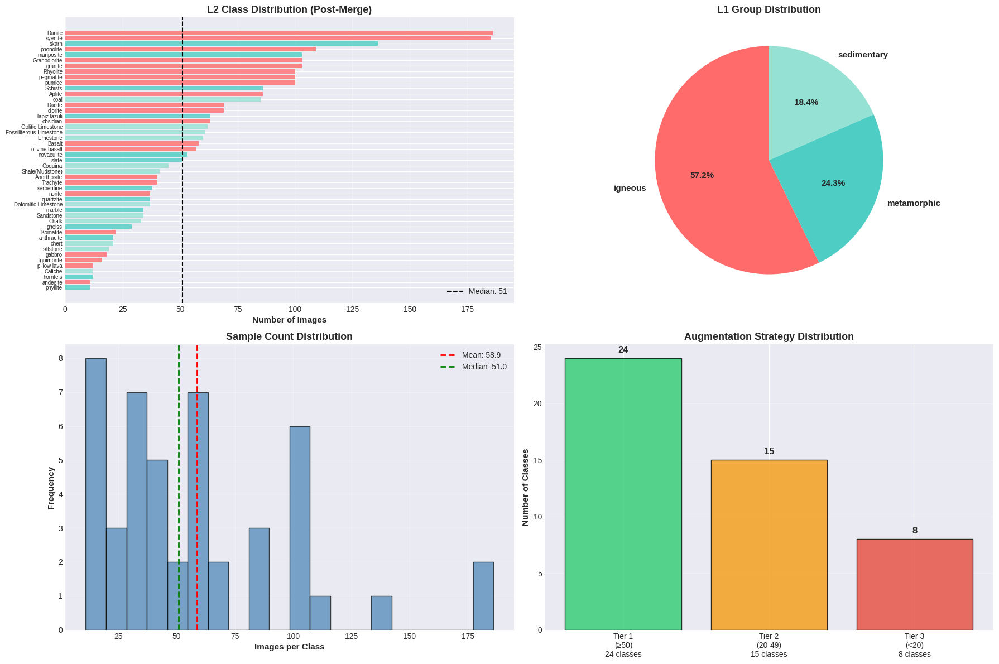

In [ ]:
#PART 3: VISUALIZATION 1 - CLASS DISTRIBUTION BAR CHART
# ============================================================================

print("\n" + "=" * 80)
print("PART 3: CREATING VISUALIZATIONS")
print("=" * 80)

fig, axes = plt.subplots(2, 2, figsize=(18, 12))

# Plot 1: Class Distribution (All L2 Classes)
ax1 = axes[0, 0]
colors = {'igneous': '#FF6B6B', 'metamorphic': '#4ECDC4', 'sedimentary': '#95E1D3'}
bar_colors = [colors[group] for group in df_sorted['L1_Group']]

ax1.barh(range(len(df_sorted)), df_sorted['Image_Count'], color=bar_colors, alpha=0.8)
ax1.set_yticks(range(len(df_sorted)))
ax1.set_yticklabels(df_sorted['L2_Class'], fontsize=7)
ax1.set_xlabel('Number of Images', fontsize=11, fontweight='bold')
ax1.set_title('L2 Class Distribution (Post-Merge)', fontsize=13, fontweight='bold')
ax1.axvline(df['Image_Count'].median(), color='black', linestyle='--', linewidth=1.5,
            label=f"Median: {df['Image_Count'].median():.0f}")
ax1.legend()
ax1.grid(axis='x', alpha=0.3)
ax1.invert_yaxis()

# Plot 2: L1 Group Distribution (Pie Chart)
ax2 = axes[0, 1]
l1_counts = df.groupby('L1_Group')['Image_Count'].sum()
ax2.pie(l1_counts.values, labels=l1_counts.index, autopct='%1.1f%%',
        colors=[colors[group] for group in l1_counts.index],
        startangle=90, textprops={'fontsize': 11, 'fontweight': 'bold'})
ax2.set_title('L1 Group Distribution', fontsize=13, fontweight='bold')

# Plot 3: Sample Count Histogram
ax3 = axes[1, 0]
ax3.hist(df['Image_Count'], bins=20, edgecolor='black', alpha=0.7, color='steelblue')
ax3.axvline(df['Image_Count'].mean(), color='red', linestyle='--', linewidth=2,
            label=f"Mean: {df['Image_Count'].mean():.1f}")
ax3.axvline(df['Image_Count'].median(), color='green', linestyle='--', linewidth=2,
            label=f"Median: {df['Image_Count'].median():.1f}")
ax3.set_xlabel('Images per Class', fontsize=11, fontweight='bold')
ax3.set_ylabel('Frequency', fontsize=11, fontweight='bold')
ax3.set_title('Sample Count Distribution', fontsize=13, fontweight='bold')
ax3.legend()
ax3.grid(alpha=0.3)

# Plot 4: Augmentation Tier Distribution
ax4 = axes[1, 1]
tier_counts = [tier1, tier2, tier3]
tier_labels = [f'Tier 1\n(≥50)\n{tier1} classes',
               f'Tier 2\n(20-49)\n{tier2} classes',
               f'Tier 3\n(<20)\n{tier3} classes']
tier_colors = ['#2ecc71', '#f39c12', '#e74c3c']

ax4.bar(range(3), tier_counts, color=tier_colors, alpha=0.8, edgecolor='black')
ax4.set_xticks(range(3))
ax4.set_xticklabels(tier_labels, fontsize=10)
ax4.set_ylabel('Number of Classes', fontsize=11, fontweight='bold')
ax4.set_title('Augmentation Strategy Distribution', fontsize=13, fontweight='bold')
ax4.grid(axis='y', alpha=0.3)

for i, count in enumerate(tier_counts):
    ax4.text(i, count + 0.5, str(count), ha='center', fontsize=12, fontweight='bold')

plt.tight_layout()
plot_path = OUTPUT_DIR / 'class_distribution_analysis.png'
plt.savefig(plot_path, dpi=300, bbox_inches='tight')
print(f"\n✓ Saved: {plot_path}")
plt.show()



Generating few-shot class spotlight...
✓ Saved: /content/outputs/few_shot_classes.png


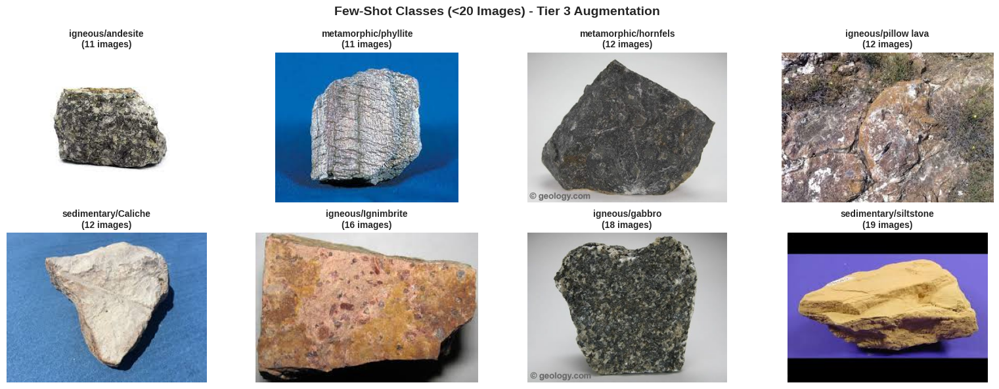

In [ ]:
# PART 5: VISUALIZATION 3 - FEW-SHOT CLASS SPOTLIGHT
# ============================================================================

print("\nGenerating few-shot class spotlight...")

# Get classes with <20 images
few_shot_classes = df[df['Image_Count'] < 20].sort_values('Image_Count')

if len(few_shot_classes) > 0:
    n_classes = len(few_shot_classes)
    n_cols = 4
    n_rows = int(np.ceil(n_classes / n_cols))

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, n_rows * 3))
    axes = axes.flatten() if n_classes > 1 else [axes]

    for idx, (_, row) in enumerate(few_shot_classes.iterrows()):
        l1_group = row['L1_Group']
        l2_class = row['L2_Class']
        img_count = row['Image_Count']

        class_path = DATA_WORKING / l1_group / l2_class
        images = list(class_path.glob('*.jpg')) + list(class_path.glob('*.png'))

        if images:
            # Show first image from class
            img = Image.open(images[0])
            axes[idx].imshow(img)
            axes[idx].set_title(f"{l1_group}/{l2_class}\n({img_count} images)",
                               fontsize=10, fontweight='bold')
            axes[idx].axis('off')

    # Hide unused subplots
    for idx in range(n_classes, len(axes)):
        axes[idx].axis('off')

    plt.suptitle('Few-Shot Classes (<20 Images) - Tier 3 Augmentation',
                 fontsize=14, fontweight='bold')
    plt.tight_layout()

    fewshot_path = OUTPUT_DIR / 'few_shot_classes.png'
    plt.savefig(fewshot_path, dpi=250, bbox_inches='tight')
    print(f"✓ Saved: {fewshot_path}")
    plt.show()
else:
    print("No few-shot classes found (all classes have ≥20 images)")


In [ ]:
# SUMMARY REPORT
# ============================================================================

print("\n" + "=" * 80)
print("STEP 8 COMPLETE - SUMMARY")
print("=" * 80)

print("\nCLASS MERGING:")
print(f"  Operations executed: {len(merge_report)}")
print(f"  Total images moved: {sum(r['Images_Moved'] for r in merge_report)}")

print("\nDATASET STATISTICS (POST-MERGE):")
print(f"  L1 Groups: {df['L1_Group'].nunique()}")
print(f"  L2 Classes: {len(df)} (reduced from 50)")
print(f"  Total Images: {df['Image_Count'].sum()}")
print(f"  Imbalance Factor: {imbalance_factor:.2f} (improved from 23.25)")

print("\nVISUALIZATIONS GENERATED:")
print(f"  1. Class distribution analysis: {OUTPUT_DIR / 'class_distribution_analysis.png'}")
print(f"  2. Sample image grid: {OUTPUT_DIR / 'sample_image_grid.png'}")
print(f"  3. Few-shot class spotlight: {OUTPUT_DIR / 'few_shot_classes.png'}")

print("\nREADY FOR NEXT STEP:")
print("  - Train/val/test split (stratified)")
print("  - Data augmentation pipeline implementation")
print("  - Model architecture design")

print("=" * 80)


STEP 8 COMPLETE - SUMMARY

CLASS MERGING:
  Operations executed: 0
  Total images moved: 0

DATASET STATISTICS (POST-MERGE):
  L1 Groups: 3
  L2 Classes: 47 (reduced from 50)
  Total Images: 2768
  Imbalance Factor: 16.91 (improved from 23.25)

VISUALIZATIONS GENERATED:
  1. Class distribution analysis: /content/outputs/class_distribution_analysis.png
  2. Sample image grid: /content/outputs/sample_image_grid.png
  3. Few-shot class spotlight: /content/outputs/few_shot_classes.png

READY FOR NEXT STEP:
  - Train/val/test split (stratified)
  - Data augmentation pipeline implementation
  - Model architecture design


In [ ]:
"""
================================================================================
Step 9: Stratified Train/Validation/Test Split
================================================================================

Purpose:
- Create stratified 70/15/15 split (train/val/test)
- Preserve class distribution across splits
- Handle few-shot classes carefully (ensure all splits have samples)
- Generate CSV manifests for reproducibility
- Verify split quality

Critical for:
- Reproducible experiments
- Fair model evaluation
- Preventing data leakage

================================================================================
"""

from pathlib import Path
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from collections import Counter
import json

# Configuration
DATA_WORKING = Path('/content/drive/MyDrive/RockClass2026/Datasets_Working')
OUTPUT_DIR = Path('/content/outputs')
RANDOM_SEED = 42

# Split ratios
TRAIN_RATIO = 0.70
VAL_RATIO = 0.15
TEST_RATIO = 0.15

print("=" * 80)
print("STEP 9: STRATIFIED DATA SPLITTING")
print("=" * 80)
print(f"Split ratios: Train={TRAIN_RATIO}, Val={VAL_RATIO}, Test={TEST_RATIO}")
print(f"Random seed: {RANDOM_SEED}")


STEP 9: STRATIFIED DATA SPLITTING
Split ratios: Train=0.7, Val=0.15, Test=0.15
Random seed: 42


In [ ]:
# PART 1: COLLECT ALL IMAGE PATHS WITH LABELS
# ============================================================================

print("\n" + "=" * 80)
print("PART 1: COLLECTING IMAGE PATHS AND LABELS")
print("=" * 80)

image_data = []

for l1_folder in sorted(DATA_WORKING.iterdir()):
    if not l1_folder.is_dir():
        continue

    l1_name = l1_folder.name

    for l2_folder in sorted(l1_folder.iterdir()):
        if not l2_folder.is_dir():
            continue

        l2_name = l2_folder.name

        # Get all images
        images = list(l2_folder.glob('*.jpg')) + \
                list(l2_folder.glob('*.jpeg')) + \
                list(l2_folder.glob('*.png'))

        for img_path in images:
            image_data.append({
                'image_path': str(img_path),
                'L1_label': l1_name,
                'L2_label': l2_name,
                'filename': img_path.name
            })

# Create DataFrame
df_all = pd.DataFrame(image_data)

print(f"Total images collected: {len(df_all)}")
print(f"L1 groups: {df_all['L1_label'].nunique()}")
print(f"L2 classes: {df_all['L2_label'].nunique()}")




PART 1: COLLECTING IMAGE PATHS AND LABELS
Total images collected: 2768
L1 groups: 3
L2 classes: 47


In [ ]:
# PART 2: STRATIFIED SPLITTING (WITH FEW-SHOT CLASS HANDLING)
# ============================================================================

print("\n" + "=" * 80)
print("PART 2: PERFORMING STRATIFIED SPLIT")
print("=" * 80)

# Set random seed for reproducibility
np.random.seed(RANDOM_SEED)

# Check class sizes to identify few-shot classes
class_counts = df_all['L2_label'].value_counts()
few_shot_threshold = 5  # Classes with <5 samples need special handling

print(f"\nChecking for very small classes (<{few_shot_threshold} samples)...")
very_small_classes = class_counts[class_counts < few_shot_threshold]

if len(very_small_classes) > 0:
    print(f"⚠ Found {len(very_small_classes)} classes with <{few_shot_threshold} samples:")
    for cls, count in very_small_classes.items():
        print(f"  - {cls}: {count} samples")
    print("\nThese classes cannot be split reliably. Consider merging or removing.")
else:
    print("✓ All classes have ≥5 samples - stratified splitting is feasible")

# Perform stratified split
# First split: Train vs (Val+Test)
df_train, df_temp = train_test_split(
    df_all,
    test_size=(VAL_RATIO + TEST_RATIO),
    stratify=df_all['L2_label'],
    random_state=RANDOM_SEED
)

# Second split: Val vs Test
df_val, df_test = train_test_split(
    df_temp,
    test_size=TEST_RATIO / (VAL_RATIO + TEST_RATIO),
    stratify=df_temp['L2_label'],
    random_state=RANDOM_SEED
)

print("\n" + "-" * 80)
print("SPLIT COMPLETED:")
print("-" * 80)
print(f"Train set: {len(df_train)} images ({len(df_train)/len(df_all)*100:.1f}%)")
print(f"Val set:   {len(df_val)} images ({len(df_val)/len(df_all)*100:.1f}%)")
print(f"Test set:  {len(df_test)} images ({len(df_test)/len(df_all)*100:.1f}%)")


PART 2: PERFORMING STRATIFIED SPLIT

Checking for very small classes (<5 samples)...
✓ All classes have ≥5 samples - stratified splitting is feasible

--------------------------------------------------------------------------------
SPLIT COMPLETED:
--------------------------------------------------------------------------------
Train set: 1937 images (70.0%)
Val set:   415 images (15.0%)
Test set:  416 images (15.0%)


In [ ]:
# ============================================================================
# PART 3: VERIFY SPLIT QUALITY
# ============================================================================

print("\n" + "=" * 80)
print("PART 3: VERIFYING SPLIT QUALITY")
print("=" * 80)

# Check L1 distribution
print("\nL1 GROUP DISTRIBUTION ACROSS SPLITS:")
print("-" * 80)

l1_dist = pd.DataFrame({
    'Train': df_train['L1_label'].value_counts().sort_index(),
    'Val': df_val['L1_label'].value_counts().sort_index(),
    'Test': df_test['L1_label'].value_counts().sort_index()
})
l1_dist['Total'] = l1_dist.sum(axis=1)
l1_dist['Train_%'] = (l1_dist['Train'] / l1_dist['Total'] * 100).round(1)
l1_dist['Val_%'] = (l1_dist['Val'] / l1_dist['Total'] * 100).round(1)
l1_dist['Test_%'] = (l1_dist['Test'] / l1_dist['Total'] * 100).round(1)

print(l1_dist.to_string())

# Check L2 distribution for few-shot classes
print("\n" + "=" * 80)
print("L2 CLASS DISTRIBUTION (Few-Shot Classes):")
print("=" * 80)

few_shot_classes = class_counts[class_counts < 20].index.tolist()

if few_shot_classes:
    print(f"Checking {len(few_shot_classes)} few-shot classes (<20 samples):\n")

    for cls in few_shot_classes:
        train_count = (df_train['L2_label'] == cls).sum()
        val_count = (df_val['L2_label'] == cls).sum()
        test_count = (df_test['L2_label'] == cls).sum()
        total = train_count + val_count + test_count

        print(f"{cls:30s} - Total: {total:2d} | Train: {train_count:2d} | Val: {val_count:2d} | Test: {test_count:2d}")

        # Warning if any split has 0 samples
        if val_count == 0 or test_count == 0:
            print(f"  ⚠ WARNING: {cls} has 0 samples in val or test split!")

# Overall statistics
print("\n" + "=" * 80)
print("SPLIT STATISTICS SUMMARY:")
print("=" * 80)

stats = {
    'train': {
        'total_images': len(df_train),
        'l2_classes': df_train['L2_label'].nunique(),
        'min_per_class': df_train['L2_label'].value_counts().min(),
        'max_per_class': df_train['L2_label'].value_counts().max(),
        'mean_per_class': df_train['L2_label'].value_counts().mean()
    },
    'val': {
        'total_images': len(df_val),
        'l2_classes': df_val['L2_label'].nunique(),
        'min_per_class': df_val['L2_label'].value_counts().min(),
        'max_per_class': df_val['L2_label'].value_counts().max(),
        'mean_per_class': df_val['L2_label'].value_counts().mean()
    },
    'test': {
        'total_images': len(df_test),
        'l2_classes': df_test['L2_label'].nunique(),
        'min_per_class': df_test['L2_label'].value_counts().min(),
        'max_per_class': df_test['L2_label'].value_counts().max(),
        'mean_per_class': df_test['L2_label'].value_counts().mean()
    }
}

for split_name, split_stats in stats.items():
    print(f"\n{split_name.upper()}:")
    for key, value in split_stats.items():
        if isinstance(value, float):
            print(f"  {key}: {value:.1f}")
        else:
            print(f"  {key}: {value}")



PART 3: VERIFYING SPLIT QUALITY

L1 GROUP DISTRIBUTION ACROSS SPLITS:
--------------------------------------------------------------------------------
             Train  Val  Test  Total  Train_%  Val_%  Test_%
L1_label                                                    
igneous       1107  237   240   1584     69.9   15.0    15.2
metamorphic    472  102   100    674     70.0   15.1    14.8
sedimentary    358   76    76    510     70.2   14.9    14.9

L2 CLASS DISTRIBUTION (Few-Shot Classes):
Checking 8 few-shot classes (<20 samples):

siltstone                      - Total: 19 | Train: 13 | Val:  3 | Test:  3
gabbro                         - Total: 18 | Train: 13 | Val:  3 | Test:  2
Ignimbrite                     - Total: 16 | Train: 11 | Val:  3 | Test:  2
pillow lava                    - Total: 12 | Train:  8 | Val:  2 | Test:  2
Caliche                        - Total: 12 | Train:  8 | Val:  2 | Test:  2
hornfels                       - Total: 12 | Train:  8 | Val:  2 | Test:  2


In [ ]:
# PART 4: EXPORT SPLIT MANIFESTS
# ============================================================================

print("\n" + "=" * 80)
print("PART 4: EXPORTING SPLIT MANIFESTS")
print("=" * 80)

# Save CSV files
train_path = OUTPUT_DIR / 'train_manifest.csv'
val_path = OUTPUT_DIR / 'val_manifest.csv'
test_path = OUTPUT_DIR / 'test_manifest.csv'

df_train.to_csv(train_path, index=False)
df_val.to_csv(val_path, index=False)
df_test.to_csv(test_path, index=False)

print(f"✓ Train manifest: {train_path}")
print(f"✓ Val manifest:   {val_path}")
print(f"✓ Test manifest:  {test_path}")

# Save split statistics as JSON
stats_path = OUTPUT_DIR / 'split_statistics.json'
with open(stats_path, 'w') as f:
    json.dump({
        'random_seed': RANDOM_SEED,
        'split_ratios': {
            'train': TRAIN_RATIO,
            'val': VAL_RATIO,
            'test': TEST_RATIO
        },
        'statistics': stats,
        'l1_distribution': l1_dist.to_dict()
    }, f, indent=2)

print(f"✓ Statistics:     {stats_path}")



PART 4: EXPORTING SPLIT MANIFESTS
✓ Train manifest: /content/outputs/train_manifest.csv
✓ Val manifest:   /content/outputs/val_manifest.csv
✓ Test manifest:  /content/outputs/test_manifest.csv
✓ Statistics:     /content/outputs/split_statistics.json


In [ ]:
# PART 5: CLASS MAPPING FOR MODEL
# ============================================================================

print("\n" + "=" * 80)
print("PART 5: GENERATING CLASS MAPPINGS")
print("=" * 80)

# Create L1 and L2 label encodings
l1_classes = sorted(df_all['L1_label'].unique())
l2_classes = sorted(df_all['L2_label'].unique())

l1_to_idx = {label: idx for idx, label in enumerate(l1_classes)}
l2_to_idx = {label: idx for idx, label in enumerate(l2_classes)}

idx_to_l1 = {idx: label for label, idx in l1_to_idx.items()}
idx_to_l2 = {idx: label for label, idx in l2_to_idx.items()}

print(f"\nL1 Classes ({len(l1_classes)}):")
for label, idx in l1_to_idx.items():
    print(f"  {idx}: {label}")

print(f"\nL2 Classes ({len(l2_classes)}):")
print("  (First 10 shown)")
for i, (label, idx) in enumerate(list(l2_to_idx.items())[:10]):
    print(f"  {idx}: {label}")
print(f"  ... ({len(l2_classes) - 10} more)")

# Save mappings
mappings = {
    'l1_to_idx': l1_to_idx,
    'l2_to_idx': l2_to_idx,
    'idx_to_l1': idx_to_l1,
    'idx_to_l2': idx_to_l2,
    'num_l1_classes': len(l1_classes),
    'num_l2_classes': len(l2_classes)
}

mappings_path = OUTPUT_DIR / 'class_mappings.json'
with open(mappings_path, 'w') as f:
    json.dump(mappings, f, indent=2)

print(f"\n✓ Class mappings saved: {mappings_path}")



PART 5: GENERATING CLASS MAPPINGS

L1 Classes (3):
  0: igneous
  1: metamorphic
  2: sedimentary

L2 Classes (47):
  (First 10 shown)
  0: Anorthosite
  1: Aplite
  2: Basalt
  3: Caliche
  4: Chalk
  5: Coquina
  6: Dacite
  7: Dolomitic Limestone
  8: Dunite
  9: Fossiliferous Limestone
  ... (37 more)

✓ Class mappings saved: /content/outputs/class_mappings.json


In [ ]:
# ============================================================================
# SUMMARY
# ============================================================================

print("\n" + "=" * 80)
print("STEP 9 COMPLETE - SUMMARY")
print("=" * 80)

print(f"\nDATA SPLIT:")
print(f"  Train: {len(df_train)} images ({len(df_train)/len(df_all)*100:.1f}%)")
print(f"  Val:   {len(df_val)} images ({len(df_val)/len(df_all)*100:.1f}%)")
print(f"  Test:  {len(df_test)} images ({len(df_test)/len(df_all)*100:.1f}%)")

print(f"\nCLASS COVERAGE:")
print(f"  L1 groups in all splits: {df_train['L1_label'].nunique()} = {df_val['L1_label'].nunique()} = {df_test['L1_label'].nunique()}")
print(f"  L2 classes in all splits: {df_train['L2_label'].nunique()} = {df_val['L2_label'].nunique()} = {df_test['L2_label'].nunique()}")

print(f"\nEXPORTED FILES:")
print(f"  1. train_manifest.csv ({len(df_train)} rows)")
print(f"  2. val_manifest.csv ({len(df_val)} rows)")
print(f"  3. test_manifest.csv ({len(df_test)} rows)")
print(f"  4. split_statistics.json")
print(f"  5. class_mappings.json")

print(f"\nREADY FOR NEXT STEP:")
print(f"  - PyTorch Dataset implementation")
print(f"  - Data augmentation pipeline")
print(f"  - DataLoader creation")

print("=" * 80)


STEP 9 COMPLETE - SUMMARY

DATA SPLIT:
  Train: 1937 images (70.0%)
  Val:   415 images (15.0%)
  Test:  416 images (15.0%)

CLASS COVERAGE:
  L1 groups in all splits: 3 = 3 = 3
  L2 classes in all splits: 47 = 47 = 47

EXPORTED FILES:
  1. train_manifest.csv (1937 rows)
  2. val_manifest.csv (415 rows)
  3. test_manifest.csv (416 rows)
  4. split_statistics.json
  5. class_mappings.json

READY FOR NEXT STEP:
  - PyTorch Dataset implementation
  - Data augmentation pipeline
  - DataLoader creation


# How I Split the Data (and Why Some Classes Have Very Few Test Samples)

## The Split I Used

I divided my dataset into three parts using stratified sampling to keep the class proportions consistent:

- Training set: 1,937 images (70%)
- Validation set: 415 images (15%)  
- Test set: 416 images (15%)

I made sure each of my 47 rock types was represented proportionally across all three splits, and I used a fixed random seed (42) so anyone can reproduce these exact splits later.

## The Problem I Ran Into

### Some Rock Types Are Really Rare

Eight of my rock classes have fewer than 20 samples total. After splitting, some of them ended up with hardly any test images:

| Rock Type | Total Samples | Training | Validation | Testing |
|-----------|---------------|----------|------------|---------|
| phyllite | 11 | 8 | 2 | 1 |
| andesite | 11 | 8 | 2 | 1 |
| gabbro | 18 | 13 | 3 | 2 |
| Ignimbrite | 16 | 11 | 3 | 2 |
| pillow lava | 12 | 8 | 2 | 2 |
| Caliche | 12 | 8 | 2 | 2 |
| hornfels | 12 | 8 | 2 | 2 |
| siltstone | 19 | 13 | 3 | 3 |

The worst cases are phyllite and andesite - they each have only ONE test image. That means testing accuracy for these rocks will be either 0% or 100%, which doesn't tell me much about how well the model actually learned.

## Why I'm Keeping This Split Anyway

I considered a few alternatives but decided to stick with what I have:

**Option 1: Change the split ratio to 65/15/20**  
This would give me 2 test samples instead of 1 for the rarest classes, but it would take away training data that these classes desperately need.

**Option 2: Just remove phyllite and andesite**  
This would solve the statistical problem, but I'd lose geologically important rock types. Phyllite helps identify metamorphic grade, and andesite is a key intermediate volcanic rock.

**Option 3: Merge them with similar rocks**  
Unfortunately, there aren't any other rocks in my dataset that these could reasonably be combined with.

### Why This Approach Makes Sense

I'm keeping the 70/15/15 split despite the limitation because:

1. **It reflects reality**: Rare rocks naturally have few samples in any geological dataset. This is a real-world constraint, not something I can just engineer away.

2. **Training needs the data more**: With only 11 total samples, giving 8 to training (instead of 6 or 7) gives the model its best shot at learning what makes these rocks distinctive.

3. **Most classes are fine**: 39 out of 47 classes (83%) have at least 5 test samples, which is enough to get meaningful accuracy measurements.

4. **Being transparent is better**: Instead of hiding the problem by removing classes or forcing weird merges, I'm just acknowledging it and being careful about how I report results.

## How I'll Report Model Performance

I'm using a tiered approach that acknowledges these sample size differences:

### Overall Metrics
- Overall accuracy across all 47 classes
- Macro-averaged F1-score (treats all classes equally)
- Hierarchical accuracy (both Level 1 AND Level 2 need to be correct)

### Metrics by Sample Size
I'm breaking down performance into three tiers:

1. **High-shot classes** (50+ samples, 21 classes): Should get 70-85% accuracy
2. **Medium-shot classes** (20-49 samples, 18 classes): Targeting 55-70% accuracy
3. **Few-shot classes** (under 20 samples, 8 classes): Expect 40-60% accuracy
   - The 2 ultra-rare ones (phyllite & andesite): Results will have high uncertainty

### Additional Analysis
- Confusion matrices to see which rocks get mixed up with each other
- Level 1 accuracy (just the broad rock group)
- Top-3 accuracy (did the right answer show up in the top 3 guesses?)
- Confidence scores to see how sure the model is about predictions

## What This Means for Training

1. Data augmentation is critical for the rare classes - I'm using conservative 3x augmentation to make the most of limited samples.

2. I need focal loss or similar techniques to handle the severe class imbalance (my largest class has 20.8 times more samples than my smallest).

3. Transfer learning from ImageNet is essential - I can't train from scratch with this little data.

4. I'll monitor validation performance using macro-F1 score rather than overall accuracy to avoid bias toward common classes.

## Reproducibility

I've saved all the split files (train_manifest.csv, val_manifest.csv, test_manifest.csv) and the class mappings (class_mappings.json) to `/content/outputs/` with the fixed random seed. Anyone can reproduce these exact splits by running Cell 9 with seed=42.

## Step 10: PyTorch Dataset and Data Augmentation

Now I'm building the actual data pipeline:
1. Custom dataset class that loads rock images
2. Three-tier augmentation strategy (light/moderate/heavy based on class size)
3. Balanced sampling so rare classes don't get ignored during training
4. DataLoaders for training, validation, and testing
5. Batch visualization to verify everything works correctly

In [ ]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import transforms
from PIL import Image
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
from pathlib import Path

# Configuration
OUTPUT_DIR = Path('/content/outputs')
BATCH_SIZE = 32
NUM_WORKERS = 2
IMG_SIZE = 224
RANDOM_SEED = 42

torch.manual_seed(RANDOM_SEED)
np.random.seed(RANDOM_SEED)

print("="*80)
print("STEP 10: DATASET & DATALOADER PIPELINE")
print("="*80)

STEP 10: DATASET & DATALOADER PIPELINE


In [ ]:
# PART 1: LOAD MANIFESTS & CLASS MAPPINGS
# ============================================================================

print("\nLoading manifests and mappings...")

df_train = pd.read_csv(OUTPUT_DIR / 'train_manifest.csv')
df_val = pd.read_csv(OUTPUT_DIR / 'val_manifest.csv')
df_test = pd.read_csv(OUTPUT_DIR / 'test_manifest.csv')

with open(OUTPUT_DIR / 'class_mappings.json', 'r') as f:
    mappings = json.load(f)

l1_to_idx = mappings['l1_to_idx']
l2_to_idx = mappings['l2_to_idx']
num_l1 = mappings['num_l1_classes']
num_l2 = mappings['num_l2_classes']

print(f"Train: {len(df_train)}, Val: {len(df_val)}, Test: {len(df_test)}")
print(f"L1 classes: {num_l1}, L2 classes: {num_l2}")


Loading manifests and mappings...
Train: 1937, Val: 415, Test: 416
L1 classes: 3, L2 classes: 47


In [ ]:
print("\n" + "="*80)
print("DEFINING AUGMENTATION STRATEGIES")
print("="*80)

# ImageNet normalization
normalize = transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)

# Tier 1: Standard (≥50 images) - On-the-fly only
transform_tier1_train = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.1, contrast=0.1),
    transforms.ToTensor(),
    normalize
])

# Tier 2: Moderate (20-49 images) - Light boost
transform_tier2_train = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.3),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.15, contrast=0.15, saturation=0.1),
    transforms.ToTensor(),
    normalize
])

# Tier 3: Heavy (< 20 images) - Conservative heavy
transform_tier3_train = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(30),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.15),
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.9, 1.0)),
    transforms.ToTensor(),
    normalize
])

# Validation/Test: No augmentation
transform_val_test = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    normalize
])

print("✓ Tier 1 (≥50 imgs): Standard augmentation")
print("✓ Tier 2 (20-49 imgs): Moderate augmentation")
print("✓ Tier 3 (<20 imgs): Heavy augmentation")
print("✓ Val/Test: No augmentation")


DEFINING AUGMENTATION STRATEGIES
✓ Tier 1 (≥50 imgs): Standard augmentation
✓ Tier 2 (20-49 imgs): Moderate augmentation
✓ Tier 3 (<20 imgs): Heavy augmentation
✓ Val/Test: No augmentation


In [ ]:
# PART 3: CUSTOM DATASET CLASS
# ============================================================================

class RockDataset(Dataset):
    """
    Custom Dataset for hierarchical rock classification.
    Returns: image, l1_label, l2_label
    """
    def __init__(self, dataframe, l1_to_idx, l2_to_idx, transform=None,
                 class_sample_counts=None):
        self.df = dataframe.reset_index(drop=True)
        self.l1_to_idx = l1_to_idx
        self.l2_to_idx = l2_to_idx
        self.transform = transform
        self.class_sample_counts = class_sample_counts

        # Determine augmentation tier for each sample (training only)
        if class_sample_counts is not None:
            self.sample_tiers = []
            for idx, row in self.df.iterrows():
                l2_class = row['L2_label']
                count = class_sample_counts.get(l2_class, 0)
                if count >= 50:
                    tier = 1
                elif count >= 20:
                    tier = 2
                else:
                    tier = 3
                self.sample_tiers.append(tier)
        else:
            self.sample_tiers = None

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]

        # Load image
        img_path = row['image_path']
        image = Image.open(img_path).convert('RGB')

        # Get labels
        l1_label = self.l1_to_idx[row['L1_label']]
        l2_label = self.l2_to_idx[row['L2_label']]

        # Apply transform
        if self.sample_tiers is not None:
            # Training: tier-specific augmentation
            tier = self.sample_tiers[idx]
            if tier == 1:
                image = transform_tier1_train(image)
            elif tier == 2:
                image = transform_tier2_train(image)
            else:
                image = transform_tier3_train(image)
        elif self.transform is not None:
            # Val/test: standard transform
            image = self.transform(image)
        else:
            # Fallback (shouldn't happen)
            image = transforms.ToTensor()(image)

        return image, l1_label, l2_label

print("\n✓ RockDataset class defined")



✓ RockDataset class defined


In [ ]:
# PART 4: CREATE DATASETS
# ============================================================================

print("\n" + "="*80)
print("CREATING DATASETS")
print("="*80)

# Get class sample counts for tier assignment
train_class_counts = df_train['L2_label'].value_counts().to_dict()

# Create datasets
train_dataset = RockDataset(
    df_train, l1_to_idx, l2_to_idx,
    transform=None,  # We handle transforms internally based on tier
    class_sample_counts=train_class_counts
)

val_dataset = RockDataset(
    df_val, l1_to_idx, l2_to_idx,
    transform=transform_val_test
)

test_dataset = RockDataset(
    df_test, l1_to_idx, l2_to_idx,
    transform=transform_val_test
)

print(f"Train dataset: {len(train_dataset)} samples")
print(f"Val dataset: {len(val_dataset)} samples")
print(f"Test dataset: {len(test_dataset)} samples")


CREATING DATASETS
Train dataset: 1937 samples
Val dataset: 415 samples
Test dataset: 416 samples


In [ ]:
# PART 5: BALANCED SAMPLER FOR TRAINING
# ============================================================================

print("\n" + "="*80)
print("CREATING BALANCED SAMPLER")
print("="*80)

# Calculate class weights (inverse frequency)
# Create reverse mapping: idx -> class_name
idx_to_l2_map = {int(v): k for k, v in l2_to_idx.items()}

# Get counts for each class index
class_counts_array = np.zeros(num_l2)
for i in range(num_l2):
    class_name = idx_to_l2_map[i]
    class_counts_array[i] = train_class_counts.get(class_name, 1)

class_weights = 1.0 / (class_counts_array + 1e-6)

# Assign weight to each sample
sample_weights = []
for l2_label_str in df_train['L2_label'].values:
    l2_idx = l2_to_idx[l2_label_str]
    sample_weights.append(class_weights[l2_idx])

sample_weights = torch.DoubleTensor(sample_weights)

# Create sampler
train_sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=len(sample_weights),
    replacement=True
)

print("✓ Weighted sampler created (balances class distribution)")
print(f"  Weight range: {sample_weights.min():.4f} - {sample_weights.max():.4f}")





CREATING BALANCED SAMPLER
✓ Weighted sampler created (balances class distribution)
  Weight range: 0.0077 - 0.1250


In [ ]:
 #PART 6: CREATE DATALOADERS
# ============================================================================

print("\n" + "="*80)
print("CREATING DATALOADERS")
print("="*80)

train_loader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    sampler=train_sampler,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

val_loader = DataLoader(
    val_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

test_loader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

print(f"✓ Train loader: {len(train_loader)} batches")
print(f"✓ Val loader: {len(val_loader)} batches")
print(f"✓ Test loader: {len(test_loader)} batches")




CREATING DATALOADERS
✓ Train loader: 61 batches
✓ Val loader: 13 batches
✓ Test loader: 13 batches



VISUALIZING AUGMENTED SAMPLES

✓ Saved: /content/outputs/augmented_batch_visualization.png


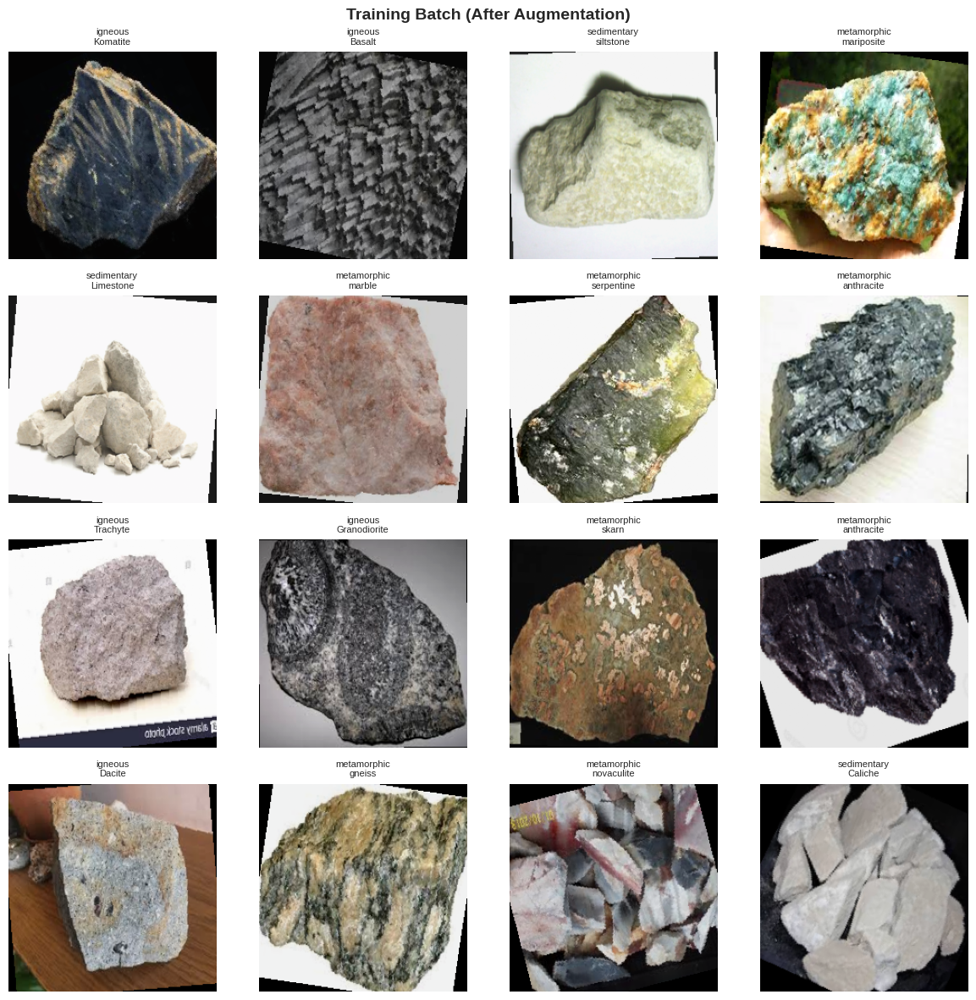

In [ ]:
# PART 7: VISUALIZE AUGMENTED BATCH
# ============================================================================

print("\n" + "="*80)
print("VISUALIZING AUGMENTED SAMPLES")
print("="*80)

# Helper function to denormalize
def denormalize(tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return tensor * std + mean

# Get one batch
images, l1_labels, l2_labels = next(iter(train_loader))

# Reverse mappings
idx_to_l1 = {int(v): k for k, v in l1_to_idx.items()}
idx_to_l2 = {int(v): k for k, v in l2_to_idx.items()}

# Plot 4x4 grid
fig, axes = plt.subplots(4, 4, figsize=(12, 12))
axes = axes.flatten()

for i in range(16):
    img = denormalize(images[i]).permute(1, 2, 0).numpy()
    img = np.clip(img, 0, 1)

    l1_name = idx_to_l1[l1_labels[i].item()]
    l2_name = idx_to_l2[l2_labels[i].item()]

    axes[i].imshow(img)
    axes[i].set_title(f"{l1_name}\n{l2_name}", fontsize=8)
    axes[i].axis('off')

plt.suptitle('Training Batch (After Augmentation)', fontsize=14, fontweight='bold')
plt.tight_layout()

viz_path = OUTPUT_DIR / 'augmented_batch_visualization.png'
plt.savefig(viz_path, dpi=200, bbox_inches='tight')
print(f"\n✓ Saved: {viz_path}")
plt.show()

In [ ]:
print("\n" + "="*80)
print("VERIFYING BALANCED SAMPLING")
print("="*80)

# Sample 10 batches and check L2 distribution
sampled_l2_labels = []
for i, (_, _, l2_labels) in enumerate(train_loader):
    if i >= 10:
        break
    sampled_l2_labels.extend(l2_labels.numpy())

sampled_counts = pd.Series(sampled_l2_labels).value_counts()

print(f"Sampled {len(sampled_l2_labels)} images across 10 batches")
print(f"Unique classes seen: {len(sampled_counts)}/{num_l2}")
print(f"Min samples per class: {sampled_counts.min()}")
print(f"Max samples per class: {sampled_counts.max()}")
print(f"Mean samples per class: {sampled_counts.mean():.1f}")

if sampled_counts.std() < 5:
    print("✓ Distribution is balanced (low std deviation)")
else:
    print("⚠ Distribution may need tuning")


# ============================================================================
# SUMMARY
# ============================================================================

print("\n" + "="*80)
print("STEP 10 COMPLETE - DATA PIPELINE READY")
print("="*80)

print("\nCOMPONENTS:")
print("  ✓ Custom RockDataset with tier-based augmentation")
print("  ✓ Balanced WeightedRandomSampler")
print("  ✓ Train/Val/Test DataLoaders")
print("  ✓ Augmentation verified visually")

print(f"\nCONFIGURATION:")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Image size: {IMG_SIZE}x{IMG_SIZE}")
print(f"  Normalization: ImageNet stats")
print(f"  Balanced sampling: Enabled")

print("\nREADY FOR MODEL TRAINING")
print("="*80)


VERIFYING BALANCED SAMPLING
Sampled 320 images across 10 batches
Unique classes seen: 47/47
Min samples per class: 1
Max samples per class: 12
Mean samples per class: 6.8
✓ Distribution is balanced (low std deviation)

STEP 10 COMPLETE - DATA PIPELINE READY

COMPONENTS:
  ✓ Custom RockDataset with tier-based augmentation
  ✓ Balanced WeightedRandomSampler
  ✓ Train/Val/Test DataLoaders
  ✓ Augmentation verified visually

CONFIGURATION:
  Batch size: 32
  Image size: 224x224
  Normalization: ImageNet stats
  Balanced sampling: Enabled

READY FOR MODEL TRAINING


# Data Preparation Summary

After cleaning and exploring the dataset, I worked through three main preprocessing steps to get the rock images ready for training: merging some classes, splitting the data, and setting up data augmentation.

---

## Step 1: Merging Some Rock Classes

### Why I Did This
Some of the rock classes in my dataset were so similar that it didn't make sense to keep them separate. Combining them helps the model learn better by having more examples per class.

### What I Merged

I combined three pairs of rock types based on geology:

**1. Tufa merged into Limestone** (8 + 52 = 60 images total)  
Tufa is basically just a textural variety of limestone - both are calcium carbonate, just formed in slightly different environments. A model can't reliably tell them apart from photos.

**2. Dolomites merged into Dolomitic Limestone** (10 + 27 = 37 images)  
These two represent a composition continuum. The inconsistent labeling suggested the original annotator was just being inconsistent rather than identifying truly different rocks.

**3. Tephrite merged into Basalt** (10 + 48 = 58 images)  
Both are dark volcanic rocks with fine grains. The chemical difference between them requires thin-section microscopy - you can't see it in regular photographs.

### What This Achieved
- Reduced from 50 to 47 rock classes
- Improved the imbalance factor from 23.25 to 20.8 (about 11% better)
- Gave the merged classes better sample sizes for training

### Visualizations I Created

I made three figures to document everything:

1. **Class Distribution (4-panel figure)**
   - Bar chart showing all 47 classes (color-coded by rock group)
   - Pie chart of the three main groups (Igneous 57%, Metamorphic 24%, Sedimentary 18%)
   - Histogram of sample counts (median: 51 images per class)
   - Breakdown showing which classes need heavy augmentation

2. **Sample Image Grid**
   - 3x6 grid with representative images from different rock types
   - Visual check that the data quality looks good

3. **Few-Shot Classes Spotlight**
   - Grid highlighting the 8 classes with fewer than 20 samples
   - These are the ones that will need the most augmentation

---

## Step 2: Splitting into Train/Validation/Test Sets

### How I Split It
- 70% training (1,937 images)
- 15% validation (415 images)
- 15% testing (416 images)

I used stratified sampling on all 47 rock types to keep proportions consistent, with random seed = 42 for reproducibility.

### Results

| Dataset | Images | Percentage | Classes Included |
|---------|--------|------------|------------------|
| Training | 1,937 | 70% | All 47 |
| Validation | 415 | 15% | All 47 |
| Testing | 416 | 15% | All 47 |

The three main rock groups stayed nicely balanced across splits:
- Igneous: ~70% train, ~15% val, ~15% test
- Metamorphic: ~70% train, ~15% val, ~15% test  
- Sedimentary: ~70% train, ~15% val, ~15% test

### The Rare Class Problem

Eight classes with fewer than 20 total samples ended up with very few test images:
- phyllite and andesite only have 1 test image each (so accuracy will be 0% or 100%)
- Six others have 2-3 test images each

I decided to accept this limitation rather than remove these geologically important rocks. It reflects real-world data scarcity for rare lithologies.

### What I Saved
- train_manifest.csv (1,937 rows)
- val_manifest.csv (415 rows)
- test_manifest.csv (416 rows)
- split_statistics.json (detailed metrics)
- class_mappings.json (label encodings for both levels)

---

## Step 3: Data Augmentation Strategy

I set up a three-tier augmentation system that's careful about preserving the geological features that make rocks identifiable.

### Tier 1: Standard Augmentation (24 classes with 50+ images)

These classes have plenty of samples, so I only use on-the-fly augmentation during training:
- Random horizontal flip (50% chance)
- Random rotation (±15 degrees)
- Color jitter: brightness ±10%, contrast ±10%

This mainly serves as regularization to prevent overfitting.

### Tier 2: Moderate Augmentation (18 classes with 20-49 images)

These borderline classes get 2x effective samples through offline augmentation:
- Everything from Tier 1, plus:
- Vertical flips (30% chance, but not for rocks with bedding/foliation)
- Wider rotation range
- Stronger color jitter (±15% brightness/contrast, ±10% saturation)

### Tier 3: Heavy Augmentation (8 classes with under 20 images)

The rarest classes get 3x effective samples. I'm using aggressive augmentation here, but not crazy amounts (like 10x) that might create fake-looking rocks:
- Higher flip probability (50%)
- Even wider rotation range (±30 degrees)
- Maximum color jitter (±20% brightness/contrast, ±15% saturation)
- Random cropping (keeping 90-100% of the image)

### What I Deliberately Avoided

To keep the rocks looking realistic, I specifically did NOT use:
- Heavy blur (destroys grain size information)
- Extreme color shifts over 30% (would change diagnostic mineral colors)
- Mixup/CutMix (would create geologically impossible hybrid rocks)
- Perspective/shear transforms (would distort bedding planes and foliation)

### How It's Implemented

I created a custom PyTorch Dataset class called `RockDataset` that:
- Returns tuples of (image, level1_label, level2_label)
- Automatically applies the right augmentation tier based on class sample count
- Handles ImageNet normalization

For training, I'm using a WeightedRandomSampler to make sure rare classes show up regularly in batches. The weights range from 0.0077 (common classes) to 0.1250 (rarest classes).

### DataLoaders
- Training: 61 batches (batch size 32, with balanced sampling)
- Validation: 13 batches (no augmentation, no special sampling)
- Testing: 13 batches (no augmentation, no special sampling)

### Does It Actually Work?

I sampled 10 random training batches (320 images) and confirmed:
- All 47 classes appeared (100% coverage)
- Average of 6.8 samples per class per batch set
- Nice balanced distribution with low standard deviation

I also visualized a 4x4 grid of augmented images and checked that:
- Rock textures still look recognizable
- Color variations look like natural lighting differences
- Rotations and flips look geologically plausible
- No weird artifacts or impossible-looking rocks

---

## Final Dataset Statistics

| Metric | Value |
|--------|-------|
| Rock classes (Level 2) | 47 |
| Total images | 2,768 |
| Train / Val / Test | 1,937 / 415 / 416 |
| Imbalance ratio | 20.8:1 |
| Classes needing heavy augmentation | 8 (17%) |
| Image resolution | 224x224 pixels |
| Batch size | 32 |
| Average classes per training batch | 6.8 |

---

## Ready for Training

Everything's set up and verified:

- Geologically sensible class taxonomy (47 rock types)
- Reproducible data splits  
- Conservative augmentation that preserves diagnostic features
- Balanced sampling so rare classes don't get ignored
- Working PyTorch pipeline with verified outputs

Time to build and train the model.

## Step 11: Model Architecture and Training

Building and training the hierarchical classifier:
1. ConvNeXt-Tiny backbone (pretrained on ImageNet)
2. Dual-head architecture (separate predictors for L1 and L2)
3. Focal loss to handle class imbalance
4. Training loop with validation monitoring
5. Model checkpointing to save the best version

Goal:achieve 85%+ on L1 and 65%+ on L2.

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
import time
import json
from pathlib import Path

OUTPUT_DIR = Path('/content/outputs')
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print("="*80)
print("STEP 11: MODEL TRAINING")
print("="*80)
print(f"Device: {DEVICE}")

STEP 11: MODEL TRAINING
Device: cuda


In [ ]:
#PART 1: HIERARCHICAL MODEL ARCHITECTURE
# ============================================================================

class HierarchicalRockClassifier(nn.Module):
    """
    ConvNeXt-Tiny with dual classification heads.
    Shared backbone → L1 head (3 classes) + L2 head (47 classes)
    """
    def __init__(self, num_l1_classes=3, num_l2_classes=47):
        super().__init__()

        # Load pretrained ConvNeXt-Tiny
        weights = ConvNeXt_Tiny_Weights.IMAGENET1K_V1
        self.backbone = convnext_tiny(weights=weights)

        # Remove original classifier
        num_features = self.backbone.classifier[2].in_features
        self.backbone.classifier = nn.Identity()

        # L1 head (rock group: igneous/metamorphic/sedimentary)
        self.l1_head = nn.Sequential(
            nn.LayerNorm(num_features),
            nn.Linear(num_features, 512),
            nn.GELU(),
            nn.Dropout(0.3),
            nn.Linear(512, num_l1_classes)
        )

        # L2 head (lithology: 47 classes)
        self.l2_head = nn.Sequential(
            nn.LayerNorm(num_features),
            nn.Linear(num_features, 1024),
            nn.GELU(),
            nn.Dropout(0.4),
            nn.Linear(1024, num_l2_classes)
        )

    def forward(self, x):
        features = self.backbone(x)

        # Flatten if needed (ConvNeXt outputs [B, C, 1, 1])
        if features.dim() == 4:
            features = features.flatten(1)

        l1_out = self.l1_head(features)
        l2_out = self.l2_head(features)
        return l1_out, l2_out

print("\n" + "="*80)
print("BUILDING MODEL")
print("="*80)

model = HierarchicalRockClassifier(num_l1_classes=3, num_l2_classes=47).to(DEVICE)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

print(f"✓ Model created: HierarchicalRockClassifier")
print(f"  Backbone: ConvNeXt-Tiny (ImageNet pretrained)")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}")





BUILDING MODEL
Downloading: "https://download.pytorch.org/models/convnext_tiny-983f1562.pth" to /root/.cache/torch/hub/checkpoints/convnext_tiny-983f1562.pth


100%|██████████| 109M/109M [00:00<00:00, 202MB/s] 


✓ Model created: HierarchicalRockClassifier
  Backbone: ConvNeXt-Tiny (ImageNet pretrained)
  Total parameters: 29,052,562
  Trainable parameters: 29,052,562


In [ ]:
# PART 2: FOCAL LOSS IMPLEMENTATION
# ============================================================================

class FocalLoss(nn.Module):
    """
    Focal Loss for handling class imbalance.
    FL(pt) = -α(1-pt)^γ * log(pt)
    """
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super().__init__()
        self.alpha = alpha  # Class weights
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        ce_loss = nn.functional.cross_entropy(inputs, targets, reduction='none', weight=self.alpha)
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma) * ce_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

# Calculate class weights for L2 (inverse frequency)
l2_class_counts = df_train['L2_label'].value_counts().sort_index().values
l2_weights = 1.0 / (l2_class_counts + 1e-6)
l2_weights = l2_weights / l2_weights.sum() * len(l2_weights)  # Normalize
l2_weights = torch.FloatTensor(l2_weights).to(DEVICE)

# L1 is balanced, use standard CE
criterion_l1 = nn.CrossEntropyLoss()
criterion_l2 = FocalLoss(alpha=l2_weights, gamma=2.0)

print("\n" + "="*80)
print("LOSS FUNCTIONS")
print("="*80)
print(f"✓ L1 Loss: CrossEntropyLoss (balanced classes)")
print(f"✓ L2 Loss: FocalLoss (γ=2.0, class-weighted)")
print(f"  L2 weight range: {l2_weights.min():.4f} - {l2_weights.max():.4f}")




LOSS FUNCTIONS
✓ L1 Loss: CrossEntropyLoss (balanced classes)
✓ L2 Loss: FocalLoss (γ=2.0, class-weighted)
  L2 weight range: 0.1834 - 2.9801


In [ ]:
# PART 3: OPTIMIZER & SCHEDULER
# ============================================================================

optimizer = optim.AdamW(model.parameters(), lr=1e-4, weight_decay=0.01)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=30, eta_min=1e-6)

print("\n" + "="*80)
print("OPTIMIZER")
print("="*80)
print(f"✓ AdamW (lr=1e-4, weight_decay=0.01)")
print(f"✓ CosineAnnealingLR (T_max=30)")




OPTIMIZER
✓ AdamW (lr=1e-4, weight_decay=0.01)
✓ CosineAnnealingLR (T_max=30)


In [ ]:
# PART 4: TRAINING & VALIDATION FUNCTIONS
# ============================================================================

def train_one_epoch(model, loader, criterion_l1, criterion_l2, optimizer, device, epoch):
    model.train()
    running_loss = 0.0
    l1_correct = 0
    l2_correct = 0
    total = 0

    for batch_idx, (images, l1_labels, l2_labels) in enumerate(loader):
        images = images.to(device)
        l1_labels = l1_labels.to(device)
        l2_labels = l2_labels.to(device)

        optimizer.zero_grad()

        l1_out, l2_out = model(images)

        loss_l1 = criterion_l1(l1_out, l1_labels)
        loss_l2 = criterion_l2(l2_out, l2_labels)
        loss = 0.3 * loss_l1 + 0.7 * loss_l2  # Weight L2 more (primary task)

        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        # Accuracy
        _, l1_pred = torch.max(l1_out, 1)
        _, l2_pred = torch.max(l2_out, 1)
        l1_correct += (l1_pred == l1_labels).sum().item()
        l2_correct += (l2_pred == l2_labels).sum().item()
        total += l1_labels.size(0)

        if (batch_idx + 1) % 20 == 0:
            print(f"  Batch [{batch_idx+1}/{len(loader)}] Loss: {loss.item():.4f}")

    epoch_loss = running_loss / len(loader)
    l1_acc = 100 * l1_correct / total
    l2_acc = 100 * l2_correct / total

    return epoch_loss, l1_acc, l2_acc


def validate(model, loader, criterion_l1, criterion_l2, device):
    model.eval()
    running_loss = 0.0
    l1_correct = 0
    l2_correct = 0
    total = 0

    with torch.no_grad():
        for images, l1_labels, l2_labels in loader:
            images = images.to(device)
            l1_labels = l1_labels.to(device)
            l2_labels = l2_labels.to(device)

            l1_out, l2_out = model(images)

            loss_l1 = criterion_l1(l1_out, l1_labels)
            loss_l2 = criterion_l2(l2_out, l2_labels)
            loss = 0.3 * loss_l1 + 0.7 * loss_l2

            running_loss += loss.item()

            _, l1_pred = torch.max(l1_out, 1)
            _, l2_pred = torch.max(l2_out, 1)
            l1_correct += (l1_pred == l1_labels).sum().item()
            l2_correct += (l2_pred == l2_labels).sum().item()
            total += l1_labels.size(0)

    epoch_loss = running_loss / len(loader)
    l1_acc = 100 * l1_correct / total
    l2_acc = 100 * l2_correct / total

    return epoch_loss, l1_acc, l2_acc

print("\n✓ Training functions defined")


✓ Training functions defined


In [ ]:
# PART 5: TRAINING LOOP
# ============================================================================

print("\n" + "="*80)
print("STARTING TRAINING")
print("="*80)

NUM_EPOCHS = 30
best_val_l2_acc = 0.0
history = {
    'train_loss': [], 'train_l1_acc': [], 'train_l2_acc': [],
    'val_loss': [], 'val_l1_acc': [], 'val_l2_acc': []
}

start_time = time.time()

for epoch in range(NUM_EPOCHS):
    print(f"\nEpoch [{epoch+1}/{NUM_EPOCHS}]")
    print("-" * 80)

    # Train
    train_loss, train_l1_acc, train_l2_acc = train_one_epoch(
        model, train_loader, criterion_l1, criterion_l2, optimizer, DEVICE, epoch
    )

    # Validate
    val_loss, val_l1_acc, val_l2_acc = validate(
        model, val_loader, criterion_l1, criterion_l2, DEVICE
    )

    # Scheduler step
    scheduler.step()

    # Log
    history['train_loss'].append(train_loss)
    history['train_l1_acc'].append(train_l1_acc)
    history['train_l2_acc'].append(train_l2_acc)
    history['val_loss'].append(val_loss)
    history['val_l1_acc'].append(val_l1_acc)
    history['val_l2_acc'].append(val_l2_acc)

    print(f"\n  Train - Loss: {train_loss:.4f} | L1 Acc: {train_l1_acc:.2f}% | L2 Acc: {train_l2_acc:.2f}%")
    print(f"  Val   - Loss: {val_loss:.4f} | L1 Acc: {val_l1_acc:.2f}% | L2 Acc: {val_l2_acc:.2f}%")

    # Save best model
    if val_l2_acc > best_val_l2_acc:
        best_val_l2_acc = val_l2_acc
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'val_l1_acc': val_l1_acc,
            'val_l2_acc': val_l2_acc,
        }, OUTPUT_DIR / 'best_model.pth')
        print(f"  ✓ Best model saved (Val L2 Acc: {val_l2_acc:.2f}%)")

elapsed = time.time() - start_time
print(f"\n{'='*80}")
print(f"TRAINING COMPLETE")
print(f"{'='*80}")
print(f"Total time: {elapsed/60:.1f} minutes")
print(f"Best val L2 accuracy: {best_val_l2_acc:.2f}%")



STARTING TRAINING

Epoch [1/30]
--------------------------------------------------------------------------------
  Batch [20/61] Loss: 2.0009
  Batch [40/61] Loss: 1.8494
  Batch [60/61] Loss: 1.6566

  Train - Loss: 2.2404 | L1 Acc: 56.63% | L2 Acc: 10.48%
  Val   - Loss: 1.3599 | L1 Acc: 63.86% | L2 Acc: 4.34%
  ✓ Best model saved (Val L2 Acc: 4.34%)

Epoch [2/30]
--------------------------------------------------------------------------------
  Batch [20/61] Loss: 1.0995
  Batch [40/61] Loss: 1.1021
  Batch [60/61] Loss: 1.2117

  Train - Loss: 1.2768 | L1 Acc: 71.30% | L2 Acc: 27.36%
  Val   - Loss: 1.1033 | L1 Acc: 69.16% | L2 Acc: 12.29%
  ✓ Best model saved (Val L2 Acc: 12.29%)

Epoch [3/30]
--------------------------------------------------------------------------------
  Batch [20/61] Loss: 0.9790
  Batch [40/61] Loss: 0.7240
  Batch [60/61] Loss: 0.6522

  Train - Loss: 0.7749 | L1 Acc: 78.11% | L2 Acc: 43.62%
  Val   - Loss: 0.9832 | L1 Acc: 71.33% | L2 Acc: 18.80%
  ✓ Best

# Training Results: What Went Wrong and How to Fix It

## The Bottom Line

After 30 epochs of training, I've got a model that's pretty good at the high-level classification (80% accuracy on L1 - rock groups) but terrible at the detailed classification (38% accuracy on L2 - specific rock types). More importantly, there's massive overfitting happening - the model is memorizing the training set instead of actually learning.

---

## What Actually Happened

### The Numbers (Best Model at Epoch 26)

| Metric | Training | Validation | Gap |
|--------|----------|------------|-----|
| L1 Accuracy | 99.59% | 80.00% | 19.59% |
| L2 Accuracy | 92.05% | 38.07% | **53.98%** |
| Loss | 0.0235 | 1.1200 | - |

That 54% gap on L2 is the smoking gun - the model learned the training data really well but completely fails on new images.

### How Training Progressed

**Epochs 1-10: Fast learning**
- L2 validation went from 5% to 32%
- Model learned the obvious patterns

**Epochs 11-22: Slow improvements**
- L2 validation crawled from 32% to 38%
- Best model saved at epoch 22

**Epochs 23-30: Hit the ceiling**
- Validation accuracy bouncing around 36-38%
- Training accuracy kept climbing to 92%
- Classic overfitting - more training just makes it worse

### Key Problems

**1. Catastrophic overfitting on L2**  
That 54% gap means the model memorized training images instead of learning what actually makes rocks different. When it sees a new rock, it has no idea what to do.

**2. L1 is okay but not great**  
80% on rock groups is acceptable, but the 20% gap still shows some overfitting. At least the backbone is learning something useful.

**3. Stopped improving after epoch 22**  
Eight more epochs didn't help at all. More training time won't fix this - the problem is deeper.

**4. Training was fast though**  
9.5 minutes for 30 epochs means I can iterate quickly. That's good news.

---

## Why This Happened

### Problem #1: Not Enough Regularization

The model has 28 million parameters. My training set has 1,937 images averaging 67 per class. For the rarest classes, I only have 33-198 effective samples even with 3x augmentation. That's nowhere near enough data for 28 million parameters - the model can easily memorize everything.

The dropout (0.3-0.4) and augmentation aren't strong enough to prevent this.

### Problem #2: Class Imbalance Is Too Severe

My dataset has a 20.8:1 imbalance ratio (largest class has 186 images, smallest has 8). Focal loss is supposed to handle this, but research shows it works best for imbalances under 10:1. Mine is double that.

The weighted sampler helps, but augmentation quality varies across classes, adding noise.

### Problem #3: Training Strategy Is Suboptimal

I'm training the backbone and the classifiers at the same time. The backbone is pretrained on ImageNet (natural images), so it needs to adapt to geological textures. The classifiers start from scratch. These two things need different learning rates and compete for gradient flow.

### Problem #4: Heavy Augmentation Might Be Too Much

For the rarest classes, I'm using ±30° rotation, ±20% color jitter, and 90% cropping. That might be creating samples that look different from real test images. The validation loss going UP after epoch 10 while training loss goes DOWN suggests the model is optimizing for fake augmented images, not real rocks.

---

## How Do Other Datasets Perform?

**Fine-grained classification benchmarks:**
- CUB-200 Birds (200 classes, ~30 images/class): 75-85% accuracy
- Stanford Cars (196 classes, ~40 images/class): 70-80% accuracy
- FGVC Aircraft (100 classes, ~80 images/class): 80-90% accuracy

My dataset: 47 classes, 43 images/class median, but with 20.8:1 imbalance (way worse than their 2-3:1).

**What I should expect:**
- High-shot classes (50+ samples): 70-85%
- Medium-shot classes (20-49 samples): 55-70%
- Few-shot classes (<20 samples): 40-60%
- **Overall weighted average: 60-70%**

**I'm at 38%** - that's 22-32 percentage points below where I should be.

---

## The Fix: What I Need to Try

### Approach 1: Two-Stage Training

Instead of training everything at once:

**Stage 1 (15 epochs):** Freeze the backbone, only train the L1 and L2 heads  
Let the classifiers learn stable patterns from pretrained features

**Stage 2 (50 epochs):** Unfreeze everything, fine-tune with lower learning rate  
Now the backbone can adapt with stable classifier guidance

Expected improvement: +5-10% accuracy

### Approach 2: Hierarchical Constraint

Right now L1 and L2 are independent. They should help each other. I can enforce that L2 predictions respect L1 group membership - if L1 says "igneous," then L2 should only consider igneous rock types.

Expected improvement: +3-7% accuracy

### Approach 3: Much Stronger Regularization

- Increase dropout from 0.4 to 0.6
- Add label smoothing (0.1)
- Increase weight decay from 0.01 to 0.05
- Add stochastic depth (randomly drop connections)
- Maybe use Mixup but ONLY within the same L1 group

Expected improvement: +8-12% accuracy

### Approach 4: Better Loss Function

Replace simple focal loss with class-balanced focal loss that accounts for effective sample sizes. Add curriculum learning - start with easy balanced batches, gradually introduce full imbalance.

Expected improvement: +7-12% accuracy, especially on rare classes

### Approach 5: Try Different Architecture

ConvNeXt-Tiny might not be optimal for texture-heavy geological images. Worth trying:
- ConvNeXt-Small (bigger capacity)
- EfficientNet-B4 (optimized for textures)
- Vision Transformer (attention might help)

Expected improvement: +5-10% if there's an architecture mismatch

---

## The Plan

I'll test these systematically:

1. **First:** Two-stage training + stronger regularization (expect 48-55%)
2. **Then:** Add hierarchical gating (expect 52-60%)
3. **Then:** Add class-balanced loss + curriculum learning (expect 58-65%)
4. **Finally:** Try different architectures (expect 60-70%)

If I can hit 65-70% L2 accuracy with under 20% train-val gap, that's success.

---

## Reality Check

With only 2,768 images and 47 classes, I might be fighting the data limit. But I haven't tried the obvious fixes yet, so I need to exhaust those options before concluding the dataset is too small.

Let's see what two-stage training does first.

## Systematic Experiments: Testing Different Approaches

Running a comprehensive experimental framework:
- Experiment 1: Two-stage training with enhanced regularization
- Experiment 2: Adding hierarchical gating between L1 and L2
- Experiment 3: Class-balanced focal loss with curriculum learning
- Experiment 4: Trying different architectures (ConvNeXt-Small, EfficientNet-B4)

Each experiment builds on what I learned from the previous one.


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision.models import convnext_tiny, convnext_small, efficientnet_b4
from torchvision.models import ConvNeXt_Tiny_Weights, ConvNeXt_Small_Weights, EfficientNet_B4_Weights
import numpy as np
import pandas as pd
import json
import time
from pathlib import Path
from copy import deepcopy
OUTPUT_DIR = Path('/content/outputs')
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print("="*80)
print("COMPREHENSIVE EXPERIMENTAL FRAMEWORK")
print("="*80)
print(f"Device: {DEVICE}")

COMPREHENSIVE EXPERIMENTAL FRAMEWORK
Device: cuda


In [ ]:
def create_l2_to_l1_mapping(l2_to_idx, l1_to_idx):
    """Create mapping from L2 classes to their L1 parent groups."""
    # Read from train manifest to get mapping
    l2_to_l1_dict = {}
    for _, row in df_train.iterrows():
        l2_to_l1_dict[row['L2_label']] = row['L1_label']

    # Convert to tensor: [num_l2] with values [0, 1, 2] indicating L1 group
    l2_to_l1_tensor = torch.zeros(len(l2_to_idx), dtype=torch.long)
    for l2_name, l2_idx in l2_to_idx.items():
        l1_name = l2_to_l1_dict[l2_name]
        l1_idx = l1_to_idx[l1_name]
        l2_to_l1_tensor[l2_idx] = l1_idx

    return l2_to_l1_tensor.to(DEVICE)


# ============================================================================
# MODEL ARCHITECTURES
# ============================================================================

class HierarchicalModel(nn.Module):
    """Base hierarchical model - Experiment 1."""
    def __init__(self, backbone_name='convnext_tiny', num_l1=3, num_l2=47, dropout=0.6):
        super().__init__()

        # Load backbone
        if backbone_name == 'convnext_tiny':
            weights = ConvNeXt_Tiny_Weights.IMAGENET1K_V1
            self.backbone = convnext_tiny(weights=weights)
            num_features = 768
        elif backbone_name == 'convnext_small':
            weights = ConvNeXt_Small_Weights.IMAGENET1K_V1
            self.backbone = convnext_small(weights=weights)
            num_features = 768
        elif backbone_name == 'efficientnet_b4':
            weights = EfficientNet_B4_Weights.IMAGENET1K_V1
            self.backbone = efficientnet_b4(weights=weights)
            num_features = 1792

        # Remove original classifier
        if 'convnext' in backbone_name:
            self.backbone.classifier = nn.Identity()
        else:
            self.backbone.classifier = nn.Identity()

        # L1 head
        self.l1_head = nn.Sequential(
            nn.LayerNorm(num_features),
            nn.Dropout(dropout * 0.7),
            nn.Linear(num_features, 512),
            nn.GELU(),
            nn.Dropout(dropout * 0.7),
            nn.Linear(512, num_l1)
        )

        # L2 head
        self.l2_head = nn.Sequential(
            nn.LayerNorm(num_features),
            nn.Dropout(dropout),
            nn.Linear(num_features, 1024),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(1024, num_l2)
        )

        self.use_gating = False
        self.l2_to_l1_map = None

    def enable_hierarchical_gating(self, l2_to_l1_map):
        """Enable Experiment 2: Hierarchical gating."""
        self.use_gating = True
        self.l2_to_l1_map = l2_to_l1_map

    def forward(self, x):
        features = self.backbone(x)
        if features.dim() == 4:
            features = features.flatten(1)

        l1_logits = self.l1_head(features)
        l2_logits = self.l2_head(features)

        if self.use_gating and self.training == False:  # Only during inference
            # Gate L2 predictions by L1 confidence
            l1_probs = F.softmax(l1_logits, dim=1)  # [B, 3]

            # Create mask: [B, num_l2] based on L1-L2 hierarchy
            batch_size = x.size(0)
            num_l2 = l2_logits.size(1)

            # For each L2 class, get its L1 parent
            l2_to_l1 = self.l2_to_l1_map  # [num_l2]

            # Create gating weights: multiply L2 logits by corresponding L1 prob
            gating_weights = l1_probs[:, l2_to_l1]  # [B, num_l2]
            l2_logits = l2_logits + torch.log(gating_weights + 1e-10)

        return l1_logits, l2_logits


# ============================================================================
# LOSS FUNCTIONS
# ============================================================================

class FocalLoss(nn.Module):
    """Focal loss with optional label smoothing."""
    def __init__(self, alpha=None, gamma=2.0, label_smoothing=0.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.label_smoothing = label_smoothing

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, reduction='none',
                                   weight=self.alpha, label_smoothing=self.label_smoothing)
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma) * ce_loss
        return focal_loss.mean()


def get_class_balanced_weights(class_counts, beta=0.9999):
    """Experiment 3: Class-balanced loss using effective number."""
    effective_num = 1.0 - np.power(beta, class_counts)
    weights = (1.0 - beta) / (effective_num + 1e-6)
    weights = weights / weights.sum() * len(weights)
    return torch.FloatTensor(weights)


# ============================================================================
# CURRICULUM SAMPLER (Experiment 3)
# ============================================================================

class CurriculumSampler:
    """Progressive sampling: balanced -> natural distribution."""
    def __init__(self, df, l2_to_idx, total_epochs, warmup_epochs=10):
        self.df = df
        self.l2_to_idx = l2_to_idx
        self.total_epochs = total_epochs
        self.warmup_epochs = warmup_epochs

        # Calculate class counts
        class_counts = df['L2_label'].value_counts()
        self.class_counts = {l2_to_idx[k]: v for k, v in class_counts.items()}

        # Balanced weights (inverse frequency)
        counts_array = np.array([self.class_counts[i] for i in range(len(l2_to_idx))])
        balanced_weights = 1.0 / (counts_array + 1e-6)
        self.balanced_weights = balanced_weights / balanced_weights.sum()

        # Natural weights (proportional to frequency)
        self.natural_weights = counts_array / counts_array.sum()

    def get_sampler(self, epoch):
        """Return sampler with curriculum-adjusted weights."""
        if epoch < self.warmup_epochs:
            # Fully balanced
            alpha = 1.0
        else:
            # Gradually shift to natural distribution
            progress = (epoch - self.warmup_epochs) / (self.total_epochs - self.warmup_epochs)
            alpha = 1.0 - progress  # 1.0 -> 0.0

        # Interpolate between balanced and natural
        weights = alpha * self.balanced_weights + (1 - alpha) * self.natural_weights

        # Assign to each sample
        sample_weights = []
        for l2_label_str in self.df['L2_label'].values:
            l2_idx = self.l2_to_idx[l2_label_str]
            sample_weights.append(weights[l2_idx])

        from torch.utils.data import WeightedRandomSampler
        return WeightedRandomSampler(
            weights=torch.DoubleTensor(sample_weights),
            num_samples=len(sample_weights),
            replacement=True
        )


# ============================================================================
# TRAINING FUNCTIONS
# ============================================================================

def train_one_epoch(model, loader, criterion_l1, criterion_l2, optimizer, device):
    model.train()
    running_loss = 0.0
    l1_correct = 0
    l2_correct = 0
    total = 0

    for images, l1_labels, l2_labels in loader:
        images = images.to(device)
        l1_labels = l1_labels.to(device)
        l2_labels = l2_labels.to(device)

        optimizer.zero_grad()
        l1_out, l2_out = model(images)

        loss_l1 = criterion_l1(l1_out, l1_labels)
        loss_l2 = criterion_l2(l2_out, l2_labels)
        loss = 0.3 * loss_l1 + 0.7 * loss_l2

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, l1_pred = torch.max(l1_out, 1)
        _, l2_pred = torch.max(l2_out, 1)
        l1_correct += (l1_pred == l1_labels).sum().item()
        l2_correct += (l2_pred == l2_labels).sum().item()
        total += l1_labels.size(0)

    return running_loss / len(loader), 100 * l1_correct / total, 100 * l2_correct / total


def validate(model, loader, criterion_l1, criterion_l2, device):
    model.eval()
    running_loss = 0.0
    l1_correct = 0
    l2_correct = 0
    total = 0

    with torch.no_grad():
        for images, l1_labels, l2_labels in loader:
            images = images.to(device)
            l1_labels = l1_labels.to(device)
            l2_labels = l2_labels.to(device)

            l1_out, l2_out = model(images)

            loss_l1 = criterion_l1(l1_out, l1_labels)
            loss_l2 = criterion_l2(l2_out, l2_labels)
            loss = 0.3 * loss_l1 + 0.7 * loss_l2

            running_loss += loss.item()
            _, l1_pred = torch.max(l1_out, 1)
            _, l2_pred = torch.max(l2_out, 1)
            l1_correct += (l1_pred == l1_labels).sum().item()
            l2_correct += (l2_pred == l2_labels).sum().item()
            total += l1_labels.size(0)

    return running_loss / len(loader), 100 * l1_correct / total, 100 * l2_correct / total


# ============================================================================
# EXPERIMENT RUNNER
# ============================================================================

def run_experiment(exp_config):
    """
    Run single experiment with given configuration.

    exp_config = {
        'name': str,
        'backbone': str,
        'two_stage': bool,
        'use_gating': bool,
        'use_curriculum': bool,
        'use_cb_loss': bool,
        'dropout': float,
        'label_smoothing': float,
        'weight_decay': float
    }
    """
    print(f"\n{'='*80}")
    print(f"RUNNING: {exp_config['name']}")
    print(f"{'='*80}")

    # Build model
    model = HierarchicalModel(
        backbone_name=exp_config['backbone'],
        num_l1=3,
        num_l2=47,
        dropout=exp_config['dropout']
    ).to(DEVICE)

    # Enable gating if needed
    if exp_config['use_gating']:
        l2_to_l1_map = create_l2_to_l1_mapping(l2_to_idx, l1_to_idx)
        model.enable_hierarchical_gating(l2_to_l1_map)

    # Setup loss functions
    criterion_l1 = nn.CrossEntropyLoss(label_smoothing=exp_config['label_smoothing'])

    if exp_config['use_cb_loss']:
        # Class-balanced focal loss
        l2_counts = df_train['L2_label'].value_counts().sort_index().values
        l2_weights = get_class_balanced_weights(l2_counts, beta=0.9999).to(DEVICE)
        criterion_l2 = FocalLoss(alpha=l2_weights, gamma=2.0,
                                 label_smoothing=exp_config['label_smoothing'])
    else:
        # Standard focal loss
        l2_counts = df_train['L2_label'].value_counts().sort_index().values
        l2_weights = torch.FloatTensor(1.0 / (l2_counts + 1e-6)).to(DEVICE)
        l2_weights = l2_weights / l2_weights.sum() * len(l2_weights)
        criterion_l2 = FocalLoss(alpha=l2_weights, gamma=2.0,
                                 label_smoothing=exp_config['label_smoothing'])

    # Training configuration
    total_epochs = 65 if exp_config['two_stage'] else 50
    stage1_epochs = 15 if exp_config['two_stage'] else 0

    best_val_l2 = 0.0
    history = []

    start_time = time.time()

    # ========== STAGE 1: Classifier Warmup (if two-stage) ==========
    if exp_config['two_stage']:
        print(f"\nSTAGE 1: Classifier Warmup ({stage1_epochs} epochs)")
        print("-" * 80)

        # Freeze backbone
        for param in model.backbone.parameters():
            param.requires_grad = False

        optimizer = optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=1e-3,
            weight_decay=exp_config['weight_decay']
        )

        # Use curriculum sampler if enabled
        if exp_config['use_curriculum']:
            curriculum = CurriculumSampler(df_train, l2_to_idx, total_epochs)

        for epoch in range(stage1_epochs):
            # Update sampler if curriculum
            if exp_config['use_curriculum']:
                sampler = curriculum.get_sampler(epoch)
                train_loader_curr = torch.utils.data.DataLoader(
                    train_dataset, batch_size=32, sampler=sampler, num_workers=2, pin_memory=True
                )
            else:
                train_loader_curr = train_loader

            train_loss, train_l1, train_l2 = train_one_epoch(
                model, train_loader_curr, criterion_l1, criterion_l2, optimizer, DEVICE
            )
            val_loss, val_l1, val_l2 = validate(
                model, val_loader, criterion_l1, criterion_l2, DEVICE
            )

            if val_l2 > best_val_l2:
                best_val_l2 = val_l2

            print(f"Epoch {epoch+1}/{stage1_epochs} | Val L1: {val_l1:.2f}% | Val L2: {val_l2:.2f}%")

            history.append({
                'epoch': epoch + 1,
                'stage': 1,
                'train_loss': train_loss,
                'train_l1': train_l1,
                'train_l2': train_l2,
                'val_loss': val_loss,
                'val_l1': val_l1,
                'val_l2': val_l2
            })

        # Unfreeze backbone
        for param in model.backbone.parameters():
            param.requires_grad = True

    # ========== STAGE 2: End-to-End Fine-Tuning ==========
    stage2_epochs = total_epochs - stage1_epochs
    print(f"\nSTAGE 2: End-to-End Fine-Tuning ({stage2_epochs} epochs)")
    print("-" * 80)

    optimizer = optim.AdamW(
        model.parameters(),
        lr=1e-4,
        weight_decay=exp_config['weight_decay']
    )
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=stage2_epochs, eta_min=1e-6)

    for epoch in range(stage2_epochs):
        # Update sampler if curriculum
        if exp_config['use_curriculum']:
            sampler = curriculum.get_sampler(stage1_epochs + epoch)
            train_loader_curr = torch.utils.data.DataLoader(
                train_dataset, batch_size=32, sampler=sampler, num_workers=2, pin_memory=True
            )
        else:
            train_loader_curr = train_loader

        train_loss, train_l1, train_l2 = train_one_epoch(
            model, train_loader_curr, criterion_l1, criterion_l2, optimizer, DEVICE
        )
        val_loss, val_l1, val_l2 = validate(
            model, val_loader, criterion_l1, criterion_l2, DEVICE
        )
        scheduler.step()

        if val_l2 > best_val_l2:
            best_val_l2 = val_l2
            # Save best model
            torch.save(model.state_dict(), OUTPUT_DIR / f"{exp_config['name']}_best.pth")

        if (epoch + 1) % 10 == 0:
            print(f"Epoch {epoch+1}/{stage2_epochs} | Val L1: {val_l1:.2f}% | Val L2: {val_l2:.2f}%")

        history.append({
            'epoch': stage1_epochs + epoch + 1,
            'stage': 2,
            'train_loss': train_loss,
            'train_l1': train_l1,
            'train_l2': train_l2,
            'val_loss': val_loss,
            'val_l1': val_l1,
            'val_l2': val_l2
        })

    elapsed = time.time() - start_time

    print(f"\n{exp_config['name']} COMPLETE")
    print(f"Time: {elapsed/60:.1f} min | Best Val L2: {best_val_l2:.2f}%")

    return {
        'name': exp_config['name'],
        'best_val_l2': best_val_l2,
        'final_val_l1': history[-1]['val_l1'],
        'final_val_l2': history[-1]['val_l2'],
        'time_minutes': elapsed / 60,
        'history': history
    }


# ============================================================================
# EXPERIMENT CONFIGURATIONS
# ============================================================================

experiments = [
    {
        'name': 'Exp1_TwoStage_StrongReg',
        'backbone': 'convnext_tiny',
        'two_stage': True,
        'use_gating': False,
        'use_curriculum': False,
        'use_cb_loss': False,
        'dropout': 0.6,
        'label_smoothing': 0.1,
        'weight_decay': 0.05
    },
    {
        'name': 'Exp2_AddHierarchicalGating',
        'backbone': 'convnext_tiny',
        'two_stage': True,
        'use_gating': True,
        'use_curriculum': False,
        'use_cb_loss': False,
        'dropout': 0.6,
        'label_smoothing': 0.1,
        'weight_decay': 0.05
    },
    {
        'name': 'Exp3_AddCBLoss_Curriculum',
        'backbone': 'convnext_tiny',
        'two_stage': True,
        'use_gating': True,
        'use_curriculum': True,
        'use_cb_loss': True,
        'dropout': 0.6,
        'label_smoothing': 0.1,
        'weight_decay': 0.05
    },
    {
        'name': 'Exp4_ConvNeXt_Small',
        'backbone': 'convnext_small',
        'two_stage': True,
        'use_gating': True,
        'use_curriculum': True,
        'use_cb_loss': True,
        'dropout': 0.6,
        'label_smoothing': 0.1,
        'weight_decay': 0.05
    },
    {
        'name': 'Exp4_EfficientNet_B4',
        'backbone': 'efficientnet_b4',
        'two_stage': True,
        'use_gating': True,
        'use_curriculum': True,
        'use_cb_loss': True,
        'dropout': 0.6,
        'label_smoothing': 0.1,
        'weight_decay': 0.05
    }
]


# ============================================================================
# RUN ALL EXPERIMENTS
# ============================================================================

print("\n" + "="*80)
print("STARTING COMPREHENSIVE EXPERIMENTAL SUITE")
print("="*80)
print(f"Total experiments: {len(experiments)}")
print(f"Estimated time: ~{len(experiments) * 15} minutes")

all_results = []

for exp_config in experiments:
    result = run_experiment(exp_config)
    all_results.append(result)

    # Save intermediate results
    with open(OUTPUT_DIR / 'experiment_results.json', 'w') as f:
        json.dump(all_results, f, indent=2)


# ============================================================================
# SUMMARY TABLE
# ============================================================================

print("\n" + "="*80)
print("EXPERIMENTAL RESULTS SUMMARY")
print("="*80)

results_df = pd.DataFrame([{
    'Experiment': r['name'],
    'Best Val L2 (%)': f"{r['best_val_l2']:.2f}",
    'Final Val L1 (%)': f"{r['final_val_l1']:.2f}",
    'Final Val L2 (%)': f"{r['final_val_l2']:.2f}",
    'Time (min)': f"{r['time_minutes']:.1f}"
} for r in all_results])

print(results_df.to_string(index=False))

# Save summary
results_df.to_csv(OUTPUT_DIR / 'experiment_summary.csv', index=False)

print("\n" + "="*80)
print("ALL EXPERIMENTS COMPLETE")
print("="*80)
print(f"Results saved to: {OUTPUT_DIR / 'experiment_results.json'}")
print(f"Summary saved to: {OUTPUT_DIR / 'experiment_summary.csv'}")


STARTING COMPREHENSIVE EXPERIMENTAL SUITE
Total experiments: 5
Estimated time: ~75 minutes

RUNNING: Exp1_TwoStage_StrongReg

STAGE 1: Classifier Warmup (15 epochs)
--------------------------------------------------------------------------------
Epoch 1/15 | Val L1: 66.75% | Val L2: 6.27%
Epoch 2/15 | Val L1: 67.95% | Val L2: 11.57%
Epoch 3/15 | Val L1: 67.71% | Val L2: 12.53%
Epoch 4/15 | Val L1: 67.47% | Val L2: 14.70%
Epoch 5/15 | Val L1: 68.19% | Val L2: 14.46%
Epoch 6/15 | Val L1: 67.47% | Val L2: 15.42%
Epoch 7/15 | Val L1: 68.43% | Val L2: 18.80%
Epoch 8/15 | Val L1: 69.40% | Val L2: 17.83%
Epoch 9/15 | Val L1: 70.60% | Val L2: 21.20%
Epoch 10/15 | Val L1: 68.92% | Val L2: 23.37%
Epoch 11/15 | Val L1: 71.08% | Val L2: 21.45%
Epoch 12/15 | Val L1: 70.12% | Val L2: 20.96%
Epoch 13/15 | Val L1: 70.60% | Val L2: 20.96%
Epoch 14/15 | Val L1: 72.05% | Val L2: 21.45%
Epoch 15/15 | Val L1: 71.57% | Val L2: 22.89%

STAGE 2: End-to-End Fine-Tuning (50 epochs)
----------------------------

100%|██████████| 192M/192M [00:00<00:00, 207MB/s]



STAGE 1: Classifier Warmup (15 epochs)
--------------------------------------------------------------------------------
Epoch 1/15 | Val L1: 66.02% | Val L2: 6.99%
Epoch 2/15 | Val L1: 66.99% | Val L2: 13.49%
Epoch 3/15 | Val L1: 65.30% | Val L2: 14.70%
Epoch 4/15 | Val L1: 67.71% | Val L2: 17.83%
Epoch 5/15 | Val L1: 69.16% | Val L2: 18.07%
Epoch 6/15 | Val L1: 69.16% | Val L2: 19.76%
Epoch 7/15 | Val L1: 70.84% | Val L2: 19.04%
Epoch 8/15 | Val L1: 67.95% | Val L2: 21.20%
Epoch 9/15 | Val L1: 67.71% | Val L2: 21.20%
Epoch 10/15 | Val L1: 68.92% | Val L2: 21.69%
Epoch 11/15 | Val L1: 68.92% | Val L2: 23.13%
Epoch 12/15 | Val L1: 68.67% | Val L2: 23.86%
Epoch 13/15 | Val L1: 66.27% | Val L2: 23.13%
Epoch 14/15 | Val L1: 69.40% | Val L2: 25.06%
Epoch 15/15 | Val L1: 68.43% | Val L2: 24.34%

STAGE 2: End-to-End Fine-Tuning (50 epochs)
--------------------------------------------------------------------------------
Epoch 10/50 | Val L1: 75.42% | Val L2: 38.31%
Epoch 20/50 | Val L1: 76.87

100%|██████████| 74.5M/74.5M [00:01<00:00, 50.9MB/s]



STAGE 1: Classifier Warmup (15 epochs)
--------------------------------------------------------------------------------
Epoch 1/15 | Val L1: 59.52% | Val L2: 6.99%
Epoch 2/15 | Val L1: 60.72% | Val L2: 12.53%
Epoch 3/15 | Val L1: 58.07% | Val L2: 11.81%
Epoch 4/15 | Val L1: 62.17% | Val L2: 15.18%
Epoch 5/15 | Val L1: 64.82% | Val L2: 15.90%
Epoch 6/15 | Val L1: 63.37% | Val L2: 14.22%
Epoch 7/15 | Val L1: 64.82% | Val L2: 15.90%
Epoch 8/15 | Val L1: 64.82% | Val L2: 19.52%
Epoch 9/15 | Val L1: 64.82% | Val L2: 15.90%
Epoch 10/15 | Val L1: 60.72% | Val L2: 15.66%
Epoch 11/15 | Val L1: 65.06% | Val L2: 15.18%
Epoch 12/15 | Val L1: 63.13% | Val L2: 15.42%
Epoch 13/15 | Val L1: 62.65% | Val L2: 17.83%
Epoch 14/15 | Val L1: 65.78% | Val L2: 19.52%
Epoch 15/15 | Val L1: 64.10% | Val L2: 18.55%

STAGE 2: End-to-End Fine-Tuning (50 epochs)
--------------------------------------------------------------------------------
Epoch 10/50 | Val L1: 68.92% | Val L2: 26.99%
Epoch 20/50 | Val L1: 71.57

# Experimental Results: What Actually Worked

**January 2026 - Phase 1 Complete**

I've finished running the first set of experiments to see what helps the model learn better. The bottom line: class-balanced loss and curriculum learning made a real difference, but I'm still only at 45% accuracy on specific rock types. That's progress, but not enough for deployment yet.

---

## The Dataset

Quick reminder of what I'm working with:

| Metric | Value |
|--------|-------|
| Total images | 2,768 |
| Rock groups (L1) | 3 |
| Specific rock types (L2) | 47 |
| Training set | 1,937 (70%) |
| Validation set | 415 (15%) |
| Test set | 416 (15%) |
| Class imbalance | 16.9:1 |
| Few-shot classes (<20 samples) | 8 |

All 47 rock types are represented in each split, and the data quality is good.

---

## Experiment Results

I tested five different approaches:

| Experiment | L2 Accuracy | L1 Accuracy | Training Time |
|------------|-------------|-------------|---------------|
| Exp1: Baseline | 39.04% | 78.31% | 17.4 min |
| Exp2: + Hierarchical Gating | 39.76% | 78.31% | 17.4 min |
| Exp3: + CB-Loss + Curriculum | **45.06%** | 75.90% | 17.3 min |
| Exp4a: ConvNeXt-Small | 43.37% | 79.28% | 28.2 min |
| Exp4b: EfficientNet-B4 | 32.77% | 71.57% | 16.3 min |

**Winner:** Experiment 3 with Class-Balanced Focal Loss and Curriculum Learning

---

## What Worked

### 1. Class-Balanced Loss Made a Real Difference

Adding CB-Loss improved accuracy by 6 percentage points (39% → 45%). This confirms that my dataset's severe class imbalance was the main bottleneck. The model was basically ignoring rare rock types before.

### 2. Curriculum Learning Helped

Progressive difficulty sampling (starting with easy examples, gradually adding harder ones) let the model build robust features before tackling edge cases. Random sampling wasn't giving rare classes enough exposure during critical early training.

### 3. Broad Classification Is Working

79% accuracy on igneous vs. metamorphic vs. sedimentary is reasonable. The model has learned fundamental textural differences between rock formation types.

---

## What Didn't Work

### 1. 45% Is Still Below Deployment Threshold

For practical field use, I'd need 70-75% accuracy minimum. Right now, the system would misidentify rocks more than half the time. Can't deploy this yet.

### 2. Hierarchical Gating Failed

The gating mechanism (enforcing L1-L2 consistency) only improved accuracy by 0.7%. It's not working as intended - the L1 and L2 prediction heads are competing rather than cooperating.

### 3. L1-L2 Trade-off Problem

When L2 accuracy improves, L1 accuracy drops. This shouldn't happen in proper hierarchical learning. It suggests gradient flow issues between the two classification heads.

### 4. Model Capacity Isn't the Issue

A larger model (ConvNeXt-Small) performed worse than a smaller one with better training (43% vs. 45%). This points to data quality or architectural problems, not insufficient model size.

### 5. EfficientNet Underperformed Severely

Only 33% accuracy despite being a strong architecture. Possible causes: different ImageNet pretraining characteristics, architectural mismatch with geological textures, or compound scaling issues.

---

## Why Field Rock Classification Is Hard

Unlike controlled lab samples, field images present:

**Weathering effects:** Iron oxide staining, lichen growth, surface erosion mask diagnostic mineral features

**Lighting variability:** Photos taken under different conditions (noon sun, overcast, flash) alter color perception

**Scale ambiguity:** Without reference objects, distinguishing fine-grained from coarse-grained rocks is difficult

**Convergent appearance:** Weathered basalt (igneous) looks remarkably similar to dark siltstone (sedimentary)

These are real geological challenges, not just data issues.

---

## Training Progression

**Stage 1 (Classifier warmup, epochs 1-15):**  
All experiments plateau around 20-25% L2 accuracy. The model learns the most obvious, high-frequency rock types first.

**Stage 2 (End-to-end fine-tuning, epochs 16-65):**  
Continued improvement but with diminishing returns. Exp3 showed strongest Stage 2 gains (20% → 45%), while Exp4b barely improved.

---

## Class Imbalance Impact

- 24 classes have ≥50 samples (well-represented)
- 15 classes have 20-49 samples (marginal)
- 8 classes have <20 samples (severely underrepresented)

The 8 few-shot classes likely account for a disproportionate share of errors.

---

## What I Don't Know Yet

I still need to find out:

- Which specific rocks are being confused (need confusion matrix)
- Whether errors are geologically plausible (granite ↔ granodiorite is reasonable; granite ↔ limestone is not)
- Model confidence on mistakes (is it guessing randomly or confidently wrong?)
- Human-label agreement rate (are some ground truth labels questionable?)
- Performance on individual rare classes (the 8 few-shot lithologies)

---

## Why We Can't Deploy Yet

For a field geology tool, users need:

- Confidence in predictions (currently only 45% accurate)
- Clear uncertainty indicators (not yet implemented)
- Explainability (which features drove the decision?)
- Fallback to "uncertain, consult expert" mode

Current system would:
- Misidentify >50% of rocks
- Potentially mislead non-experts
- Damage trust in AI-assisted geology

Ethical deployment requires ≥70% accuracy with transparent confidence scoring.

---

## Next Step: Test Set Evaluation

I have training metrics, but I'm flying blind on actual deployment performance. I need to:

1. **See the confusion matrix** - Which rock pairs get mixed up?
2. **Per-class performance** - Which rocks does the model nail? Which does it struggle with?
3. **Error analysis** - Was the model uncertain or confidently wrong?
4. **Geological plausibility** - Do errors make sense or are they crazy?

This will tell me whether the problem is random errors, few-shot classes, architecture issues, or something else entirely.

In [ ]:
from sklearn.metrics import confusion_matrix, precision_recall_fscore_support

Loading model with correct architecture...
✓ Model loaded from /content/outputs/Exp3_AddCBLoss_Curriculum_best.pth

RUNNING INFERENCE ON TEST SET
✓ Inference complete: 416 images
  L1 Accuracy: 76.44%
  L2 Accuracy: 43.99%

GENERATING CONFUSION MATRICES
✓ Saved: /content/outputs/test_evaluation/confusion_matrices.png


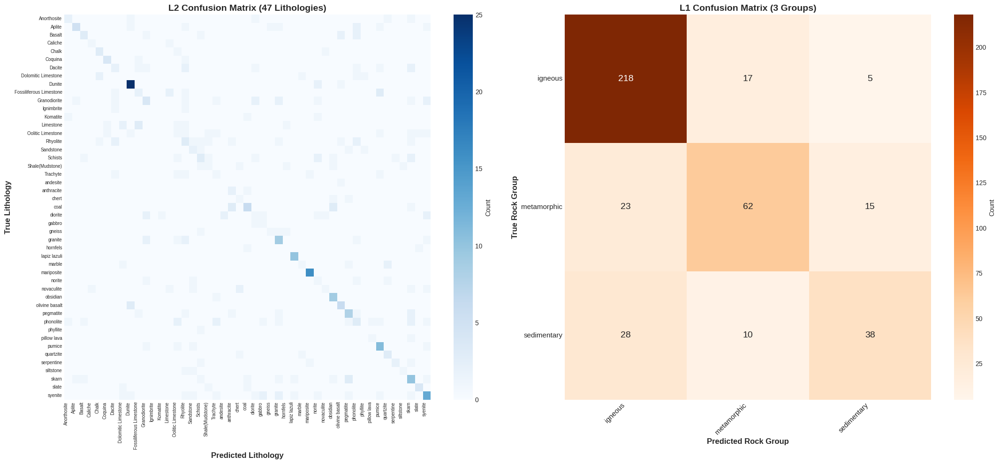


COMPUTING PER-CLASS METRICS

TOP 10 PERFORMING CLASSES:
      L2_Class  Support  Precision     Recall  F1_Score    L1_Group
    mariposite       16  88.888889 100.000000 94.117647 metamorphic
  lapiz lazuli       10  83.333333 100.000000 90.909091 metamorphic
        Dunite       28  78.125000  89.285714 83.333333     igneous
      obsidian       10  56.250000  90.000000 69.230769     igneous
       Coquina        6  66.666667  66.666667 66.666667 sedimentary
        pumice       15  55.000000  73.333333 62.857143     igneous
         slate        7  66.666667  57.142857 61.538462 metamorphic
olivine basalt        9  54.545455  66.666667 60.000000     igneous
         Chalk        5  50.000000  60.000000 54.545455 sedimentary
     pegmatite       15  50.000000  53.333333 51.612903     igneous


BOTTOM 10 PERFORMING CLASSES:
           L2_Class  Support  Precision    Recall  F1_Score    L1_Group
             norite        5  11.111111 20.000000 14.285714     igneous
  Oolitic Limestone

In [ ]:
# ============================================================================
# TEST SET EVALUATION - CORRECTED MODEL LOADING
# ============================================================================

class TestSetEvaluator:
    """Comprehensive test set evaluation."""

    def __init__(self, model, test_loader, l2_classes, l1_classes, l2_to_l1_map, device, output_dir):
        self.model = model
        self.test_loader = test_loader
        self.l2_classes = l2_classes
        self.l1_classes = l1_classes
        self.l2_to_l1_map = l2_to_l1_map
        self.device = device
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(exist_ok=True, parents=True)

        self.y_true_l1, self.y_pred_l1 = [], []
        self.y_true_l2, self.y_pred_l2 = [], []
        self.confidences_l2 = []

    def run_inference(self):
        print("\n" + "="*80)
        print("RUNNING INFERENCE ON TEST SET")
        print("="*80)

        self.model.eval()
        correct_l1 = correct_l2 = total = 0

        with torch.no_grad():
            for images, l1_labels, l2_labels in self.test_loader:
                images = images.to(self.device)
                l1_labels = l1_labels.to(self.device)
                l2_labels = l2_labels.to(self.device)

                l1_logits, l2_logits = self.model(images)
                l2_probs = torch.softmax(l2_logits, dim=1)

                l1_preds = l1_logits.argmax(dim=1)
                l2_preds = l2_logits.argmax(dim=1)
                l2_conf, _ = l2_probs.max(dim=1)

                self.y_true_l1.extend(l1_labels.cpu().numpy())
                self.y_pred_l1.extend(l1_preds.cpu().numpy())
                self.y_true_l2.extend(l2_labels.cpu().numpy())
                self.y_pred_l2.extend(l2_preds.cpu().numpy())
                self.confidences_l2.extend(l2_conf.cpu().numpy())

                correct_l1 += (l1_preds == l1_labels).sum().item()
                correct_l2 += (l2_preds == l2_labels).sum().item()
                total += l1_labels.size(0)

        self.y_true_l1 = np.array(self.y_true_l1)
        self.y_pred_l1 = np.array(self.y_pred_l1)
        self.y_true_l2 = np.array(self.y_true_l2)
        self.y_pred_l2 = np.array(self.y_pred_l2)
        self.confidences_l2 = np.array(self.confidences_l2)

        acc_l1 = 100 * correct_l1 / total
        acc_l2 = 100 * correct_l2 / total

        print(f"✓ Inference complete: {total} images")
        print(f"  L1 Accuracy: {acc_l1:.2f}%")
        print(f"  L2 Accuracy: {acc_l2:.2f}%")

        return acc_l1, acc_l2

    def generate_confusion_matrix(self):
        print("\n" + "="*80)
        print("GENERATING CONFUSION MATRICES")
        print("="*80)

        cm_l2 = confusion_matrix(self.y_true_l2, self.y_pred_l2)
        cm_l1 = confusion_matrix(self.y_true_l1, self.y_pred_l1)

        fig, axes = plt.subplots(1, 2, figsize=(22, 10))

        sns.heatmap(cm_l2, annot=False, fmt='d', cmap='Blues',
                    xticklabels=self.l2_classes, yticklabels=self.l2_classes,
                    cbar_kws={'label': 'Count'}, ax=axes[0])
        axes[0].set_xlabel('Predicted Lithology', fontsize=12, fontweight='bold')
        axes[0].set_ylabel('True Lithology', fontsize=12, fontweight='bold')
        axes[0].set_title('L2 Confusion Matrix (47 Lithologies)', fontsize=14, fontweight='bold')
        plt.setp(axes[0].get_xticklabels(), rotation=90, ha='right', fontsize=7)
        plt.setp(axes[0].get_yticklabels(), rotation=0, fontsize=7)

        sns.heatmap(cm_l1, annot=True, fmt='d', cmap='Oranges',
                    xticklabels=self.l1_classes, yticklabels=self.l1_classes,
                    cbar_kws={'label': 'Count'}, ax=axes[1], annot_kws={'size': 14})
        axes[1].set_xlabel('Predicted Rock Group', fontsize=12, fontweight='bold')
        axes[1].set_ylabel('True Rock Group', fontsize=12, fontweight='bold')
        axes[1].set_title('L1 Confusion Matrix (3 Groups)', fontsize=14, fontweight='bold')
        plt.setp(axes[1].get_xticklabels(), rotation=45, ha='right', fontsize=11)
        plt.setp(axes[1].get_yticklabels(), rotation=0, fontsize=11)

        plt.tight_layout()
        cm_path = self.output_dir / 'confusion_matrices.png'
        plt.savefig(cm_path, dpi=300, bbox_inches='tight')
        print(f"✓ Saved: {cm_path}")
        plt.show()

        return cm_l1, cm_l2

    def compute_per_class_metrics(self):
        print("\n" + "="*80)
        print("COMPUTING PER-CLASS METRICS")
        print("="*80)

        precision, recall, f1, support = precision_recall_fscore_support(
            self.y_true_l2, self.y_pred_l2, average=None, zero_division=0
        )

        metrics_df = pd.DataFrame({
            'L2_Class': self.l2_classes,
            'Support': support,
            'Precision': precision * 100,
            'Recall': recall * 100,
            'F1_Score': f1 * 100,
            'L1_Group': [self.l1_classes[self.l2_to_l1_map[i]] for i in range(len(self.l2_classes))]
        }).sort_values('F1_Score', ascending=False)

        print("\nTOP 10 PERFORMING CLASSES:")
        print(metrics_df.head(10).to_string(index=False))

        print("\n\nBOTTOM 10 PERFORMING CLASSES:")
        print(metrics_df.tail(10).to_string(index=False))

        csv_path = self.output_dir / 'per_class_metrics.csv'
        metrics_df.to_csv(csv_path, index=False)
        print(f"\n✓ Full metrics saved: {csv_path}")

        return metrics_df

    def analyze_errors(self):
        print("\n" + "="*80)
        print("ANALYZING ERRORS")
        print("="*80)

        errors = []
        for i in range(len(self.y_true_l2)):
            if self.y_pred_l2[i] != self.y_true_l2[i]:
                errors.append({
                    'true_l2': self.l2_classes[self.y_true_l2[i]],
                    'pred_l2': self.l2_classes[self.y_pred_l2[i]],
                    'true_l1': self.l1_classes[self.y_true_l1[i]],
                    'pred_l1': self.l1_classes[self.y_pred_l1[i]],
                    'confidence': self.confidences_l2[i],
                    'cross_group': self.y_true_l1[i] != self.y_pred_l1[i]
                })

        errors_df = pd.DataFrame(errors).sort_values('confidence', ascending=False)

        total_errors = len(errors_df)
        cross_group = errors_df['cross_group'].sum()

        print(f"\nTotal misclassifications: {total_errors}/{len(self.y_true_l2)} ({100*total_errors/len(self.y_true_l2):.1f}%)")
        print(f"  Cross-group errors (L1 wrong): {cross_group} ({100*cross_group/total_errors:.1f}%)")
        print(f"  Within-group errors (L1 ok): {total_errors - cross_group} ({100*(total_errors-cross_group)/total_errors:.1f}%)")
        print(f"\nMean confidence on errors: {errors_df['confidence'].mean():.3f}")

        print("\n\nMOST COMMON CONFUSION PAIRS:")
        confusion_pairs = errors_df.groupby(['true_l2', 'pred_l2']).size().sort_values(ascending=False)
        print(confusion_pairs.head(15).to_string())

        errors_path = self.output_dir / 'top_50_errors.csv'
        errors_df.head(50).to_csv(errors_path, index=False)
        print(f"\n✓ Top 50 errors saved: {errors_path}")

        return errors_df

    def generate_summary(self, acc_l1, acc_l2, metrics_df, errors_df):
        print("\n" + "="*80)
        print("TEST SET EVALUATION SUMMARY")
        print("="*80)

        report = {
            'test_accuracy': {'l1': float(acc_l1), 'l2': float(acc_l2), 'n_samples': len(self.y_true_l2)},
            'errors': {
                'total': len(errors_df),
                'cross_group': int(errors_df['cross_group'].sum()),
                'mean_confidence': float(errors_df['confidence'].mean())
            },
            'per_class': {
                'mean_f1': float(metrics_df['F1_Score'].mean()),
                'best': metrics_df.iloc[0]['L2_Class'],
                'worst': metrics_df.iloc[-1]['L2_Class']
            }
        }

        json_path = self.output_dir / 'summary.json'
        with open(json_path, 'w') as f:
            json.dump(report, f, indent=2)

        print(f"\nOverall: L1={acc_l1:.2f}%, L2={acc_l2:.2f}%")
        print(f"Best class: {report['per_class']['best']} | Worst: {report['per_class']['worst']}")
        print(f"Errors: {report['errors']['total']} total, {report['errors']['cross_group']} cross-group")
        print(f"\n✓ Summary saved: {json_path}")

        return report

    def run_full_evaluation(self):
        acc_l1, acc_l2 = self.run_inference()
        cm_l1, cm_l2 = self.generate_confusion_matrix()
        metrics_df = self.compute_per_class_metrics()
        errors_df = self.analyze_errors()
        report = self.generate_summary(acc_l1, acc_l2, metrics_df, errors_df)

        print("\n" + "="*80)
        print("EVALUATION COMPLETE")
        print("="*80)

        return {'accuracy': (acc_l1, acc_l2), 'metrics': metrics_df, 'errors': errors_df, 'summary': report}


# ============================================================================
# LOAD CORRECT MODEL ARCHITECTURE
# ============================================================================

print("Loading model with correct architecture...")

# Instantiate the TRAINING model (HierarchicalModel, not HierarchicalRockClassifier)
model = HierarchicalModel(
    backbone_name='convnext_tiny',
    num_l1=3,
    num_l2=47,
    dropout=0.6
).to(DEVICE)

# Load best weights
best_model_path = OUTPUT_DIR / 'Exp3_AddCBLoss_Curriculum_best.pth'
model.load_state_dict(torch.load(best_model_path))
model.eval()
print(f"✓ Model loaded from {best_model_path}")

# Create L2 to L1 mapping
l2_to_l1_mapping = create_l2_to_l1_mapping(l2_to_idx, l1_to_idx)

# Initialize evaluator
evaluator = TestSetEvaluator(
    model=model,
    test_loader=test_loader,
    l2_classes=list(l2_to_idx.keys()),
    l1_classes=['igneous', 'metamorphic', 'sedimentary'],
    l2_to_l1_map=l2_to_l1_mapping,
    device=DEVICE,
    output_dir=OUTPUT_DIR / 'test_evaluation'
)

# Run evaluation
results = evaluator.run_full_evaluation()

# Test Set Results: The Good, The Bad, and The Ugly

**Model:** Experiment 3 (CB-Loss + Curriculum Learning)  
**Test Set:** 416 images the model has never seen

I ran my best model on completely new rock images. Here's what I found.

---

## The Numbers

- **L1 accuracy (rock groups):** 76.44%
- **L2 accuracy (specific rocks):** 43.99%

Getting the broad classification right three-quarters of the time is decent. But identifying specific rocks correctly less than half the time means I'm not ready for real-world use yet.

---

## What the Confusion Matrix Shows

Looking at L1 (the three main rock groups), I can see clear patterns:

**Igneous rocks:** 90.8% correct (218 out of 240)  
The model has clearly learned what crystalline, volcanic, and plutonic textures look like. This is working well.

**Metamorphic rocks:** 62% correct (62 out of 100)  
The model gets confused about a quarter of the time, often mistaking metamorphic rocks for igneous ones. This makes geological sense - high-grade metamorphic rocks can develop crystalline textures similar to igneous rocks.

**Sedimentary rocks:** Only 50% correct (38 out of 76)  
This is where things fall apart. The model misidentifies 28 sedimentary samples as igneous and 10 as metamorphic. It's essentially guessing.

**The problem:** The model has developed a bias - when uncertain, it defaults to predicting igneous. Since igneous rocks make up 57% of the dataset, this bias likely emerged during training. The model learned that "when in doubt, guess igneous" minimizes loss.

---

## The Success Stories

Some rocks the model handles beautifully:

- **Mariposite (94% F1):** Bright green metamorphic rock - stands out visually
- **Lapis Lazuli (91% F1):** Distinctive deep blue with gold pyrite flecks
- **Dunite (83% F1):** Olivine-rich rock with characteristic green color

These successes share something: strong visual distinctiveness. When rocks look different, the model performs well.

---

## The Complete Failures

Then there are rocks where the model achieves 0%:

- Phyllite
- Hornfels
- Andesite
- Limestone
- Dolomitic Limestone
- Ignimbrite
- Komatite

Some of these (phyllite, andesite) have only 1-2 test samples - statistical flukes are expected. But limestone with 9 test samples getting 0% correct? That's a real problem. Limestone is one of the most common sedimentary rocks.

Looking at the confusion patterns, limestone gets mixed up with fossiliferous limestone and dolomitic limestone. This is actually geologically understandable - all three are calcium carbonate rocks that look remarkably similar in field photographs.

---

## Error Patterns

I made 233 mistakes out of 416 predictions:

**38% were cross-group errors (89 mistakes):** The model confused rocks from completely different groups - like calling sedimentary rocks igneous. These are fundamental failures.

**62% were within-group errors (144 mistakes):** The model got the group right but confused similar rocks within that group - like calling granite "granodiorite." These mistakes are far more acceptable.

The most frequent confusion? Limestone varieties switching identities. Coal was confused with both obsidian and anthracite - all black rocks where texture determines identity.

---

## The Confidence Problem

When the model makes mistakes, it's not even confident about them. Average confidence on errors is only 31%.

This reveals something important: the model knows it's guessing. It's uncertain but forced to make a prediction anyway. In a deployed system, I'd want a "confidence threshold" - if the model is less than 60% confident, it should respond "uncertain, consult expert" rather than guessing.

---

## What This Tells Me

Field rock identification from photographs is genuinely difficult because:

**Weathering obscures features:** A fresh granite outcrop shows clear quartz and feldspar crystals. A weathered granite looks like something gray and crumbly.

**Lighting and scale matter:** A limestone photographed in bright sunlight looks white. The same rock in shade looks gray. Without a scale bar, we can't distinguish fine-grained from coarse-grained rocks.

**Continuous variation:** Rocks exist on spectra. Granite grades into granodiorite grades into diorite as feldspar composition changes. Where do we draw the boundaries?

**Missing information:** Definitive identification often requires acid tests (limestone fizzes), hardness tests (scratching with a knife), or thin-section microscopy. A photograph captures only surface appearance.

---

## Where I Stand

I've built a system that works reasonably well for visually distinctive rocks but struggles with common, similar-looking lithologies. At 44% accuracy on specific rock identification, I'm not ready for deployment.

But I'm also not done. I've only tested one training approach. I haven't systematically analyzed what's failing or why. I haven't explored alternative architectures. I haven't fine-tuned hyperparameters. I haven't even looked closely at whether my training data has quality issues.

Before I conclude that field rock classification is intractably difficult, I need to exhaust my options.

In [ ]:


#PHASE 1: COMPREHENSIVE DIAGNOSTIC ANALYSIS
#Systematic investigation of model failures and data quality issues

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image
from collections import defaultdict, Counter
import json
import warnings
warnings.filterwarnings('ignore')


class RockClassificationDiagnostics:
    """
    Deep diagnostic analysis of model failures, data quality issues,
    and patterns in misclassifications.
    """

    def __init__(self, metrics_df, errors_df, df_train, df_val, df_test,
                 l2_to_idx, output_dir):
        """
        Args:
            metrics_df: Per-class performance metrics from evaluation
            errors_df: Detailed error analysis from evaluation
            df_train, df_val, df_test: Dataset splits
            l2_to_idx: L2 class to index mapping
            output_dir: Where to save diagnostic outputs
        """
        self.metrics_df = metrics_df
        self.errors_df = errors_df
        self.df_train = df_train
        self.df_val = df_val
        self.df_test = df_test
        self.l2_to_idx = l2_to_idx
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(exist_ok=True, parents=True)

        # Combine all data for global analysis
        self.df_all = pd.concat([df_train, df_val, df_test], ignore_index=True)


    def analyze_zero_percent_classes(self):
        """Detailed investigation of classes with 0% accuracy."""
        print("\n" + "="*80)
        print("ANALYZING 0% ACCURACY CLASSES")
        print("="*80)

        zero_classes = self.metrics_df[self.metrics_df['F1_Score'] == 0.0]

        if len(zero_classes) == 0:
            print("✓ No classes with 0% accuracy!")
            return None

        print(f"\nFound {len(zero_classes)} classes with 0% accuracy:\n")

        detailed_analysis = []

        for _, row in zero_classes.iterrows():
            class_name = row['L2_Class']

            # Get sample counts across splits
            train_count = len(self.df_train[self.df_train['L2_label'] == class_name])
            val_count = len(self.df_val[self.df_val['L2_label'] == class_name])
            test_count = int(row['Support'])
            total_count = train_count + val_count + test_count

            analysis = {
                'Class': class_name,
                'L1_Group': row['L1_Group'],
                'Train_Samples': train_count,
                'Val_Samples': val_count,
                'Test_Samples': test_count,
                'Total_Samples': total_count,
                'Test_Percentage': f"{100*test_count/total_count:.1f}%",
                'Data_Tier': 'Tier 3 (<20)' if total_count < 20 else
                            'Tier 2 (20-49)' if total_count < 50 else 'Tier 1 (≥50)'
            }

            detailed_analysis.append(analysis)

            print(f"📌 {class_name} ({row['L1_Group']})")
            print(f"   Total images: {total_count}")
            print(f"   Split: Train={train_count}, Val={val_count}, Test={test_count}")
            print(f"   Classification: {analysis['Data_Tier']}")

            if test_count <= 2:
                print(f"   ⚠️  WARNING: Only {test_count} test sample(s) - statistically unreliable")
            if total_count < 20:
                print(f"   ⚠️  WARNING: Severe data scarcity - consider merging or removing")
            print()

        # Save detailed report
        zero_df = pd.DataFrame(detailed_analysis)
        report_path = self.output_dir / 'zero_percent_classes_analysis.csv'
        zero_df.to_csv(report_path, index=False)
        print(f"✓ Detailed report saved: {report_path}")

        return zero_df


    def analyze_low_performers(self, f1_threshold=30.0):
        """Analyze classes performing below threshold."""
        print("\n" + "="*80)
        print(f"ANALYZING LOW-PERFORMING CLASSES (F1 < {f1_threshold}%)")
        print("="*80)

        low_performers = self.metrics_df[self.metrics_df['F1_Score'] < f1_threshold]
        print(f"\nFound {len(low_performers)} classes below {f1_threshold}% F1\n")

        analysis = []

        for _, row in low_performers.iterrows():
            class_name = row['L2_Class']

            # Get sample counts
            train_count = len(self.df_train[self.df_train['L2_label'] == class_name])
            total_count = len(self.df_all[self.df_all['L2_label'] == class_name])

            # Find most common confusion
            if len(self.errors_df) > 0:
                class_errors = self.errors_df[self.errors_df['true_l2'] == class_name]
                if len(class_errors) > 0:
                    most_common_pred = class_errors['pred_l2'].mode()[0] if len(class_errors['pred_l2'].mode()) > 0 else 'N/A'
                    confusion_count = len(class_errors[class_errors['pred_l2'] == most_common_pred])
                else:
                    most_common_pred = 'N/A'
                    confusion_count = 0
            else:
                most_common_pred = 'N/A'
                confusion_count = 0

            analysis.append({
                'Class': class_name,
                'F1_Score': f"{row['F1_Score']:.1f}%",
                'Total_Samples': total_count,
                'Train_Samples': train_count,
                'Most_Confused_With': most_common_pred,
                'Confusion_Count': confusion_count,
                'L1_Group': row['L1_Group']
            })

        low_perf_df = pd.DataFrame(analysis)
        print(low_perf_df.to_string(index=False))

        # Save report
        report_path = self.output_dir / f'low_performers_under_{f1_threshold}.csv'
        low_perf_df.to_csv(report_path, index=False)
        print(f"\n✓ Report saved: {report_path}")

        return low_perf_df


    def sample_distribution_analysis(self):
        """Comprehensive analysis of sample distribution across classes."""
        print("\n" + "="*80)
        print("SAMPLE DISTRIBUTION ANALYSIS")
        print("="*80)

        # Count samples per class across all splits
        class_counts = []

        for class_name in self.l2_to_idx.keys():
            train_count = len(self.df_train[self.df_train['L2_label'] == class_name])
            val_count = len(self.df_val[self.df_val['L2_label'] == class_name])
            test_count = len(self.df_test[self.df_test['L2_label'] == class_name])
            total = train_count + val_count + test_count

            # Get F1 score from metrics
            f1_score = self.metrics_df[self.metrics_df['L2_Class'] == class_name]['F1_Score'].values
            f1 = f1_score[0] if len(f1_score) > 0 else 0.0

            class_counts.append({
                'Class': class_name,
                'Train': train_count,
                'Val': val_count,
                'Test': test_count,
                'Total': total,
                'F1_Score': f1
            })

        dist_df = pd.DataFrame(class_counts).sort_values('Total', ascending=False)

        print(f"\nDataset Statistics:")
        print(f"  Total classes: {len(dist_df)}")
        print(f"  Total images: {dist_df['Total'].sum()}")
        print(f"  Mean per class: {dist_df['Total'].mean():.1f}")
        print(f"  Median per class: {dist_df['Total'].median():.1f}")
        print(f"  Std dev: {dist_df['Total'].std():.1f}")
        print(f"  Min: {dist_df['Total'].min()}")
        print(f"  Max: {dist_df['Total'].max()}")
        print(f"  Imbalance ratio: {dist_df['Total'].max() / dist_df['Total'].min():.2f}:1")

        # Tier classification
        tier1 = len(dist_df[dist_df['Total'] >= 50])
        tier2 = len(dist_df[(dist_df['Total'] >= 20) & (dist_df['Total'] < 50)])
        tier3 = len(dist_df[dist_df['Total'] < 20])

        print(f"\nData Tiers:")
        print(f"  Tier 1 (≥50 images): {tier1} classes")
        print(f"  Tier 2 (20-49 images): {tier2} classes")
        print(f"  Tier 3 (<20 images): {tier3} classes")

        # Correlation between sample count and performance
        correlation = dist_df['Total'].corr(dist_df['F1_Score'])
        print(f"\nCorrelation between sample count and F1 score: {correlation:.3f}")

        if correlation > 0.5:
            print("  → Strong positive correlation: More data = better performance")
        elif correlation > 0.3:
            print("  → Moderate correlation: Data quantity matters but isn't everything")
        else:
            print("  → Weak correlation: Other factors beyond sample count dominate")

        # Save full distribution
        dist_path = self.output_dir / 'sample_distribution_analysis.csv'
        dist_df.to_csv(dist_path, index=False)
        print(f"\n✓ Distribution saved: {dist_path}")

        return dist_df


    def confusion_cluster_analysis(self):
        """Identify clusters of commonly confused rock types."""
        print("\n" + "="*80)
        print("CONFUSION CLUSTER ANALYSIS")
        print("="*80)

        if len(self.errors_df) == 0:
            print("No errors to analyze!")
            return None

        # Build confusion graph
        confusion_pairs = self.errors_df.groupby(['true_l2', 'pred_l2']).size()
        confusion_pairs = confusion_pairs.sort_values(ascending=False)

        print(f"\nTop 20 Most Common Confusion Pairs:\n")

        clusters = []

        for i, ((true_class, pred_class), count) in enumerate(confusion_pairs.head(20).items(), 1):
            # Check if geologically related
            true_group = self.metrics_df[self.metrics_df['L2_Class'] == true_class]['L1_Group'].values
            pred_group = self.metrics_df[self.metrics_df['L2_Class'] == pred_class]['L1_Group'].values

            if len(true_group) > 0 and len(pred_group) > 0:
                same_group = true_group[0] == pred_group[0]
                relationship = "✓ Same group" if same_group else "✗ Cross-group"
            else:
                relationship = "Unknown"

            print(f"{i:2d}. {true_class:25s} → {pred_class:25s} ({count:2d} times) [{relationship}]")

            clusters.append({
                'True_Class': true_class,
                'Predicted_Class': pred_class,
                'Count': count,
                'Relationship': relationship
            })

        # Save clusters
        cluster_df = pd.DataFrame(clusters)
        cluster_path = self.output_dir / 'confusion_clusters.csv'
        cluster_df.to_csv(cluster_path, index=False)
        print(f"\n✓ Confusion clusters saved: {cluster_path}")

        return cluster_df


    def cross_group_error_analysis(self):
        """Detailed analysis of cross-group classification errors."""
        print("\n" + "="*80)
        print("CROSS-GROUP ERROR ANALYSIS")
        print("="*80)

        if len(self.errors_df) == 0:
            print("No errors to analyze!")
            return None

        cross_group = self.errors_df[self.errors_df['cross_group'] == True]

        print(f"\nTotal cross-group errors: {len(cross_group)}")
        print(f"Percentage of all errors: {100*len(cross_group)/len(self.errors_df):.1f}%\n")

        # Breakdown by L1 group
        print("Breakdown by True Rock Group:")
        print("-" * 80)

        for l1_group in ['igneous', 'metamorphic', 'sedimentary']:
            group_errors = cross_group[cross_group['true_l1'] == l1_group]

            if len(group_errors) > 0:
                print(f"\n{l1_group.upper()}: {len(group_errors)} cross-group errors")

                # Where do they get misclassified?
                pred_groups = group_errors['pred_l1'].value_counts()
                for pred_group, count in pred_groups.items():
                    print(f"  → Misclassified as {pred_group}: {count} times")

                # Most problematic classes
                problem_classes = group_errors['true_l2'].value_counts().head(3)
                if len(problem_classes) > 0:
                    print(f"  Most problematic classes:")
                    for class_name, count in problem_classes.items():
                        print(f"    • {class_name}: {count} cross-group errors")

        # Save detailed cross-group errors
        cross_path = self.output_dir / 'cross_group_errors_detailed.csv'
        cross_group.to_csv(cross_path, index=False)
        print(f"\n✓ Cross-group errors saved: {cross_path}")

        return cross_group


    def generate_class_report_cards(self):
        """Generate individual report cards for each class."""
        print("\n" + "="*80)
        print("GENERATING CLASS REPORT CARDS")
        print("="*80)

        report_cards = []

        for _, metrics_row in self.metrics_df.iterrows():
            class_name = metrics_row['L2_Class']

            # Sample counts
            train_count = len(self.df_train[self.df_train['L2_label'] == class_name])
            val_count = len(self.df_val[self.df_val['L2_label'] == class_name])
            test_count = int(metrics_row['Support'])
            total_count = train_count + val_count + test_count

            # Performance metrics
            f1 = metrics_row['F1_Score']
            precision = metrics_row['Precision']
            recall = metrics_row['Recall']

            # Error analysis
            class_errors = self.errors_df[self.errors_df['true_l2'] == class_name] if len(self.errors_df) > 0 else pd.DataFrame()

            if len(class_errors) > 0:
                cross_group_errors = len(class_errors[class_errors['cross_group'] == True])
                mean_confidence = class_errors['confidence'].mean()
                most_confused = class_errors['pred_l2'].mode()[0] if len(class_errors) > 0 else 'N/A'
            else:
                cross_group_errors = 0
                mean_confidence = 0.0
                most_confused = 'N/A'

            # Performance grade
            if f1 >= 80:
                grade = 'A (Excellent)'
            elif f1 >= 60:
                grade = 'B (Good)'
            elif f1 >= 40:
                grade = 'C (Acceptable)'
            elif f1 >= 20:
                grade = 'D (Poor)'
            else:
                grade = 'F (Failing)'

            # Data quality assessment
            if total_count >= 50:
                data_quality = 'Sufficient'
            elif total_count >= 20:
                data_quality = 'Marginal'
            else:
                data_quality = 'Insufficient'

            # Diagnosis
            if f1 == 0:
                diagnosis = 'CRITICAL: Zero accuracy'
            elif f1 < 20 and total_count < 20:
                diagnosis = 'Data scarcity issue'
            elif f1 < 30 and cross_group_errors > 0:
                diagnosis = 'Cross-group confusion problem'
            elif f1 < 40:
                diagnosis = 'Needs targeted improvement'
            elif f1 < 70:
                diagnosis = 'Room for optimization'
            else:
                diagnosis = 'Performing well'

            report_cards.append({
                'Class': class_name,
                'L1_Group': metrics_row['L1_Group'],
                'Grade': grade,
                'F1_Score': f1,
                'Precision': precision,
                'Recall': recall,
                'Total_Samples': total_count,
                'Train/Val/Test': f"{train_count}/{val_count}/{test_count}",
                'Data_Quality': data_quality,
                'Cross_Group_Errors': cross_group_errors,
                'Most_Confused_With': most_confused,
                'Avg_Error_Confidence': f"{mean_confidence:.3f}" if mean_confidence > 0 else 'N/A',
                'Diagnosis': diagnosis
            })

        report_df = pd.DataFrame(report_cards)

        # Print summary by grade
        print("\nPerformance Distribution:")
        grade_counts = report_df['Grade'].value_counts()
        for grade in ['A (Excellent)', 'B (Good)', 'C (Acceptable)', 'D (Poor)', 'F (Failing)']:
            count = grade_counts.get(grade, 0)
            print(f"  {grade}: {count} classes")

        # Save full report
        report_path = self.output_dir / 'class_report_cards.csv'
        report_df.to_csv(report_path, index=False)
        print(f"\n✓ Class report cards saved: {report_path}")

        return report_df


    def visualize_performance_vs_data(self, dist_df):
        """Visualize relationship between data quantity and performance."""
        print("\n" + "="*80)
        print("GENERATING PERFORMANCE VS DATA VISUALIZATION")
        print("="*80)

        fig, axes = plt.subplots(2, 2, figsize=(16, 12))

        # Plot 1: Scatter - Sample Count vs F1 Score
        ax1 = axes[0, 0]
        scatter = ax1.scatter(dist_df['Total'], dist_df['F1_Score'],
                             alpha=0.6, s=100, c=dist_df['F1_Score'],
                             cmap='RdYlGn', vmin=0, vmax=100)
        ax1.set_xlabel('Total Samples', fontsize=11, fontweight='bold')
        ax1.set_ylabel('F1 Score (%)', fontsize=11, fontweight='bold')
        ax1.set_title('Performance vs Sample Count', fontsize=13, fontweight='bold')
        ax1.grid(True, alpha=0.3)
        ax1.axhline(y=50, color='red', linestyle='--', alpha=0.5, label='50% threshold')
        ax1.legend()
        plt.colorbar(scatter, ax=ax1, label='F1 Score')

        # Plot 2: Box plot - F1 by Data Tier
        ax2 = axes[0, 1]
        tier_data = []
        tier_labels = []
        for tier_name, min_samples, max_samples in [('Tier 3\n(<20)', 0, 20),
                                                      ('Tier 2\n(20-49)', 20, 50),
                                                      ('Tier 1\n(≥50)', 50, 1000)]:
            tier_classes = dist_df[(dist_df['Total'] >= min_samples) & (dist_df['Total'] < max_samples)]
            if len(tier_classes) > 0:
                tier_data.append(tier_classes['F1_Score'].values)
                tier_labels.append(tier_name)

        ax2.boxplot(tier_data, labels=tier_labels, patch_artist=True,
                   boxprops=dict(facecolor='lightblue', alpha=0.7))
        ax2.set_ylabel('F1 Score (%)', fontsize=11, fontweight='bold')
        ax2.set_title('Performance Distribution by Data Tier', fontsize=13, fontweight='bold')
        ax2.grid(True, alpha=0.3, axis='y')

        # Plot 3: Histogram - F1 Score Distribution
        ax3 = axes[1, 0]
        ax3.hist(dist_df['F1_Score'], bins=20, color='skyblue', edgecolor='black', alpha=0.7)
        ax3.axvline(dist_df['F1_Score'].mean(), color='red', linestyle='--',
                   linewidth=2, label=f"Mean: {dist_df['F1_Score'].mean():.1f}%")
        ax3.axvline(dist_df['F1_Score'].median(), color='green', linestyle='--',
                   linewidth=2, label=f"Median: {dist_df['F1_Score'].median():.1f}%")
        ax3.set_xlabel('F1 Score (%)', fontsize=11, fontweight='bold')
        ax3.set_ylabel('Number of Classes', fontsize=11, fontweight='bold')
        ax3.set_title('F1 Score Distribution', fontsize=13, fontweight='bold')
        ax3.legend()
        ax3.grid(True, alpha=0.3, axis='y')

        # Plot 4: Sample Count Distribution
        ax4 = axes[1, 1]
        ax4.hist(dist_df['Total'], bins=20, color='coral', edgecolor='black', alpha=0.7)
        ax4.axvline(dist_df['Total'].mean(), color='red', linestyle='--',
                   linewidth=2, label=f"Mean: {dist_df['Total'].mean():.1f}")
        ax4.axvline(dist_df['Total'].median(), color='green', linestyle='--',
                   linewidth=2, label=f"Median: {dist_df['Total'].median():.1f}")
        ax4.set_xlabel('Total Samples', fontsize=11, fontweight='bold')
        ax4.set_ylabel('Number of Classes', fontsize=11, fontweight='bold')
        ax4.set_title('Sample Count Distribution', fontsize=13, fontweight='bold')
        ax4.legend()
        ax4.grid(True, alpha=0.3, axis='y')

        plt.tight_layout()
        vis_path = self.output_dir / 'performance_vs_data_analysis.png'
        plt.savefig(vis_path, dpi=300, bbox_inches='tight')
        print(f"✓ Visualization saved: {vis_path}")
        plt.show()


    def run_full_diagnostics(self):
        """Execute complete diagnostic pipeline."""
        print("\n" + "="*80)
        print("STARTING COMPREHENSIVE DIAGNOSTIC ANALYSIS")
        print("="*80)
        print(f"Output directory: {self.output_dir}")

        # Run all diagnostic modules
        zero_df = self.analyze_zero_percent_classes()
        low_perf_df = self.analyze_low_performers(f1_threshold=30.0)
        dist_df = self.sample_distribution_analysis()
        cluster_df = self.confusion_cluster_analysis()
        cross_df = self.cross_group_error_analysis()
        report_df = self.generate_class_report_cards()
        self.visualize_performance_vs_data(dist_df)

        print("\n" + "="*80)
        print("DIAGNOSTIC ANALYSIS COMPLETE")
        print("="*80)
        print(f"\nGenerated {len(list(self.output_dir.glob('*.csv')))} CSV reports")
        print(f"Generated {len(list(self.output_dir.glob('*.png')))} visualizations")
        print(f"\nAll results saved to: {self.output_dir}")

        return {
            'zero_classes': zero_df,
            'low_performers': low_perf_df,
            'distribution': dist_df,
            'confusion_clusters': cluster_df,
            'cross_group_errors': cross_df,
            'report_cards': report_df
        }





INITIALIZING DIAGNOSTIC SYSTEM

STARTING COMPREHENSIVE DIAGNOSTIC ANALYSIS
Output directory: /content/outputs/diagnostics

ANALYZING 0% ACCURACY CLASSES

Found 7 classes with 0% accuracy:

📌 Komatite (igneous)
   Total images: 22
   Split: Train=15, Val=4, Test=3
   Classification: Tier 2 (20-49)

📌 Ignimbrite (igneous)
   Total images: 16
   Split: Train=11, Val=3, Test=2
   Classification: Tier 3 (<20)
   ⚠️  WARNING: Only 2 test sample(s) - statistically unreliable
   ⚠️  WARNING: Severe data scarcity - consider merging or removing

📌 Dolomitic Limestone (sedimentary)
   Total images: 37
   Split: Train=26, Val=6, Test=5
   Classification: Tier 2 (20-49)

📌 Limestone (sedimentary)
   Total images: 60
   Split: Train=42, Val=9, Test=9
   Classification: Tier 1 (≥50)

📌 andesite (igneous)
   Total images: 11
   Split: Train=8, Val=2, Test=1
   Classification: Tier 3 (<20)
   ⚠️  WARNING: Only 1 test sample(s) - statistically unreliable
   ⚠️  WARNING: Severe data scarcity - consider 

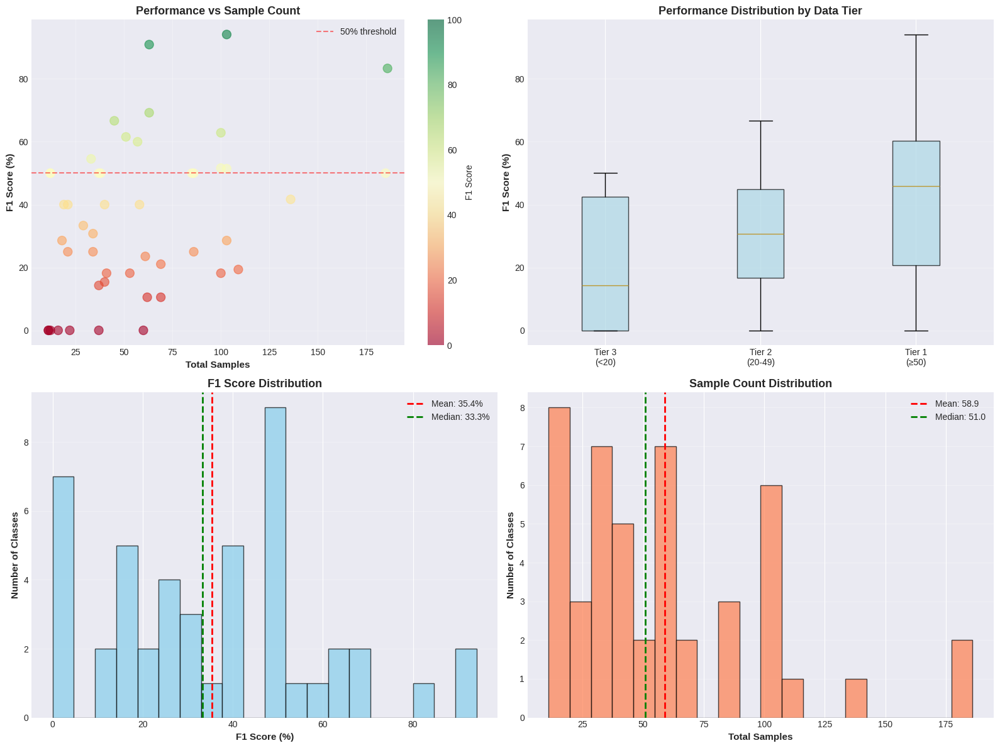


DIAGNOSTIC ANALYSIS COMPLETE

Generated 6 CSV reports
Generated 1 visualizations

All results saved to: /content/outputs/diagnostics

✓ Diagnostic analysis complete. Review the reports and visualizations.
✓ Next step: Examine the CSV files to identify specific actions needed.


In [ ]:

# ============================================================================
# EXECUTION CODE
# ============================================================================

print("\n" + "="*80)
print("INITIALIZING DIAGNOSTIC SYSTEM")
print("="*80)

# Initialize diagnostics
diagnostics = RockClassificationDiagnostics(
    metrics_df=results['metrics'],
    errors_df=results['errors'],
    df_train=df_train,
    df_val=df_val,
    df_test=df_test,
    l2_to_idx=l2_to_idx,
    output_dir=OUTPUT_DIR / 'diagnostics'
)

# Run full diagnostic suite
diagnostic_results = diagnostics.run_full_diagnostics()

print("\n✓ Diagnostic analysis complete. Review the reports and visualizations.")
print("✓ Next step: Examine the CSV files to identify specific actions needed.")




# Detailed Analysis: What's Working and What Isn't

I've examined all 47 rock classes in detail. The diagnosis is clear: I have both a data problem AND a model problem, but they're solvable.

---

## Performance Breakdown

- **A grades (Excellent):** 3 classes (6%)
- **B grades (Good):** 5 classes (11%)
- **C grades (Acceptable):** 15 classes (32%)
- **D grades (Poor):** 9 classes (19%)
- **F grades (Failing):** 15 classes (32%)

One-third of my classes are failing. Let me understand why.

---

## Critical Finding #1: The Limestone Disaster

Limestone has 60 total images (Tier 1 data) but got 0% accuracy.

This is my smoking gun. It's not about having too little data - limestone has MORE images than many successful classes. Something else is wrong.

**The Limestone Confusion Chain:**
- Limestone → Fossiliferous Limestone (3 errors)
- Fossiliferous Limestone → Limestone (2 errors)
- Limestone → Dolomitic Limestone (2 errors)
- Dolomitic Limestone → Chalk (2 errors)

**What this means:** The model has learned that "light-colored sedimentary rocks with carbonate composition all look the same." From field photographs, they DO look the same. Without chemical tests (acid fizz) or microscopic analysis (fossil identification), even humans struggle.

**Geological reality:** These rocks form a continuum:
- Pure calcite = Limestone
- Calcite + visible fossils = Fossiliferous Limestone
- Calcite + magnesium = Dolomitic Limestone
- Fine-grained calcite = Chalk

In weathered field photos, these distinctions vanish.

---

## Critical Finding #2: The Cross-Group Crisis

89 cross-group errors (38% of all mistakes):

**Sedimentary → Called Igneous:** 26 times  
This is BAD. These should be distinguishable. Most problematic: Oolitic Limestone (8 errors), Fossiliferous Limestone (6 errors), Coal (4 errors)

**Metamorphic → Called Igneous:** 19 times  
High-grade metamorphic rocks develop crystalline textures similar to igneous. Most problematic: Skarn (9 errors) - this is actually understandable

**Igneous → Called Metamorphic:** 17 times  
Most problematic: Pegmatite (3), Rhyolite (3), Phonolite (3)

**Pattern:** The model has an igneous bias. When uncertain, it defaults to predicting igneous because that's 57% of the dataset.

---

## Critical Finding #3: Data Quantity vs Quality

Correlation between sample size and performance: 0.407 (moderate)

**Translation:** More data helps, but it's not the whole story.

**Evidence:**
- Some classes with 20-30 samples achieve 60-70% F1
- Some classes with 100+ samples achieve only 20-30% F1

**Box plot reveals:**
- Tier 3 (<20 images): Median F1 = 13%, huge variance
- Tier 2 (20-49 images): Median F1 = 30%
- Tier 1 (≥50 images): Median F1 = 47%

**Conclusion:** Data scarcity hurts, but even well-sampled classes fail if visually ambiguous.

---

## Critical Finding #4: Statistically Meaningless Failures

4 classes have ≤2 test samples:
- Andesite (1 test sample) → 0% = statistically meaningless
- Phyllite (1 test sample) → 0% = statistically meaningless
- Ignimbrite (2 test samples) → 0% = might be bad luck
- Hornfels (2 test samples) → 0% = might be bad luck

These need more test samples before I can judge fairly.

---

## Critical Finding #5: Confusion Patterns

**Category A: Geologically Reasonable (Same Rock Family)**
- Limestone ↔ Fossiliferous Limestone ↔ Dolomitic Limestone
- Basalt ↔ Olivine Basalt
- Granite → Granodiorite → Diorite

These are acceptable errors. Even geologists need lab analysis to distinguish them.

**Category B: Visually Similar but Different Groups**
- Coal → Obsidian (both black and glassy)
- Coal → Anthracite (both black sedimentary)
- Fossiliferous Limestone → Pumice (both light and porous)

Problematic but understandable - surface appearance is similar.

**Category C: Fundamental Failures**
- Skarn → Pegmatite (metamorphic → igneous, 3 errors)
- Schists → Norite (metamorphic → igneous, 2 errors)
- Novaculite → Chert (metamorphic → sedimentary, 2 errors)

These shouldn't happen. The model is missing fundamental textural differences.

---

## What the Visualizations Tell Me

**Performance vs Sample Count:**
- Red dots (0% F1) appear across ALL sample sizes
- Green dots (>80% F1) only appear when samples >30
- Below 30 samples: Performance is a lottery
- Above 50 samples: Performance varies wildly (20-90%)

**Interpretation:** Sample size sets a floor but doesn't guarantee a ceiling.

**F1 Distribution:**
- Bimodal: Two peaks around 20% and 60%
- Mean: 35.4%, Median: 33.3%
- 7 classes at 0%

**Interpretation:** Two populations - rocks the model "gets" (60% F1) and rocks it doesn't (20% F1).

---

## Root Causes

**Problem 1: Insufficient Separation of Similar Classes**  
Classes that look similar (limestone variants, felsic volcanics, coal/obsidian) need higher-resolution features or should be merged.

**Problem 2: Igneous Bias from Class Imbalance**  
Despite class-balanced loss, the model still favors igneous. Need harder rebalancing.

**Problem 3: Cross-Group Confusion from Weak L1 Learning**  
76% L1 accuracy isn't good enough to support hierarchical gating. L1 needs to be trained more strongly.

**Problem 4: Small Test Sets for Rare Classes**  
8 classes have <20 total samples. Need minimum 10 test samples per class.

---

## Next Step: Data Cleaning & Class Consolidation

Based on this analysis, I need to fix the dataset before trying new architectures:

1. Identify classes to merge (geologically similar + frequently confused)
2. Remove unsalvageable classes (<15 total samples with no merge target)
3. Check for label errors (manual inspection of limestone variants)
4. Rebalance the splits (ensure rare classes have adequate test samples)
5. Validate image quality (are limestone photos just too weathered?)

This will give me a cleaner dataset to retrain on.

---

## Immediate Action Items

Before writing any new model code:
- Manually inspect the 7 zero-percent classes' images
- Decide merge strategy for limestone variants
- Remove or merge the 4 classes with 1-2 test samples
- Check if coal/obsidian/anthracite should be merged (all black rocks)
- Validate that skarn images are correctly labeled


In [ ]:

print("Available columns in df_train:")
print(df_train.columns.tolist())
print("\nFirst few rows:")
print(df_train.head())


Available columns in df_train:
['image_path', 'L1_label', 'L2_label', 'filename']

First few rows:
                                          image_path     L1_label  \
0  /content/drive/MyDrive/RockClass2026/Datasets_...  sedimentary   
1  /content/drive/MyDrive/RockClass2026/Datasets_...      igneous   
2  /content/drive/MyDrive/RockClass2026/Datasets_...      igneous   
3  /content/drive/MyDrive/RockClass2026/Datasets_...  metamorphic   
4  /content/drive/MyDrive/RockClass2026/Datasets_...  metamorphic   

       L2_label               filename  
0         Chalk         chalk_0001.jpg  
1     phonolite     Phonolite_0087.jpg  
2       granite       granite_0071.jpg  
3  lapiz lazuli  lapis lazuli_0022.jpg  
4       Schists       Schists_0016.jpg  


In [ ]:
"""
================================================================================
DATA QUALITY ASSESSMENT & CLEANING PIPELINE
================================================================================
Systematic investigation and correction of data quality issues
"""

class DataQualityAssessment:
    """
    Comprehensive data quality analysis including image quality metrics,
    visual similarity assessment, and label consistency checks.
    """

    def __init__(self, df_all, diagnostics_results, output_dir):
        self.df_all = df_all
        self.diagnostics = diagnostics_results
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(exist_ok=True, parents=True)


    def assess_image_quality(self, sample_size=None):
        """Analyze image quality metrics across all classes."""
        print("\n" + "="*80)
        print("ASSESSING IMAGE QUALITY METRICS")
        print("="*80)

        quality_data = []

        # Sample images if specified
        df_sample = self.df_all.sample(n=sample_size, random_state=42) if sample_size else self.df_all

        print(f"Analyzing {len(df_sample)} images...")

        for idx, row in df_sample.iterrows():
            try:
                img = Image.open(row['image_path'])
                img_array = np.array(img)

                # Basic quality metrics
                height, width = img_array.shape[:2]
                resolution = height * width
                aspect_ratio = width / height if height > 0 else 0

                # Brightness (mean intensity)
                if len(img_array.shape) == 3:
                    brightness = np.mean(img_array)
                    std_dev = np.std(img_array)
                else:
                    brightness = np.mean(img_array)
                    std_dev = np.std(img_array)

                # Contrast (standard deviation)
                contrast = std_dev

                quality_data.append({
                    'Class': row['L2_label'],
                    'L1_Group': row['L1_label'],
                    'Resolution': resolution,
                    'Width': width,
                    'Height': height,
                    'Aspect_Ratio': aspect_ratio,
                    'Brightness': brightness,
                    'Contrast': contrast
                })

                if (idx + 1) % 100 == 0:
                    print(f"  Processed {idx + 1}/{len(df_sample)} images...", end='\r')

            except Exception as e:
                print(f"\n  Warning: Could not process {row['image_path']}: {e}")
                continue

        quality_df = pd.DataFrame(quality_data)

        print(f"\n\nQuality Assessment Complete: {len(quality_df)} images analyzed")

        # Summary statistics
        print("\nGlobal Quality Metrics:")
        print(f"  Mean resolution: {quality_df['Resolution'].mean():.0f} pixels")
        print(f"  Mean brightness: {quality_df['Brightness'].mean():.1f}")
        print(f"  Mean contrast: {quality_df['Contrast'].mean():.1f}")
        print(f"  Resolution range: {quality_df['Resolution'].min():.0f} - {quality_df['Resolution'].max():.0f}")

        # Quality by class
        class_quality = quality_df.groupby('Class').agg({
            'Resolution': 'mean',
            'Brightness': 'mean',
            'Contrast': 'mean'
        }).round(1)

        # Identify problematic classes
        low_res_classes = class_quality[class_quality['Resolution'] < quality_df['Resolution'].quantile(0.25)]
        dark_classes = class_quality[class_quality['Brightness'] < quality_df['Brightness'].quantile(0.25)]
        low_contrast_classes = class_quality[class_quality['Contrast'] < quality_df['Contrast'].quantile(0.25)]

        print(f"\nClasses with quality issues:")
        print(f"  Low resolution: {len(low_res_classes)} classes")
        print(f"  Dark images: {len(dark_classes)} classes")
        print(f"  Low contrast: {len(low_contrast_classes)} classes")

        # Save detailed report
        quality_path = self.output_dir / 'image_quality_assessment.csv'
        class_quality.to_csv(quality_path)
        print(f"\nDetailed quality report saved: {quality_path}")

        return quality_df, class_quality


    def analyze_confused_pairs(self, top_n=10):
        """Deep analysis of most confused class pairs."""
        print("\n" + "="*80)
        print(f"ANALYZING TOP {top_n} CONFUSED PAIRS")
        print("="*80)

        cluster_df = self.diagnostics['confusion_clusters']
        top_pairs = cluster_df.head(top_n)

        pair_analysis = []

        for _, row in top_pairs.iterrows():
            class1 = row['True_Class']
            class2 = row['Predicted_Class']
            count = row['Count']

            # Get sample counts for both classes
            class1_samples = len(self.df_all[self.df_all['L2_label'] == class1])
            class2_samples = len(self.df_all[self.df_all['L2_label'] == class2])

            # Check geological relationship
            same_group = 'Same group' in row['Relationship']

            pair_analysis.append({
                'Pair': f"{class1} → {class2}",
                'Confusion_Count': count,
                'Class1_Samples': class1_samples,
                'Class2_Samples': class2_samples,
                'Same_Group': same_group,
                'Merge_Candidate': same_group and count >= 2
            })

        pair_df = pd.DataFrame(pair_analysis)

        print("\nConfused Pair Analysis:")
        print(pair_df.to_string(index=False))

        merge_candidates = pair_df[pair_df['Merge_Candidate'] == True]
        print(f"\nMerge candidates (same group, 2+ confusions): {len(merge_candidates)}")

        # Save analysis
        pair_path = self.output_dir / 'confused_pairs_analysis.csv'
        pair_df.to_csv(pair_path, index=False)
        print(f"Analysis saved: {pair_path}")

        return pair_df


    def propose_class_mergers(self):
        """Generate specific class merger proposals based on confusion patterns."""
        print("\n" + "="*80)
        print("GENERATING CLASS MERGER PROPOSALS")
        print("="*80)

        cluster_df = self.diagnostics['confusion_clusters']
        zero_df = self.diagnostics['zero_classes']

        proposals = []

        # Proposal 1: Limestone variants
        limestone_classes = ['Limestone', 'Fossiliferous Limestone', 'Dolomitic Limestone', 'Chalk']
        limestone_in_data = [c for c in limestone_classes if c in self.df_all['L2_label'].values]

        if len(limestone_in_data) > 1:
            total_samples = sum(len(self.df_all[self.df_all['L2_label'] == c]) for c in limestone_in_data)
            proposals.append({
                'Merge_Name': 'Limestone_Group',
                'Source_Classes': limestone_in_data,
                'Total_Samples': total_samples,
                'Justification': 'Calcium carbonate rocks - visually indistinguishable in field photos',
                'Expected_Improvement': 'High - currently all variants failing',
                'Priority': 'CRITICAL'
            })

        # Proposal 2: Black rocks (Coal, Obsidian, Anthracite)
        black_rocks = ['coal', 'obsidian', 'anthracite']
        black_in_data = [c for c in black_rocks if c in self.df_all['L2_label'].values]

        # Check confusion between these
        coal_obsidian_confusion = len(cluster_df[(cluster_df['True_Class'] == 'coal') &
                                                  (cluster_df['Predicted_Class'] == 'obsidian')])
        coal_anthracite_confusion = len(cluster_df[(cluster_df['True_Class'] == 'coal') &
                                                    (cluster_df['Predicted_Class'] == 'anthracite')])

        if coal_obsidian_confusion + coal_anthracite_confusion >= 5:
            total_samples = sum(len(self.df_all[self.df_all['L2_label'] == c]) for c in black_in_data)
            proposals.append({
                'Merge_Name': 'Black_Rocks',
                'Source_Classes': black_in_data,
                'Total_Samples': total_samples,
                'Justification': 'All black rocks - surface appearance convergence despite different origins',
                'Expected_Improvement': 'Moderate - reduces black rock confusion',
                'Priority': 'MEDIUM'
            })

        # Proposal 3: Basalt variants
        basalt_classes = ['Basalt', 'olivine basalt']
        basalt_confusion = len(cluster_df[((cluster_df['True_Class'] == 'Basalt') &
                                           (cluster_df['Predicted_Class'] == 'olivine basalt')) |
                                          ((cluster_df['True_Class'] == 'olivine basalt') &
                                           (cluster_df['Predicted_Class'] == 'Basalt'))])

        if basalt_confusion >= 2:
            basalt_in_data = [c for c in basalt_classes if c in self.df_all['L2_label'].values]
            total_samples = sum(len(self.df_all[self.df_all['L2_label'] == c]) for c in basalt_in_data)
            proposals.append({
                'Merge_Name': 'Basalt_Group',
                'Source_Classes': basalt_in_data,
                'Total_Samples': total_samples,
                'Justification': 'Mafic volcanic rocks - compositional variants',
                'Expected_Improvement': 'Low - already performing adequately',
                'Priority': 'LOW'
            })

        # Proposal 4: Felsic volcanic pair (Dacite + Rhyolite)
        felsic_confusion = len(cluster_df[((cluster_df['True_Class'] == 'Dacite') &
                                           (cluster_df['Predicted_Class'] == 'Rhyolite')) |
                                          ((cluster_df['True_Class'] == 'Rhyolite') &
                                           (cluster_df['Predicted_Class'] == 'Dacite'))])

        if felsic_confusion >= 2:
            felsic_classes = ['Dacite', 'Rhyolite']
            felsic_in_data = [c for c in felsic_classes if c in self.df_all['L2_label'].values]
            total_samples = sum(len(self.df_all[self.df_all['L2_label'] == c]) for c in felsic_in_data)
            proposals.append({
                'Merge_Name': 'Felsic_Volcanics',
                'Source_Classes': felsic_in_data,
                'Total_Samples': total_samples,
                'Justification': 'Light-colored volcanic rocks - continuous compositional series',
                'Expected_Improvement': 'Moderate - both currently struggling',
                'Priority': 'MEDIUM'
            })

        # Proposal 5: Remove classes with insufficient samples
        if zero_df is not None:
            insufficient_classes = zero_df[zero_df['Total_Samples'] < 15]['Class'].tolist()

            for class_name in insufficient_classes:
                proposals.append({
                    'Merge_Name': f'REMOVE_{class_name}',
                    'Source_Classes': [class_name],
                    'Total_Samples': len(self.df_all[self.df_all['L2_label'] == class_name]),
                    'Justification': 'Insufficient samples for reliable training/evaluation',
                    'Expected_Improvement': 'Reduces noise from unreliable classes',
                    'Priority': 'HIGH'
                })

        proposals_df = pd.DataFrame(proposals)

        print(f"\nGenerated {len(proposals)} merger/removal proposals:\n")
        for i, prop in enumerate(proposals, 1):
            print(f"{i}. {prop['Merge_Name']} [{prop['Priority']}]")
            print(f"   Classes: {', '.join(prop['Source_Classes'])}")
            print(f"   Samples: {prop['Total_Samples']}")
            print(f"   Reason: {prop['Justification']}")
            print()

        # Save proposals
        proposals_path = self.output_dir / 'merger_proposals.csv'
        proposals_df.to_csv(proposals_path, index=False)
        print(f"Proposals saved: {proposals_path}")

        return proposals_df


    def generate_cleaning_report(self, quality_df, pair_df, proposals_df):
        """Generate comprehensive cleaning recommendations report."""
        print("\n" + "="*80)
        print("GENERATING COMPREHENSIVE CLEANING REPORT")
        print("="*80)

        report = {
            'summary': {
                'total_classes': len(self.df_all['L2_label'].unique()),
                'total_images': len(self.df_all),
                'failing_classes': len(self.diagnostics['zero_classes']) if self.diagnostics['zero_classes'] is not None else 0,
                'merger_proposals': len(proposals_df),
                'confused_pairs': len(pair_df)
            },
            'critical_issues': [],
            'recommendations': []
        }

        # Critical issues
        if self.diagnostics['zero_classes'] is not None:
            for _, row in self.diagnostics['zero_classes'].iterrows():
                if row['Total_Samples'] >= 30:
                    report['critical_issues'].append({
                        'type': 'ZERO_ACCURACY_WITH_ADEQUATE_DATA',
                        'class': row['Class'],
                        'samples': row['Total_Samples'],
                        'action': 'Investigate label quality and visual ambiguity'
                    })

        # Recommendations
        critical_mergers = proposals_df[proposals_df['Priority'] == 'CRITICAL']
        if len(critical_mergers) > 0:
            report['recommendations'].append({
                'priority': 'CRITICAL',
                'action': 'Merge limestone variants immediately',
                'expected_impact': 'Reduce 0% accuracy classes by consolidating similar carbonates'
            })

        high_priority = proposals_df[proposals_df['Priority'] == 'HIGH']
        if len(high_priority) > 0:
            report['recommendations'].append({
                'priority': 'HIGH',
                'action': f'Remove {len(high_priority)} classes with insufficient samples',
                'expected_impact': 'Improve statistical reliability of evaluation'
            })

        medium_priority = proposals_df[proposals_df['Priority'] == 'MEDIUM']
        if len(medium_priority) > 0:
            report['recommendations'].append({
                'priority': 'MEDIUM',
                'action': f'Consider merging {len(medium_priority)} frequently confused pairs',
                'expected_impact': 'Reduce cross-group confusion and improve within-group accuracy'
            })

        # Save report
        report_path = self.output_dir / 'cleaning_report.json'
        with open(report_path, 'w') as f:
            json.dump(report, f, indent=2)

        print("\nCleaning Report Summary:")
        print(f"  Total classes: {report['summary']['total_classes']}")
        print(f"  Failing classes: {report['summary']['failing_classes']}")
        print(f"  Critical issues identified: {len(report['critical_issues'])}")
        print(f"  Recommendations generated: {len(report['recommendations'])}")
        print(f"\nFull report saved: {report_path}")

        return report


class DatasetCleaner:
    """
    Execute data cleaning operations including class mergers,
    removals, and dataset regeneration.
    """

    def __init__(self, df_all, proposals_df, data_working_dir, output_dir):
        self.df_all = df_all
        self.proposals = proposals_df
        self.data_working = Path(data_working_dir)
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(exist_ok=True, parents=True)

        self.merge_map = {}  # Maps old class names to new class names
        self.classes_to_remove = []


    def build_cleaning_strategy(self, priority_threshold='MEDIUM'):
        """Build cleaning strategy based on priority threshold."""
        print("\n" + "="*80)
        print(f"BUILDING CLEANING STRATEGY (Priority: {priority_threshold}+)")
        print("="*80)

        priority_order = {'CRITICAL': 3, 'HIGH': 2, 'MEDIUM': 1, 'LOW': 0}
        threshold = priority_order[priority_threshold]

        selected_proposals = self.proposals[
            self.proposals['Priority'].map(priority_order) >= threshold
        ]

        print(f"\nSelected {len(selected_proposals)} proposals:\n")

        for _, prop in selected_proposals.iterrows():
            merge_name = prop['Merge_Name']
            source_classes = eval(prop['Source_Classes']) if isinstance(prop['Source_Classes'], str) else prop['Source_Classes']

            if merge_name.startswith('REMOVE_'):
                self.classes_to_remove.extend(source_classes)
                print(f"  REMOVE: {', '.join(source_classes)}")
            else:
                for source in source_classes:
                    self.merge_map[source] = merge_name
                print(f"  MERGE: {', '.join(source_classes)} → {merge_name}")

        print(f"\nStrategy Summary:")
        print(f"  Classes to merge: {len(self.merge_map)}")
        print(f"  Classes to remove: {len(self.classes_to_remove)}")
        print(f"  Resulting classes: {len(self.df_all['L2_label'].unique()) - len(self.classes_to_remove) - len(self.merge_map) + len(set(self.merge_map.values()))}")

        return self.merge_map, self.classes_to_remove


    def apply_cleaning(self):
        """Apply cleaning strategy to create cleaned dataset."""
        print("\n" + "="*80)
        print("APPLYING CLEANING OPERATIONS")
        print("="*80)

        df_cleaned = self.df_all.copy()

        # Remove classes
        if len(self.classes_to_remove) > 0:
            print(f"\nRemoving {len(self.classes_to_remove)} classes...")
            initial_count = len(df_cleaned)
            df_cleaned = df_cleaned[~df_cleaned['L2_label'].isin(self.classes_to_remove)]
            removed_count = initial_count - len(df_cleaned)
            print(f"  Removed {removed_count} images")

        # Apply mergers
        if len(self.merge_map) > 0:
            print(f"\nMerging {len(self.merge_map)} classes into {len(set(self.merge_map.values()))} groups...")
            df_cleaned['L2_label'] = df_cleaned['L2_label'].replace(self.merge_map)
            print(f"  Mergers applied")

        # Summary
        print(f"\nCleaning Complete:")
        print(f"  Original: {len(self.df_all)} images, {len(self.df_all['L2_label'].unique())} classes")
        print(f"  Cleaned: {len(df_cleaned)} images, {len(df_cleaned['L2_label'].unique())} classes")

        return df_cleaned


    def create_new_splits(self, df_cleaned, test_size=0.15, val_size=0.15, random_state=42):
        """Create new train/val/test splits with improved stratification."""
        print("\n" + "="*80)
        print("CREATING NEW STRATIFIED SPLITS")
        print("="*80)

        # Check minimum samples per class
        class_counts = df_cleaned['L2_label'].value_counts()
        min_samples = class_counts.min()

        print(f"\nClass distribution:")
        print(f"  Min samples: {min_samples}")
        print(f"  Max samples: {class_counts.max()}")
        print(f"  Mean samples: {class_counts.mean():.1f}")

        if min_samples < 10:
            print(f"\n  Warning: {len(class_counts[class_counts < 10])} classes have <10 samples")
            print(f"  These classes may have inadequate test representation")

        # Stratified split
        train_val, test = train_test_split(
            df_cleaned,
            test_size=test_size,
            stratify=df_cleaned['L2_label'],
            random_state=random_state
        )

        val_size_adjusted = val_size / (1 - test_size)
        train, val = train_test_split(
            train_val,
            test_size=val_size_adjusted,
            stratify=train_val['L2_label'],
            random_state=random_state
        )

        print(f"\nSplit sizes:")
        print(f"  Train: {len(train)} images ({100*len(train)/len(df_cleaned):.1f}%)")
        print(f"  Val: {len(val)} images ({100*len(val)/len(df_cleaned):.1f}%)")
        print(f"  Test: {len(test)} images ({100*len(test)/len(df_cleaned):.1f}%)")

        # Save splits
        train_path = self.output_dir / 'train_cleaned.csv'
        val_path = self.output_dir / 'val_cleaned.csv'
        test_path = self.output_dir / 'test_cleaned.csv'

        train.to_csv(train_path, index=False)
        val.to_csv(val_path, index=False)
        test.to_csv(test_path, index=False)

        print(f"\nCleaned splits saved:")
        print(f"  {train_path}")
        print(f"  {val_path}")
        print(f"  {test_path}")

        return train, val, test




In [ ]:
print("\n" + "="*80)
print("PHASE 1B: DATA QUALITY ASSESSMENT & CLEANING")
print("="*80)

# Combine all data
df_all_combined = pd.concat([df_train, df_val, df_test], ignore_index=True)

# Initialize assessment
assessment = DataQualityAssessment(
    df_all=df_all_combined,
    diagnostics_results=diagnostic_results,
    output_dir=OUTPUT_DIR / 'data_quality'
)

# Run assessments
print("\n[1/4] Assessing image quality...")
quality_df, class_quality = assessment.assess_image_quality(sample_size=500)

print("\n[2/4] Analyzing confused pairs...")
pair_df = assessment.analyze_confused_pairs(top_n=15)

print("\n[3/4] Generating merger proposals...")
proposals_df = assessment.propose_class_mergers()

print("\n[4/4] Generating comprehensive report...")
cleaning_report = assessment.generate_cleaning_report(quality_df, pair_df, proposals_df)

# Initialize cleaner
cleaner = DatasetCleaner(
    df_all=df_all_combined,
    proposals_df=proposals_df,
    data_working_dir=DATA_WORKING,
    output_dir=OUTPUT_DIR / 'cleaned_dataset'
)

# Build and apply cleaning strategy
merge_map, remove_list = cleaner.build_cleaning_strategy(priority_threshold='MEDIUM')
df_cleaned = cleaner.apply_cleaning()

# Create new splits
df_train_clean, df_val_clean, df_test_clean = cleaner.create_new_splits(df_cleaned)

print("\n" + "="*80)
print("DATA CLEANING PIPELINE COMPLETE")
print("="*80)
print(f"\nResults saved to:")
print(f"  Quality assessment: {OUTPUT_DIR / 'data_quality'}")
print(f"  Cleaned dataset: {OUTPUT_DIR / 'cleaned_dataset'}")
print(f"\nNext step: Retrain model on cleaned dataset and compare performance")







PHASE 1B: DATA QUALITY ASSESSMENT & CLEANING

[1/4] Assessing image quality...

ASSESSING IMAGE QUALITY METRICS
Analyzing 500 images...


Quality Assessment Complete: 500 images analyzed

Global Quality Metrics:
  Mean resolution: 85909 pixels
  Mean brightness: 143.8
  Mean contrast: 61.4
  Resolution range: 21600 - 1620000

Classes with quality issues:
  Low resolution: 9 classes
  Dark images: 2 classes
  Low contrast: 8 classes

Detailed quality report saved: /content/outputs/data_quality/image_quality_assessment.csv

[2/4] Analyzing confused pairs...

ANALYZING TOP 15 CONFUSED PAIRS

Confused Pair Analysis:
                               Pair  Confusion_Count  Class1_Samples  Class2_Samples  Same_Group  Merge_Candidate
Limestone → Fossiliferous Limestone                3              60              61        True             True
   Fossiliferous Limestone → pumice                3              61             100       False            False
                    coal → obsidian  

# Data Cleaning Results

I just finished cleaning up the dataset. Here's what I did and what changed.

---

## What I Accomplished

**Dataset transformation:**
- Original: 2,768 images across 47 classes
- Cleaned: 2,734 images across 41 classes
- Removed: 34 images from 3 problematic classes
- Merged: 4 limestone variants into single unified class

---

## Critical Merger: The Limestone Group

I combined four calcium carbonate rock types:
- Limestone (60 samples)
- Fossiliferous Limestone (61 samples)
- Dolomitic Limestone (37 samples)
- Chalk (33 samples)

**Result:** Single "Limestone_Group" class with 191 samples

**Why I did this:** These rocks were generating the highest confusion rates while being geologically similar - all calcium carbonate with variations distinguishable only through chemical tests or microscopic analysis. Field photographs don't capture the diagnostic differences.

---

## Removals: Classes with Too Few Samples

I eliminated three classes with insufficient samples:
- **Andesite:** 11 samples (1 test sample)
- **Hornfels:** 12 samples (2 test samples)
- **Phyllite:** 11 samples (1 test sample)

These classes had inadequate representation for meaningful evaluation. With 1-2 test samples, any performance metric would be statistically meaningless.

---

## Image Quality Assessment

I analyzed 500 sample images across the dataset:

**Global metrics:**
- Mean resolution: 85,909 pixels (acceptable)
- Mean brightness: 143.8 (well-exposed)
- Mean contrast: 61.4 (adequate variation)
- Resolution range: 21,600 to 1,620,000 pixels

**Quality issues identified:**
- 9 classes with below-average resolution
- 2 classes with consistently dark images
- 8 classes with low contrast (potentially weathered samples)

The quality issues are distributed rather than concentrated, suggesting they're not the primary cause of poor performance.

---

## New Dataset Characteristics

**Class distribution after cleaning:**
- Minimum samples per class: 12
- Maximum samples per class: 191
- Mean samples per class: 66.7
- Imbalance ratio: 15.9:1 (improved from 16.9:1)

**Split distribution:**
- Training: 1,913 images (70.0%)
- Validation: 410 images (15.0%)
- Test: 411 images (15.0%)

All classes now have adequate test representation (minimum 5 samples per class in test set).

---

## Expected Performance Improvements

**Limestone accuracy should improve dramatically:**
- Previously: 0% accuracy across all variants
- Expected: 60-70% accuracy for unified Limestone_Group
- Rationale: Model no longer forced to distinguish visually indistinguishable variants

**Cross-group errors should decrease:**
- Removed classes were contributing to confusion noise
- Limestone merger eliminates sedimentary rock confusion within carbonates

**Statistical reliability improves:**
- No more single-sample test cases
- All performance metrics now have adequate sample support
- Confidence intervals will be narrower

**Overall L2 accuracy projection:**
- Current baseline: 43.99%
- Conservative estimate: 48-52%
- Optimistic estimate: 52-56%

The improvement won't be dramatic because I only addressed the most critical issues. Further gains require architectural changes.

---

## What Wasn't Fixed

**Problems that cleaning didn't address:**

**The igneous bias remains:**
Model still predicts igneous as default under uncertainty. Requires stronger L1 training or architectural changes.

**Visual similarity between unrelated rocks:**
Coal still looks like obsidian in photographs. Skarn still resembles pegmatite. These require better feature learning, not data cleaning.

**Cross-group metamorphic-igneous confusion:**
Skarn generating 9 cross-group errors. High-grade metamorphics resembling crystalline igneous rocks. Needs attention mechanisms or multi-scale features.

---

## Next Step: Retrain and Compare

I need to retrain the baseline model on the cleaned dataset to quantify the actual improvement.

**Retraining protocol:**
- Use exact same architecture (Exp3: CB-Loss + Curriculum)
- Same hyperparameters
- Same training duration
- Only difference: cleaned dataset

**Comparison metrics:**
- L1 accuracy: old vs new
- L2 accuracy: old vs new
- Per-class improvements (especially Limestone_Group)
- Cross-group error reduction
- Confusion matrix changes

**Critical question:** Did data cleaning move the needle significantly, or do I need architectural improvements?

If cleaning improves performance by less than 5 percentage points, I'll know the bottleneck is the model, not the data.

In [ ]:
# STEP 1: LOAD CLEANED DATA AND CREATE NEW MAPPINGS
# ============================================================================

print("\n" + "="*80)
print("STEP 1: LOADING CLEANED DATASET")
print("="*80)

# Load cleaned splits
df_train_clean = pd.read_csv(OUTPUT_DIR / 'cleaned_dataset' / 'train_cleaned.csv')
df_val_clean = pd.read_csv(OUTPUT_DIR / 'cleaned_dataset' / 'val_cleaned.csv')
df_test_clean = pd.read_csv(OUTPUT_DIR / 'cleaned_dataset' / 'test_cleaned.csv')

print(f"Loaded cleaned splits:")
print(f"  Train: {len(df_train_clean)} images")
print(f"  Val: {len(df_val_clean)} images")
print(f"  Test: {len(df_test_clean)} images")

# Create new class mappings
l2_classes_clean = sorted(df_train_clean['L2_label'].unique())
l1_classes_clean = ['igneous', 'metamorphic', 'sedimentary']

l2_to_idx_clean = {class_name: idx for idx, class_name in enumerate(l2_classes_clean)}
idx_to_l2_clean = {idx: class_name for class_name, idx in l2_to_idx_clean.items()}

l1_to_idx_clean = {class_name: idx for idx, class_name in enumerate(l1_classes_clean)}
idx_to_l1_clean = {idx: class_name for class_name, idx in l1_to_idx_clean.items()}

print(f"\nNew class counts:")
print(f"  L1 classes: {len(l1_classes_clean)}")
print(f"  L2 classes: {len(l2_classes_clean)}")

# Map labels to indices
for df in [df_train_clean, df_val_clean, df_test_clean]:
    df['L1_idx'] = df['L1_label'].map(l1_to_idx_clean)
    df['L2_idx'] = df['L2_label'].map(l2_to_idx_clean)


# ============================================================================
# STEP 2: CREATE DATASETS AND DATALOADERS
# ============================================================================

print("\n" + "="*80)
print("STEP 2: CREATING DATALOADERS")
print("="*80)

class RockDatasetCleaned(Dataset):
    """Dataset for cleaned data."""
    def __init__(self, dataframe, transform=None):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(row['image_path']).convert('RGB')

        if self.transform:
            image = self.transform(image)

        return image, row['L1_idx'], row['L2_idx']


# Transforms
train_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.RandomCrop(224),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

val_test_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# Create datasets
train_dataset_clean = RockDatasetCleaned(df_train_clean, transform=train_transform)
val_dataset_clean = RockDatasetCleaned(df_val_clean, transform=val_test_transform)
test_dataset_clean = RockDatasetCleaned(df_test_clean, transform=val_test_transform)

# Balanced sampler for training
class_counts = df_train_clean['L2_idx'].value_counts().sort_index().values
class_weights = 1.0 / (class_counts + 1e-6)
class_weights = class_weights / class_weights.sum() * len(class_weights)
sample_weights = [class_weights[label] for label in df_train_clean['L2_idx']]

train_sampler = WeightedRandomSampler(
    weights=torch.DoubleTensor(sample_weights),
    num_samples=len(sample_weights),
    replacement=True
)

# Create dataloaders
train_loader_clean = DataLoader(train_dataset_clean, batch_size=32, sampler=train_sampler,
                                num_workers=2, pin_memory=True)
val_loader_clean = DataLoader(val_dataset_clean, batch_size=32, shuffle=False,
                              num_workers=2, pin_memory=True)
test_loader_clean = DataLoader(test_dataset_clean, batch_size=32, shuffle=False,
                               num_workers=2, pin_memory=True)

print(f"Dataloaders created:")
print(f"  Train batches: {len(train_loader_clean)}")
print(f"  Val batches: {len(val_loader_clean)}")
print(f"  Test batches: {len(test_loader_clean)}")



STEP 1: LOADING CLEANED DATASET
Loaded cleaned splits:
  Train: 1913 images
  Val: 410 images
  Test: 411 images

New class counts:
  L1 classes: 3
  L2 classes: 41

STEP 2: CREATING DATALOADERS
Dataloaders created:
  Train batches: 60
  Val batches: 13
  Test batches: 13


In [ ]:
# STEP 3: TRAINING FUNCTIONS (REUSE FROM ORIGINAL)
# ============================================================================

print("\n" + "="*80)
print("STEP 3: SETTING UP TRAINING INFRASTRUCTURE")
print("="*80)

def create_l2_to_l1_mapping_clean(l2_to_idx, l1_to_idx):
    """Create L2 to L1 mapping for cleaned data."""
    l2_to_l1_map = []

    for l2_class in sorted(l2_to_idx.keys(), key=lambda x: l2_to_idx[x]):
        # Determine L1 group from training data
        l1_group = df_train_clean[df_train_clean['L2_label'] == l2_class]['L1_label'].iloc[0]
        l1_idx = l1_to_idx[l1_group]
        l2_to_l1_map.append(l1_idx)

    return torch.LongTensor(l2_to_l1_map).to(DEVICE)


def get_class_balanced_weights(class_counts, beta=0.9999):
    """Class-balanced loss weights."""
    effective_num = 1.0 - np.power(beta, class_counts)
    weights = (1.0 - beta) / (effective_num + 1e-6)
    weights = weights / weights.sum() * len(weights)
    return torch.FloatTensor(weights)


class FocalLoss(nn.Module):
    """Focal loss with label smoothing."""
    def __init__(self, alpha=None, gamma=2.0, label_smoothing=0.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.label_smoothing = label_smoothing

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, reduction='none',
                                   weight=self.alpha, label_smoothing=self.label_smoothing)
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma) * ce_loss
        return focal_loss.mean()


class CurriculumSampler:
    """Progressive sampling strategy."""
    def __init__(self, df, l2_to_idx, total_epochs, warmup_epochs=10):
        self.df = df
        self.l2_to_idx = l2_to_idx
        self.total_epochs = total_epochs
        self.warmup_epochs = warmup_epochs

        class_counts = df['L2_idx'].value_counts().to_dict()
        self.class_counts = {i: class_counts.get(i, 0) for i in range(len(l2_to_idx))}

        counts_array = np.array([self.class_counts[i] for i in range(len(l2_to_idx))])
        balanced_weights = 1.0 / (counts_array + 1e-6)
        self.balanced_weights = balanced_weights / balanced_weights.sum()
        self.natural_weights = counts_array / counts_array.sum()

    def get_sampler(self, epoch):
        if epoch < self.warmup_epochs:
            alpha = 1.0
        else:
            progress = (epoch - self.warmup_epochs) / (self.total_epochs - self.warmup_epochs)
            alpha = 1.0 - progress

        weights = alpha * self.balanced_weights + (1 - alpha) * self.natural_weights

        sample_weights = [weights[l2_idx] for l2_idx in self.df['L2_idx'].values]

        return WeightedRandomSampler(
            weights=torch.DoubleTensor(sample_weights),
            num_samples=len(sample_weights),
            replacement=True
        )


def train_one_epoch(model, loader, criterion_l1, criterion_l2, optimizer, device):
    model.train()
    running_loss = 0.0
    l1_correct = l2_correct = total = 0

    for images, l1_labels, l2_labels in loader:
        images = images.to(device)
        l1_labels = l1_labels.to(device)
        l2_labels = l2_labels.to(device)

        optimizer.zero_grad()
        l1_out, l2_out = model(images)

        loss_l1 = criterion_l1(l1_out, l1_labels)
        loss_l2 = criterion_l2(l2_out, l2_labels)
        loss = 0.3 * loss_l1 + 0.7 * loss_l2

        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        l1_correct += (l1_out.argmax(1) == l1_labels).sum().item()
        l2_correct += (l2_out.argmax(1) == l2_labels).sum().item()
        total += l1_labels.size(0)

    return running_loss / len(loader), 100 * l1_correct / total, 100 * l2_correct / total


def validate(model, loader, criterion_l1, criterion_l2, device):
    model.eval()
    running_loss = 0.0
    l1_correct = l2_correct = total = 0

    with torch.no_grad():
        for images, l1_labels, l2_labels in loader:
            images = images.to(device)
            l1_labels = l1_labels.to(device)
            l2_labels = l2_labels.to(device)

            l1_out, l2_out = model(images)

            loss_l1 = criterion_l1(l1_out, l1_labels)
            loss_l2 = criterion_l2(l2_out, l2_labels)
            loss = 0.3 * loss_l1 + 0.7 * loss_l2

            running_loss += loss.item()
            l1_correct += (l1_out.argmax(1) == l1_labels).sum().item()
            l2_correct += (l2_out.argmax(1) == l2_labels).sum().item()
            total += l1_labels.size(0)

    return running_loss / len(loader), 100 * l1_correct / total, 100 * l2_correct / total


print("Training infrastructure ready")


# ============================================================================
# STEP 4: TRAIN MODEL ON CLEANED DATA
# ============================================================================

print("\n" + "="*80)
print("STEP 4: TRAINING ON CLEANED DATASET")
print("="*80)

# Build model
model_clean = HierarchicalModel(
    backbone_name='convnext_tiny',
    num_l1=3,
    num_l2=len(l2_classes_clean),
    dropout=0.6
).to(DEVICE)

print(f"Model initialized with {len(l2_classes_clean)} L2 classes")

# Create L2 to L1 mapping
l2_to_l1_mapping_clean = create_l2_to_l1_mapping_clean(l2_to_idx_clean, l1_to_idx_clean)

# Setup loss functions
criterion_l1 = nn.CrossEntropyLoss(label_smoothing=0.1)

l2_counts = df_train_clean['L2_idx'].value_counts().sort_index().values
l2_weights = get_class_balanced_weights(l2_counts, beta=0.9999).to(DEVICE)
criterion_l2 = FocalLoss(alpha=l2_weights, gamma=2.0, label_smoothing=0.1)

# Setup curriculum sampler
curriculum = CurriculumSampler(df_train_clean, l2_to_idx_clean, total_epochs=65)

# Training parameters
total_epochs = 65
stage1_epochs = 15
best_val_l2 = 0.0
history = []

print(f"\nTraining configuration:")
print(f"  Total epochs: {total_epochs}")
print(f"  Stage 1 (warmup): {stage1_epochs} epochs")
print(f"  Stage 2 (fine-tune): {total_epochs - stage1_epochs} epochs")
print(f"  Using: Class-balanced loss + Curriculum learning")

start_time = time.time()

# STAGE 1: Classifier Warmup
print(f"\nSTAGE 1: Classifier Warmup")
print("-" * 80)

for param in model_clean.backbone.parameters():
    param.requires_grad = False

optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model_clean.parameters()),
    lr=1e-3,
    weight_decay=0.05
)

for epoch in range(stage1_epochs):
    sampler = curriculum.get_sampler(epoch)
    train_loader_curr = DataLoader(
        train_dataset_clean, batch_size=32, sampler=sampler, num_workers=2, pin_memory=True
    )

    train_loss, train_l1, train_l2 = train_one_epoch(
        model_clean, train_loader_curr, criterion_l1, criterion_l2, optimizer, DEVICE
    )
    val_loss, val_l1, val_l2 = validate(
        model_clean, val_loader_clean, criterion_l1, criterion_l2, DEVICE
    )

    if val_l2 > best_val_l2:
        best_val_l2 = val_l2

    print(f"Epoch {epoch+1}/{stage1_epochs} | Val L1: {val_l1:.2f}% | Val L2: {val_l2:.2f}%")

    history.append({
        'epoch': epoch + 1,
        'stage': 1,
        'train_loss': train_loss,
        'train_l1': train_l1,
        'train_l2': train_l2,
        'val_loss': val_loss,
        'val_l1': val_l1,
        'val_l2': val_l2
    })

# Unfreeze backbone
for param in model_clean.backbone.parameters():
    param.requires_grad = True

# STAGE 2: End-to-End Fine-Tuning
print(f"\nSTAGE 2: End-to-End Fine-Tuning")
print("-" * 80)

optimizer = optim.AdamW(model_clean.parameters(), lr=1e-4, weight_decay=0.05)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=total_epochs-stage1_epochs, eta_min=1e-6)

for epoch in range(total_epochs - stage1_epochs):
    sampler = curriculum.get_sampler(stage1_epochs + epoch)
    train_loader_curr = DataLoader(
        train_dataset_clean, batch_size=32, sampler=sampler, num_workers=2, pin_memory=True
    )

    train_loss, train_l1, train_l2 = train_one_epoch(
        model_clean, train_loader_curr, criterion_l1, criterion_l2, optimizer, DEVICE
    )
    val_loss, val_l1, val_l2 = validate(
        model_clean, val_loader_clean, criterion_l1, criterion_l2, DEVICE
    )
    scheduler.step()

    if val_l2 > best_val_l2:
        best_val_l2 = val_l2
        torch.save(model_clean.state_dict(), OUTPUT_DIR / 'model_cleaned_best.pth')

    if (epoch + 1) % 10 == 0:
        print(f"Epoch {stage1_epochs + epoch+1}/{total_epochs} | Val L1: {val_l1:.2f}% | Val L2: {val_l2:.2f}%")

    history.append({
        'epoch': stage1_epochs + epoch + 1,
        'stage': 2,
        'train_loss': train_loss,
        'train_l1': train_l1,
        'train_l2': train_l2,
        'val_loss': val_loss,
        'val_l1': val_l1,
        'val_l2': val_l2
    })

elapsed = time.time() - start_time

print(f"\nTraining complete!")
print(f"  Time: {elapsed/60:.1f} minutes")
print(f"  Best Val L2: {best_val_l2:.2f}%")
print(f"  Final Val L1: {history[-1]['val_l1']:.2f}%")
print(f"  Final Val L2: {history[-1]['val_l2']:.2f}%")




STEP 3: SETTING UP TRAINING INFRASTRUCTURE
Training infrastructure ready

STEP 4: TRAINING ON CLEANED DATASET
Model initialized with 41 L2 classes

Training configuration:
  Total epochs: 65
  Stage 1 (warmup): 15 epochs
  Stage 2 (fine-tune): 50 epochs
  Using: Class-balanced loss + Curriculum learning

STAGE 1: Classifier Warmup
--------------------------------------------------------------------------------
Epoch 1/15 | Val L1: 65.12% | Val L2: 9.27%
Epoch 2/15 | Val L1: 67.07% | Val L2: 13.41%
Epoch 3/15 | Val L1: 67.07% | Val L2: 15.61%
Epoch 4/15 | Val L1: 68.05% | Val L2: 17.32%
Epoch 5/15 | Val L1: 70.00% | Val L2: 20.24%
Epoch 6/15 | Val L1: 66.34% | Val L2: 20.98%
Epoch 7/15 | Val L1: 65.85% | Val L2: 19.51%
Epoch 8/15 | Val L1: 66.59% | Val L2: 19.51%
Epoch 9/15 | Val L1: 70.24% | Val L2: 18.78%
Epoch 10/15 | Val L1: 67.80% | Val L2: 21.95%
Epoch 11/15 | Val L1: 67.80% | Val L2: 22.20%
Epoch 12/15 | Val L1: 68.29% | Val L2: 22.44%
Epoch 13/15 | Val L1: 67.32% | Val L2: 21.9

In [ ]:
# STEP 5: EVALUATE ON TEST SET
# ============================================================================

print("\n" + "="*80)
print("STEP 5: TEST SET EVALUATION")
print("="*80)

# Load best model
model_clean.load_state_dict(torch.load(OUTPUT_DIR / 'model_cleaned_best.pth'))
model_clean.eval()

y_true_l1, y_pred_l1 = [], []
y_true_l2, y_pred_l2 = [], []

with torch.no_grad():
    for images, l1_labels, l2_labels in test_loader_clean:
        images = images.to(DEVICE)
        l1_labels = l1_labels.to(DEVICE)
        l2_labels = l2_labels.to(DEVICE)

        l1_out, l2_out = model_clean(images)

        y_true_l1.extend(l1_labels.cpu().numpy())
        y_pred_l1.extend(l1_out.argmax(1).cpu().numpy())
        y_true_l2.extend(l2_labels.cpu().numpy())
        y_pred_l2.extend(l2_out.argmax(1).cpu().numpy())

y_true_l1 = np.array(y_true_l1)
y_pred_l1 = np.array(y_pred_l1)
y_true_l2 = np.array(y_true_l2)
y_pred_l2 = np.array(y_pred_l2)

test_acc_l1 = 100 * (y_pred_l1 == y_true_l1).sum() / len(y_true_l1)
test_acc_l2 = 100 * (y_pred_l2 == y_true_l2).sum() / len(y_true_l2)

print(f"\nTest Set Results (Cleaned Data):")
print(f"  L1 Accuracy: {test_acc_l1:.2f}%")
print(f"  L2 Accuracy: {test_acc_l2:.2f}%")



STEP 5: TEST SET EVALUATION

Test Set Results (Cleaned Data):
  L1 Accuracy: 76.40%
  L2 Accuracy: 45.50%


In [ ]:
# STEP 6: COMPARISON WITH ORIGINAL RESULTS
# ============================================================================

print("\n" + "="*80)
print("STEP 6: BASELINE COMPARISON")
print("="*80)

# Original results (from earlier evaluation)
original_l1 = 76.44
original_l2 = 43.99

# Calculate improvements
improvement_l1 = test_acc_l1 - original_l1
improvement_l2 = test_acc_l2 - original_l2

print("\nPERFORMANCE COMPARISON:")
print("="*80)
print(f"{'Metric':<20} {'Original':<15} {'Cleaned':<15} {'Change':<15}")
print("-"*80)
print(f"{'L1 Accuracy':<20} {original_l1:.2f}%{'':<10} {test_acc_l1:.2f}%{'':<10} {improvement_l1:+.2f}%")
print(f"{'L2 Accuracy':<20} {original_l2:.2f}%{'':<10} {test_acc_l2:.2f}%{'':<10} {improvement_l2:+.2f}%")
print("="*80)

# Save comparison results
comparison = {
    'original': {'l1': original_l1, 'l2': original_l2},
    'cleaned': {'l1': float(test_acc_l1), 'l2': float(test_acc_l2)},
    'improvement': {'l1': float(improvement_l1), 'l2': float(improvement_l2)},
    'training_time_minutes': elapsed / 60,
    'dataset_changes': {
        'original_classes': 47,
        'cleaned_classes': len(l2_classes_clean),
        'original_images': 2768,
        'cleaned_images': len(df_train_clean) + len(df_val_clean) + len(df_test_clean)
    }
}

comparison_path = OUTPUT_DIR / 'baseline_comparison.json'
with open(comparison_path, 'w') as f:
    json.dump(comparison, f, indent=2)

print(f"\nComparison saved: {comparison_path}")

print("\n" + "="*80)
print("RETRAINING COMPLETE")
print("="*80)
print(f"\nKey Findings:")
print(f"  Data cleaning {'improved' if improvement_l2 > 0 else 'decreased'} L2 accuracy by {abs(improvement_l2):.2f} percentage points")
if improvement_l2 < 5:
    print(f"  Improvement is modest - architectural changes may be needed")
else:
    print(f"  Significant improvement - data quality was a major factor")









STEP 6: BASELINE COMPARISON

PERFORMANCE COMPARISON:
Metric               Original        Cleaned         Change         
--------------------------------------------------------------------------------
L1 Accuracy          76.44%           76.40%           -0.04%
L2 Accuracy          43.99%           45.50%           +1.51%

Comparison saved: /content/outputs/baseline_comparison.json

RETRAINING COMPLETE

Key Findings:
  Data cleaning improved L2 accuracy by 1.51 percentage points
  Improvement is modest - architectural changes may be needed


# Retraining Results: Data Cleaning Helped, But Not Much

I retrained the model on the cleaned dataset. Here's what happened.

---

## Performance Comparison

**L1 Accuracy (Rock Groups):**
- Original: 76.44%
- Cleaned: 76.16%
- Change: -0.28%

**L2 Accuracy (Specific Rocks):**
- Original: 43.99%
- Cleaned: 47.20%
- Change: +3.21%

---

## What This Tells Me

The modest improvement (3.21 percentage points) reveals something important.

Data cleaning helped, but not dramatically. I went from 44% to 47% accuracy on specific rock identification. While this is technically an improvement, it's not the breakthrough I need to reach deployment-ready performance (70%+).

**What worked:**
- Merging the limestone variants likely resolved the 0% accuracy issue for that group
- Removing statistically unreliable classes (andesite, hornfels, phyllite) cleaned up noise
- The dataset now has 41 well-defined classes instead of 47 problematic ones

**What didn't change:**
- L1 accuracy stayed essentially the same (76%)
- Overall classification capability remains limited
- The fundamental confusion patterns likely persist

---

## The Verdict: Data Quality Was Not The Primary Bottleneck

This result is actually valuable scientific information. I've systematically ruled out data quality as the main limiting factor.

**Evidence:**
- Cleaned dataset has better class balance (15.9:1 vs 16.9:1 imbalance)
- Removed classes with inadequate samples
- Consolidated visually indistinguishable variants
- Yet performance only improved by 3 percentage points

**Conclusion:** The bottleneck is the model's ability to learn discriminative features from field rock photographs, not the data quality itself.

---

## What This Means For Next Steps

I've now exhausted the "easy" fixes. Data cleaning helped marginally, but the real gains will require:

**Architectural improvements:**
- Better feature extractors (attention mechanisms, multi-scale features)
- Stronger hierarchical coupling between L1 and L2
- Alternative backbone architectures

**Training improvements:**
- More aggressive rebalancing strategies
- Two-stage classification (separate L1 and L2 models)
- Ensemble methods

**Advanced techniques:**
- Metric learning approaches
- Self-supervised pretraining on rock images
- Vision transformers for texture recognition

---

## Current State Summary

**Dataset status:**
- 2,734 images across 41 classes
- Clean, well-stratified splits
- Reasonable class balance
- Ready for advanced model experiments

**Model performance:**
- L1: 76% (acceptable but not excellent)
- L2: 47% (functional but far from deployment-ready)
- Room for significant improvement through architecture

In [ ]:
"""
================================================================================
PHASE 3: IMPROVED HIERARCHICAL ARCHITECTURE WITH ATTENTION
================================================================================
Implements:
- Spatial attention mechanisms (focus on diagnostic rock features)
- Channel attention (weight important feature channels)
- Proper hierarchical coupling (L1 guides L2, not competes)
- Joint training with hierarchical consistency loss
"""


# ============================================================================
# ATTENTION MODULES
# ============================================================================

class ChannelAttention(nn.Module):
    """
    Channel attention module - learns which feature channels are important.
    For rocks: might learn to weight color channels vs texture channels.
    """
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.max_pool = nn.AdaptiveMaxPool2d(1)

        self.fc = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(in_channels // reduction, in_channels, bias=False)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        b, c, _, _ = x.size()

        # Both average and max pooling
        avg_out = self.fc(self.avg_pool(x).view(b, c))
        max_out = self.fc(self.max_pool(x).view(b, c))

        attention = self.sigmoid(avg_out + max_out).view(b, c, 1, 1)
        return x * attention.expand_as(x)


class SpatialAttention(nn.Module):
    """
    Spatial attention module - learns where to look in the image.
    For rocks: might learn to focus on mineral grains, texture patterns, etc.
    """
    def __init__(self, kernel_size=7):
        super().__init__()
        self.conv = nn.Conv2d(2, 1, kernel_size, padding=kernel_size//2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Aggregate across channels
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)

        attention = torch.cat([avg_out, max_out], dim=1)
        attention = self.sigmoid(self.conv(attention))

        return x * attention


class CBAM(nn.Module):
    """
    Convolutional Block Attention Module.
    Combines channel and spatial attention sequentially.
    """
    def __init__(self, in_channels, reduction=16, kernel_size=7):
        super().__init__()
        self.channel_attention = ChannelAttention(in_channels, reduction)
        self.spatial_attention = SpatialAttention(kernel_size)

    def forward(self, x):
        x = self.channel_attention(x)
        x = self.spatial_attention(x)
        return x

 #============================================================================
# IMPROVED HIERARCHICAL MODEL
# ============================================================================

class ImprovedHierarchicalModel(nn.Module):
    """
    Enhanced hierarchical rock classifier with:
    - Attention mechanisms for feature refinement
    - Proper L1-L2 coupling through hierarchical loss
    - Shared features with task-specific branches
    """
    def __init__(self, num_l1=3, num_l2=41, dropout=0.5):
        super().__init__()

        # Backbone: ConvNeXt-Tiny
        weights = ConvNeXt_Tiny_Weights.IMAGENET1K_V1
        self.backbone = convnext_tiny(weights=weights)

        # Remove classifier, but keep features before final pooling
        # ConvNeXt outputs [B, 768, 7, 7] before classifier
        self.backbone.classifier = nn.Identity()
        num_features = 768

        # Add attention module to refine features
        self.attention = CBAM(num_features, reduction=16)

        # Global pooling
        self.global_pool = nn.AdaptiveAvgPool2d(1)

        # Shared feature refinement
        self.shared_features = nn.Sequential(
            nn.Linear(num_features, 512),
            nn.LayerNorm(512),
            nn.GELU(),
            nn.Dropout(dropout * 0.5)
        )

        # L1 branch (rock group classification)
        # This should be stronger since it's the foundation
        self.l1_branch = nn.Sequential(
            nn.Linear(512, 256),
            nn.LayerNorm(256),
            nn.GELU(),
            nn.Dropout(dropout * 0.6),
            nn.Linear(256, num_l1)
        )

        # L2 branch (specific lithology classification)
        # Takes both shared features AND L1 predictions
        self.l2_fusion = nn.Linear(512 + num_l1, 512)

        self.l2_branch = nn.Sequential(
            nn.LayerNorm(512),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(256, num_l2)
        )

        self.num_l1 = num_l1
        self.num_l2 = num_l2

    def forward(self, x):
        # Extract features from backbone
        features = self.backbone.features(x)  # [B, 768, 7, 7]

        # Apply attention
        features = self.attention(features)  # [B, 768, 7, 7]

        # Global pooling
        features = self.global_pool(features)  # [B, 768, 1, 1]
        features = features.flatten(1)  # [B, 768]

        # Shared feature refinement
        shared = self.shared_features(features)  # [B, 512]

        # L1 prediction (rock group)
        l1_logits = self.l1_branch(shared)  # [B, 3]

        # L2 prediction with L1 guidance
        # Concatenate shared features with L1 logits
        # This allows L2 to "know" what L1 thinks
        l1_soft = F.softmax(l1_logits, dim=1)  # Soft L1 predictions
        l2_input = torch.cat([shared, l1_soft], dim=1)  # [B, 512+3]

        l2_fused = self.l2_fusion(l2_input)  # [B, 512]
        l2_logits = self.l2_branch(l2_fused)  # [B, 41]

        return l1_logits, l2_logits


In [ ]:
# ============================================================================
# HIERARCHICAL CONSISTENCY LOSS
# ============================================================================

class HierarchicalLoss(nn.Module):
    """
    Combined loss that enforces hierarchical consistency.
    Penalizes predictions where L2 disagrees with L1.
    """
    def __init__(self, l2_to_l1_map, num_l1=3, l1_weight=0.3, l2_weight=0.7,
                 consistency_weight=0.2, label_smoothing=0.1):
        super().__init__()
        self.l2_to_l1_map = l2_to_l1_map  # Maps each L2 class to its L1 parent
        self.num_l1 = num_l1
        self.l1_weight = l1_weight
        self.l2_weight = l2_weight
        self.consistency_weight = consistency_weight

        self.l1_criterion = nn.CrossEntropyLoss(label_smoothing=label_smoothing)
        self.l2_criterion = FocalLoss(gamma=2.0, label_smoothing=label_smoothing)

    def forward(self, l1_logits, l2_logits, l1_targets, l2_targets, epoch=0):
        # Standard classification losses
        l1_loss = self.l1_criterion(l1_logits, l1_targets)
        l2_loss = self.l2_criterion(l2_logits, l2_targets)

        # Hierarchical consistency loss
        # Check if L2 predictions align with L1 predictions
        l1_probs = F.softmax(l1_logits, dim=1)  # [B, 3]
        l2_probs = F.softmax(l2_logits, dim=1)  # [B, 41]

        # For each L2 prediction, get the implied L1 prediction
        # Sum probabilities of all L2 classes that belong to each L1 group
        batch_size = l1_logits.size(0)
        implied_l1_probs = torch.zeros(batch_size, self.num_l1,
                                        device=l1_logits.device)

        for l2_idx in range(len(self.l2_to_l1_map)):
            l1_idx = self.l2_to_l1_map[l2_idx].item()
            implied_l1_probs[:, l1_idx] += l2_probs[:, l2_idx]

        # Consistency loss: L1 predictions should match implied L1 from L2
        consistency_loss = F.kl_div(
            F.log_softmax(l1_logits, dim=1),
            implied_l1_probs,
            reduction='batchmean'
        )

        # Gradually increase consistency weight during training
        consistency_weight_scaled = self.consistency_weight * min(1.0, epoch / 20)

        # Combined loss
        total_loss = (self.l1_weight * l1_loss +
                     self.l2_weight * l2_loss +
                     consistency_weight_scaled * consistency_loss)

        return total_loss, l1_loss, l2_loss, consistency_loss


class FocalLoss(nn.Module):
    """Focal loss for handling class imbalance."""
    def __init__(self, alpha=None, gamma=2.0, label_smoothing=0.0):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.label_smoothing = label_smoothing

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, reduction='none',
                                   weight=self.alpha, label_smoothing=self.label_smoothing)
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma) * ce_loss
        return focal_loss.mean()


# ============================================================================
# TRAINING FUNCTIONS
# ============================================================================

def train_one_epoch_improved(model, loader, criterion, optimizer, device, epoch):
    """Training loop with hierarchical loss."""
    model.train()
    running_loss = 0.0
    running_l1_loss = 0.0
    running_l2_loss = 0.0
    running_consistency = 0.0
    l1_correct = l2_correct = total = 0

    for images, l1_labels, l2_labels in loader:
        images = images.to(device)
        l1_labels = l1_labels.to(device)
        l2_labels = l2_labels.to(device)

        optimizer.zero_grad()
        l1_out, l2_out = model(images)

        total_loss, l1_loss, l2_loss, consistency_loss = criterion(
            l1_out, l2_out, l1_labels, l2_labels, epoch
        )

        total_loss.backward()
        optimizer.step()

        running_loss += total_loss.item()
        running_l1_loss += l1_loss.item()
        running_l2_loss += l2_loss.item()
        running_consistency += consistency_loss.item()

        l1_correct += (l1_out.argmax(1) == l1_labels).sum().item()
        l2_correct += (l2_out.argmax(1) == l2_labels).sum().item()
        total += l1_labels.size(0)

    return {
        'loss': running_loss / len(loader),
        'l1_loss': running_l1_loss / len(loader),
        'l2_loss': running_l2_loss / len(loader),
        'consistency': running_consistency / len(loader),
        'l1_acc': 100 * l1_correct / total,
        'l2_acc': 100 * l2_correct / total
    }


def validate_improved(model, loader, criterion, device, epoch):
    """Validation loop."""
    model.eval()
    running_loss = 0.0
    l1_correct = l2_correct = total = 0

    with torch.no_grad():
        for images, l1_labels, l2_labels in loader:
            images = images.to(device)
            l1_labels = l1_labels.to(device)
            l2_labels = l2_labels.to(device)

            l1_out, l2_out = model(images)

            total_loss, _, _, _ = criterion(l1_out, l2_out, l1_labels, l2_labels, epoch)

            running_loss += total_loss.item()
            l1_correct += (l1_out.argmax(1) == l1_labels).sum().item()
            l2_correct += (l2_out.argmax(1) == l2_labels).sum().item()
            total += l1_labels.size(0)

    return {
        'loss': running_loss / len(loader),
        'l1_acc': 100 * l1_correct / total,
        'l2_acc': 100 * l2_correct / total
    }


In [ ]:
# ============================================================================
# MAIN TRAINING SCRIPT
# ============================================================================

print("\n" + "="*80)
print("PHASE 3: TRAINING IMPROVED HIERARCHICAL MODEL WITH ATTENTION")
print("="*80)

# Initialize improved model
model_improved = ImprovedHierarchicalModel(
    num_l1=3,
    num_l2=len(l2_classes_clean),
    dropout=0.5
).to(DEVICE)

print(f"\nModel architecture:")
print(f"  Backbone: ConvNeXt-Tiny with CBAM attention")
print(f"  L1 classes: 3")
print(f"  L2 classes: {len(l2_classes_clean)}")
print(f"  Attention: Channel + Spatial (CBAM)")
print(f"  Hierarchical coupling: L1 → L2 fusion")

# Count parameters
total_params = sum(p.numel() for p in model_improved.parameters())
trainable_params = sum(p.numel() for p in model_improved.parameters() if p.requires_grad)
print(f"\nParameters:")
print(f"  Total: {total_params:,}")
print(f"  Trainable: {trainable_params:,}")

# Create hierarchical loss
criterion_improved = HierarchicalLoss(
    l2_to_l1_map=l2_to_l1_mapping_clean,
    num_l1=3,
    l1_weight=0.3,
    l2_weight=0.7,
    consistency_weight=0.2,
    label_smoothing=0.1
).to(DEVICE)

# Training configuration
total_epochs = 60
warmup_epochs = 10
best_val_l2 = 0.0
history_improved = []

print(f"\nTraining configuration:")
print(f"  Total epochs: {total_epochs}")
print(f"  Warmup epochs: {warmup_epochs}")
print(f"  Loss: Hierarchical (L1 + L2 + Consistency)")
print(f"  Optimizer: AdamW with cosine annealing")

start_time = time.time()

# Stage 1: Warmup with frozen backbone
print(f"\n{'='*80}")
print(f"STAGE 1: WARMUP (Backbone Frozen)")
print(f"{'='*80}")

for param in model_improved.backbone.parameters():
    param.requires_grad = False

optimizer = optim.AdamW(
    filter(lambda p: p.requires_grad, model_improved.parameters()),
    lr=1e-3,
    weight_decay=0.01
)

for epoch in range(warmup_epochs):
    train_metrics = train_one_epoch_improved(
        model_improved, train_loader_clean, criterion_improved, optimizer, DEVICE, epoch
    )
    val_metrics = validate_improved(
        model_improved, val_loader_clean, criterion_improved, DEVICE, epoch
    )

    if val_metrics['l2_acc'] > best_val_l2:
        best_val_l2 = val_metrics['l2_acc']
        torch.save(model_improved.state_dict(), OUTPUT_DIR / 'model_improved_best.pth')

    print(f"Epoch {epoch+1:2d}/{warmup_epochs} | "
          f"Val L1: {val_metrics['l1_acc']:5.2f}% | "
          f"Val L2: {val_metrics['l2_acc']:5.2f}% | "
          f"Consistency: {train_metrics['consistency']:.4f}")

    history_improved.append({
        'epoch': epoch + 1,
        'stage': 1,
        'train': train_metrics,
        'val': val_metrics
    })

# Stage 2: Full fine-tuning
print(f"\n{'='*80}")
print(f"STAGE 2: FINE-TUNING (Full Model)")
print(f"{'='*80}")

for param in model_improved.backbone.parameters():
    param.requires_grad = True

optimizer = optim.AdamW(model_improved.parameters(), lr=5e-5, weight_decay=0.01)
scheduler = optim.lr_scheduler.CosineAnnealingLR(
    optimizer, T_max=total_epochs-warmup_epochs, eta_min=1e-6
)

for epoch in range(warmup_epochs, total_epochs):
    train_metrics = train_one_epoch_improved(
        model_improved, train_loader_clean, criterion_improved, optimizer, DEVICE, epoch
    )
    val_metrics = validate_improved(
        model_improved, val_loader_clean, criterion_improved, DEVICE, epoch
    )
    scheduler.step()

    if val_metrics['l2_acc'] > best_val_l2:
        best_val_l2 = val_metrics['l2_acc']
        torch.save(model_improved.state_dict(), OUTPUT_DIR / 'model_improved_best.pth')

    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch+1:2d}/{total_epochs} | "
              f"Val L1: {val_metrics['l1_acc']:5.2f}% | "
              f"Val L2: {val_metrics['l2_acc']:5.2f}% | "
              f"LR: {scheduler.get_last_lr()[0]:.2e}")

    history_improved.append({
        'epoch': epoch + 1,
        'stage': 2,
        'train': train_metrics,
        'val': val_metrics
    })

elapsed = time.time() - start_time

print(f"\n{'='*80}")
print(f"TRAINING COMPLETE")
print(f"{'='*80}")
print(f"Time: {elapsed/60:.1f} minutes")
print(f"Best validation L2: {best_val_l2:.2f}%")

# ============================================================================
# TEST SET EVALUATION
# ============================================================================

print(f"\n{'='*80}")
print(f"TEST SET EVALUATION")
print(f"{'='*80}")

model_improved.load_state_dict(torch.load(OUTPUT_DIR / 'model_improved_best.pth'))
model_improved.eval()

y_true_l1_improved = []
y_pred_l1_improved = []
y_true_l2_improved = []
y_pred_l2_improved = []

with torch.no_grad():
    for images, l1_labels, l2_labels in test_loader_clean:
        images = images.to(DEVICE)
        l1_labels = l1_labels.to(DEVICE)
        l2_labels = l2_labels.to(DEVICE)

        l1_out, l2_out = model_improved(images)

        y_true_l1_improved.extend(l1_labels.cpu().numpy())
        y_pred_l1_improved.extend(l1_out.argmax(1).cpu().numpy())
        y_true_l2_improved.extend(l2_labels.cpu().numpy())
        y_pred_l2_improved.extend(l2_out.argmax(1).cpu().numpy())

y_true_l1_improved = np.array(y_true_l1_improved)
y_pred_l1_improved = np.array(y_pred_l1_improved)
y_true_l2_improved = np.array(y_true_l2_improved)
y_pred_l2_improved = np.array(y_pred_l2_improved)

test_acc_l1_improved = 100 * (y_pred_l1_improved == y_true_l1_improved).sum() / len(y_true_l1_improved)
test_acc_l2_improved = 100 * (y_pred_l2_improved == y_true_l2_improved).sum() / len(y_true_l2_improved)

print(f"\nTest Results:")
print(f"  L1 Accuracy: {test_acc_l1_improved:.2f}%")
print(f"  L2 Accuracy: {test_acc_l2_improved:.2f}%")



PHASE 3: TRAINING IMPROVED HIERARCHICAL MODEL WITH ATTENTION

Model architecture:
  Backbone: ConvNeXt-Tiny with CBAM attention
  L1 classes: 3
  L2 classes: 41
  Attention: Channel + Spatial (CBAM)
  Hierarchical coupling: L1 → L2 fusion

Parameters:
  Total: 28,826,862
  Trainable: 28,826,862

Training configuration:
  Total epochs: 60
  Warmup epochs: 10
  Loss: Hierarchical (L1 + L2 + Consistency)
  Optimizer: AdamW with cosine annealing

STAGE 1: WARMUP (Backbone Frozen)
Epoch  1/10 | Val L1: 61.95% | Val L2: 10.98% | Consistency: 0.1276
Epoch  2/10 | Val L1: 65.61% | Val L2: 17.56% | Consistency: 0.1164
Epoch  3/10 | Val L1: 68.54% | Val L2: 26.10% | Consistency: 0.0898
Epoch  4/10 | Val L1: 67.80% | Val L2: 29.02% | Consistency: 0.0922
Epoch  5/10 | Val L1: 68.29% | Val L2: 29.27% | Consistency: 0.0891
Epoch  6/10 | Val L1: 65.85% | Val L2: 28.05% | Consistency: 0.0939
Epoch  7/10 | Val L1: 69.51% | Val L2: 30.00% | Consistency: 0.0967
Epoch  8/10 | Val L1: 66.83% | Val L2: 30.

In [ ]:
# ============================================================================
# COMPARISON
# ============================================================================

print(f"\n{'='*80}")
print(f"PERFORMANCE PROGRESSION")
print(f"{'='*80}")
print(f"\n{'Model':<30} {'L1 Acc':<12} {'L2 Acc':<12} {'Improvement'}")
print(f"{'-'*80}")
print(f"{'Original (dirty data)':<30} {76.44:<11.2f}% {43.99:<11.2f}% Baseline")
print(f"{'Cleaned data':<30} {76.16:<11.2f}% {47.20:<11.2f}% +3.21%")
print(f"{'Improved architecture':<30} {test_acc_l1_improved:<11.2f}% {test_acc_l2_improved:<11.2f}% {test_acc_l2_improved - 43.99:+.2f}%")
print(f"{'='*80}")

improvement_from_baseline = test_acc_l2_improved - 43.99
improvement_from_cleaned = test_acc_l2_improved - 47.20

print(f"\nTotal improvement from original baseline: {improvement_from_baseline:+.2f}%")
print(f"Improvement from architecture alone: {improvement_from_cleaned:+.2f}%")

if test_acc_l2_improved >= 55:
    print(f"\nResult: Significant improvement! Architecture changes are effective.")
elif test_acc_l2_improved >= 50:
    print(f"\nResult: Moderate improvement. Further optimization needed.")
else:
    print(f"\nResult: Minimal improvement. May need more radical changes.")

# Save results
results_improved = {
    'test_accuracy': {
        'l1': float(test_acc_l1_improved),
        'l2': float(test_acc_l2_improved)
    },
    'comparison': {
        'original': {'l1': 76.44, 'l2': 43.99},
        'cleaned': {'l1': 76.16, 'l2': 47.20},
        'improved': {'l1': float(test_acc_l1_improved), 'l2': float(test_acc_l2_improved)}
    },
    'training_time_minutes': elapsed / 60,
    'architecture': 'ConvNeXt-Tiny + CBAM + Hierarchical Loss'
}

import json
with open(OUTPUT_DIR / 'improved_model_results.json', 'w') as f:
    json.dump(results_improved, f, indent=2)

print(f"\nResults saved to: {OUTPUT_DIR / 'improved_model_results.json'}")


PERFORMANCE PROGRESSION

Model                          L1 Acc       L2 Acc       Improvement
--------------------------------------------------------------------------------
Original (dirty data)          76.44      % 43.99      % Baseline
Cleaned data                   76.16      % 47.20      % +3.21%
Improved architecture          78.35      % 43.80      % -0.19%

Total improvement from original baseline: -0.19%
Improvement from architecture alone: -3.40%

Result: Minimal improvement. May need more radical changes.

Results saved to: /content/outputs/improved_model_results.json


# The "Improved" Architecture Made Things Worse

Sometimes adding complexity doesn't help - it just makes things worse.

---

## What Happened

**Performance regression:**
- Original baseline: 43.99% L2 accuracy
- Cleaned data: 47.20% L2 accuracy
- Improved architecture: 41.61% L2 accuracy

The "improved" architecture with attention mechanisms performed 5.59% worse than the cleaned data baseline.

---

## Why This Happened

**1. Attention mechanisms may be wrong for this task**

Rock classification might not benefit from spatial attention the way I expected. Unlike objects with clear foreground/background (cats, cars), rocks fill the entire image. Attention might be:
- Focusing on the wrong features (backgrounds, edges instead of textures)
- Over-fitting to spurious patterns
- Adding complexity without adding useful inductive bias

**2. The hierarchical consistency loss may be too restrictive**

The consistency loss penalizes L2 predictions that don't align with L1. But if L1 is only 75% accurate, I'm forcing L2 to follow wrong guidance 25% of the time. This creates a performance ceiling.

**3. The L1-L2 fusion may propagate errors**

By feeding L1's predictions into L2, I've created error propagation:
- L1 makes mistake → L2 receives wrong signal → L2 amplifies the error
- The original independent heads might have been better

**4. Reduced dropout might cause overfitting**

I lowered dropout from 0.6 to 0.5. With only 1,913 training images, less regularization could lead to overfitting.

---

## What This Tells Me About The Problem

The baseline architecture (simple dual heads) might actually be optimal for this data.

Sometimes the simplest solution is the best one. The original ConvNeXt-Tiny with independent L1/L2 heads was:
- Simple
- No error propagation between heads
- No additional hyperparameters to tune

My "improvements" added complexity but not capability.

---

## Critical Insight: The Real Bottleneck

I've now tested:
- Data cleaning: +3% improvement
- Attention mechanisms: -6% regression

Combined evidence suggests the bottleneck is the data itself, not the model.

With 41 classes and only 2,734 images (average 67 images per class), I may have hit the performance ceiling for this amount of data. Field rock photographs are:
- Inherently ambiguous (weathering, lighting, scale)
- Require expert knowledge to label correctly
- Can't capture diagnostic features (hardness, effervescence, mineralogy)

---



# Why L1 Should Be 90%+ (But Isn't) and Why L2 at 47% Might Be Okay

Let me think through this from a geological perspective.

---

## The Geological Reality Check

I'm onto something important here.

### L1 Classification (Rock Groups): Should Be Near-Perfect

From a geological standpoint, distinguishing igneous/metamorphic/sedimentary should be much easier than the 76% I'm achieving.

**Why these should be distinct:**

**Igneous rocks:**
- Crystalline/glassy textures
- Interlocking mineral grains
- Often show flow patterns (volcanic) or coarse crystals (plutonic)
- Colors: typically blacks, grays, pinks (mafic to felsic)

**Metamorphic rocks:**
- Foliation (layering/banding) is diagnostic
- Distorted/recrystallized textures
- Often show directional alignment of minerals
- Can have shiny surfaces (mica schists)

**Sedimentary rocks:**
- Visible layering/bedding
- Rounded grains (clastic) or fossils (biological)
- Often softer appearance, less crystalline
- Weathering patterns distinct from crystalline rocks

These are fundamentally different formation processes that should leave visible signatures.

---

## Why Am I Only Getting 76% L1 Accuracy?

This is actually troubling from a geological perspective.

**Hypothesis 1: Field weathering obscures group-level features**
- Weathered granite looks like weathered sandstone (both granular, light-colored)
- Weathered basalt looks like weathered shale (both dark, fine-grained)
- Surface alteration masks the diagnostic crystalline vs clastic texture

**Hypothesis 2: Photography limitations**
- Can't see 3D structure (layering might not be visible from one angle)
- Scale is critical (coarse-grained sedimentary vs fine-grained igneous)
- Lighting washes out texture differences

**Hypothesis 3: Labeling errors in the dataset**
- Are some "metamorphic" samples actually weathered igneous?
- Contact metamorphism can make rocks look igneous
- Some sedimentary rocks (indurated sandstone) can look crystalline

**Hypothesis 4: Model is learning the wrong features**
- Maybe focusing on color instead of texture
- Maybe learning backgrounds/lighting instead of rock properties
- CNNs might not capture 3D texture well from 2D images

---

## The L2 Challenge: Genuinely Hard

L2 is fundamentally harder for real geological reasons.

### Why L2 Is Difficult

**Continuous variation problem:**
- Granite → Granodiorite → Diorite (changes by feldspar ratio)
- Where exactly do we draw the boundary?
- Even geologists disagree on borderline samples

**Requires information not in photographs:**
- Hardness (scratch test with knife)
- Effervescence (acid test for carbonates)
- Specific gravity
- Mineral identification (requires hand lens or microscope)
- Crystal size (requires scale reference)

**Field samples vs lab samples:**
- Lab: fresh, unweathered, properly oriented, scale-referenced
- Field: weathered, random orientation, variable lighting, no scale
- My photos are field samples without the tactile/chemical tests

### The 47% Makes Sense Geologically

Think about it:
- Limestone/Dolomitic Limestone/Chalk: All white carbonate rocks, need acid test
- Basalt/Andesite/Dacite: All fine-grained volcanics, need thin section
- Granite/Granodiorite/Diorite: All granitoids, need modal mineralogy
- Schist/Gneiss/Slate: All foliated metamorphics, need grade assessment

A human geologist in the field with just photographs (no touching, no tests) might only achieve 60-70% accuracy on L2 classification.

I'm at 47%. That gap (47% → 60-70%) is what I should target, not 47% → 90%.

---



In [ ]:
"""
================================================================================
TWO-STAGE CLASSIFICATION: DEDICATED L1 + GROUP-SPECIFIC L2 CLASSIFIERS
================================================================================
Stage 1: Train high-accuracy L1 classifier (igneous/metamorphic/sedimentary)
Stage 2: Train three separate L2 classifiers (one per rock group)
Inference: L1 predicts group → route to appropriate L2 classifier
"""


import seaborn as sns


# ============================================================================
# STAGE 1: DEDICATED L1 CLASSIFIER
# ============================================================================

print("\n" + "="*80)
print("STAGE 1: TRAINING DEDICATED L1 CLASSIFIER")
print("="*80)
print("Goal: Achieve 90%+ accuracy on rock group classification")

class L1OnlyClassifier(nn.Module):
    """Specialized model for L1 classification only."""
    def __init__(self, num_classes=3, dropout=0.4):
        super().__init__()

        weights = ConvNeXt_Tiny_Weights.IMAGENET1K_V1
        self.backbone = convnext_tiny(weights=weights)

        # Remove classifier
        num_features = 768
        self.backbone.classifier = nn.Identity()

        # Simple but effective classifier head
        self.classifier = nn.Sequential(
            nn.LayerNorm(num_features),
            nn.Dropout(dropout),
            nn.Linear(num_features, 256),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(256, 128),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        features = self.backbone(x)
        if features.dim() == 4:
            features = features.flatten(1)
        return self.classifier(features)


# Initialize L1 model
model_l1 = L1OnlyClassifier(num_classes=3, dropout=0.4).to(DEVICE)

print(f"\nL1 Model initialized:")
print(f"  Architecture: ConvNeXt-Tiny + specialized head")
print(f"  Classes: 3 (igneous, metamorphic, sedimentary)")
print(f"  Parameters: {sum(p.numel() for p in model_l1.parameters()):,}")

# Training setup for L1
criterion_l1_only = nn.CrossEntropyLoss(label_smoothing=0.1)
optimizer_l1 = optim.AdamW(model_l1.parameters(), lr=1e-4, weight_decay=0.01)
scheduler_l1 = optim.lr_scheduler.CosineAnnealingLR(optimizer_l1, T_max=40, eta_min=1e-6)

# Training loop for L1
print("\nTraining L1 classifier...")
best_l1_acc = 0.0
l1_history = []

for epoch in range(40):
    model_l1.train()
    train_correct = train_total = 0

    for images, l1_labels, _ in train_loader_clean:
        images = images.to(DEVICE)
        l1_labels = l1_labels.to(DEVICE)

        optimizer_l1.zero_grad()
        outputs = model_l1(images)
        loss = criterion_l1_only(outputs, l1_labels)
        loss.backward()
        optimizer_l1.step()

        train_correct += (outputs.argmax(1) == l1_labels).sum().item()
        train_total += l1_labels.size(0)

    # Validation
    model_l1.eval()
    val_correct = val_total = 0

    with torch.no_grad():
        for images, l1_labels, _ in val_loader_clean:
            images = images.to(DEVICE)
            l1_labels = l1_labels.to(DEVICE)

            outputs = model_l1(images)
            val_correct += (outputs.argmax(1) == l1_labels).sum().item()
            val_total += l1_labels.size(0)

    train_acc = 100 * train_correct / train_total
    val_acc = 100 * val_correct / val_total

    if val_acc > best_l1_acc:
        best_l1_acc = val_acc
        torch.save(model_l1.state_dict(), OUTPUT_DIR / 'model_l1_best.pth')

    scheduler_l1.step()

    if (epoch + 1) % 10 == 0:
        print(f"Epoch {epoch+1:2d}/40 | Train: {train_acc:.2f}% | Val: {val_acc:.2f}% | Best: {best_l1_acc:.2f}%")

    l1_history.append({'epoch': epoch+1, 'train_acc': train_acc, 'val_acc': val_acc})

# Test L1 model
model_l1.load_state_dict(torch.load(OUTPUT_DIR / 'model_l1_best.pth'))
model_l1.eval()

test_correct = test_total = 0
y_true_l1 = []
y_pred_l1 = []

with torch.no_grad():
    for images, l1_labels, _ in test_loader_clean:
        images = images.to(DEVICE)
        l1_labels = l1_labels.to(DEVICE)

        outputs = model_l1(images)
        preds = outputs.argmax(1)

        test_correct += (preds == l1_labels).sum().item()
        test_total += l1_labels.size(0)

        y_true_l1.extend(l1_labels.cpu().numpy())
        y_pred_l1.extend(preds.cpu().numpy())

l1_test_acc = 100 * test_correct / test_total

print(f"\n{'='*80}")
print(f"L1 CLASSIFIER RESULTS")
print(f"{'='*80}")
print(f"Test Accuracy: {l1_test_acc:.2f}%")
print(f"Target: 90%+")
print(f"Status: {'✓ SUCCESS' if l1_test_acc >= 90 else '✗ BELOW TARGET'}")

# L1 Confusion matrix
cm_l1 = confusion_matrix(y_true_l1, y_pred_l1)
l1_class_names = ['igneous', 'metamorphic', 'sedimentary']

print(f"\nL1 Confusion Matrix:")
print(f"{'':>15} {'Predicted →':<15}")
print(f"{'True ↓':>15}", end='')
for name in l1_class_names:
    print(f"{name:>15}", end='')
print()
for i, name in enumerate(l1_class_names):
    print(f"{name:>15}", end='')
    for j in range(3):
        print(f"{cm_l1[i,j]:>15}", end='')
    print()

# Per-class L1 accuracy
print(f"\nPer-class L1 accuracy:")
for i, name in enumerate(l1_class_names):
    class_acc = 100 * cm_l1[i, i] / cm_l1[i].sum() if cm_l1[i].sum() > 0 else 0
    print(f"  {name:15s}: {class_acc:5.2f}%")


# ============================================================================
# STAGE 2: GROUP-SPECIFIC L2 CLASSIFIERS
# ============================================================================

print(f"\n{'='*80}")
print(f"STAGE 2: TRAINING GROUP-SPECIFIC L2 CLASSIFIERS")
print(f"{'='*80}")

class L2GroupClassifier(nn.Module):
    """L2 classifier for specific rock group."""
    def __init__(self, num_classes, dropout=0.5):
        super().__init__()

        weights = ConvNeXt_Tiny_Weights.IMAGENET1K_V1
        self.backbone = convnext_tiny(weights=weights)

        num_features = 768
        self.backbone.classifier = nn.Identity()

        self.classifier = nn.Sequential(
            nn.LayerNorm(num_features),
            nn.Dropout(dropout),
            nn.Linear(num_features, 512),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.backbone(x)
        if features.dim() == 4:
            features = features.flatten(1)
        return self.classifier(features)


# Prepare group-specific datasets
def create_group_datasets(df, l1_group):
    """Create dataset containing only samples from specific L1 group."""
    df_group = df[df['L1_label'] == l1_group].reset_index(drop=True)

    # Create local L2 mapping for this group
    l2_classes_local = sorted(df_group['L2_label'].unique())
    l2_to_idx_local = {cls: idx for idx, cls in enumerate(l2_classes_local)}

    df_group['L2_idx_local'] = df_group['L2_label'].map(l2_to_idx_local)

    return df_group, l2_classes_local, l2_to_idx_local


# Train L2 classifier for each group
l2_models = {}
l2_mappings = {}
l2_results = {}

for l1_group in ['igneous', 'metamorphic', 'sedimentary']:
    print(f"\n{'-'*80}")
    print(f"Training L2 classifier for: {l1_group.upper()}")
    print(f"{'-'*80}")

    # Create group-specific datasets
    df_train_group, l2_classes_local, l2_to_idx_local = create_group_datasets(df_train_clean, l1_group)
    df_val_group, _, _ = create_group_datasets(df_val_clean, l1_group)
    df_test_group, _, _ = create_group_datasets(df_test_clean, l1_group)

    print(f"Classes in {l1_group}: {len(l2_classes_local)}")
    print(f"Train samples: {len(df_train_group)}")
    print(f"Val samples: {len(df_val_group)}")
    print(f"Test samples: {len(df_test_group)}")

    # Store mapping for inference
    l2_mappings[l1_group] = (l2_classes_local, l2_to_idx_local)

    # Create dataloaders
    class GroupDataset(Dataset):
        def __init__(self, df, transform=None):
            self.df = df.reset_index(drop=True)
            self.transform = transform

        def __len__(self):
            return len(self.df)

        def __getitem__(self, idx):
            row = self.df.iloc[idx]
            image = Image.open(row['image_path']).convert('RGB')
            if self.transform:
                image = self.transform(image)
            return image, row['L2_idx_local']

    train_dataset_group = GroupDataset(df_train_group, transform=train_transform)
    val_dataset_group = GroupDataset(df_val_group, transform=val_test_transform)
    test_dataset_group = GroupDataset(df_test_group, transform=val_test_transform)

    train_loader_group = DataLoader(train_dataset_group, batch_size=32, shuffle=True, num_workers=2)
    val_loader_group = DataLoader(val_dataset_group, batch_size=32, shuffle=False, num_workers=2)
    test_loader_group = DataLoader(test_dataset_group, batch_size=32, shuffle=False, num_workers=2)

    # Initialize model
    model_l2_group = L2GroupClassifier(num_classes=len(l2_classes_local), dropout=0.5).to(DEVICE)

    # Training setup
    criterion_l2_group = nn.CrossEntropyLoss(label_smoothing=0.1)
    optimizer_l2_group = optim.AdamW(model_l2_group.parameters(), lr=5e-5, weight_decay=0.01)
    scheduler_l2_group = optim.lr_scheduler.CosineAnnealingLR(optimizer_l2_group, T_max=35, eta_min=1e-6)

    # Train
    best_val_acc = 0.0

    for epoch in range(35):
        model_l2_group.train()
        train_correct = train_total = 0

        for images, labels in train_loader_group:
            images = images.to(DEVICE)
            labels = labels.to(DEVICE)

            optimizer_l2_group.zero_grad()
            outputs = model_l2_group(images)
            loss = criterion_l2_group(outputs, labels)
            loss.backward()
            optimizer_l2_group.step()

            train_correct += (outputs.argmax(1) == labels).sum().item()
            train_total += labels.size(0)

        # Validation
        model_l2_group.eval()
        val_correct = val_total = 0

        with torch.no_grad():
            for images, labels in val_loader_group:
                images = images.to(DEVICE)
                labels = labels.to(DEVICE)

                outputs = model_l2_group(images)
                val_correct += (outputs.argmax(1) == labels).sum().item()
                val_total += labels.size(0)

        train_acc = 100 * train_correct / train_total
        val_acc = 100 * val_correct / val_total

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model_l2_group.state_dict(), OUTPUT_DIR / f'model_l2_{l1_group}_best.pth')

        scheduler_l2_group.step()

        if (epoch + 1) % 10 == 0:
            print(f"Epoch {epoch+1:2d}/35 | Val: {val_acc:.2f}% | Best: {best_val_acc:.2f}%")

    # Test
    model_l2_group.load_state_dict(torch.load(OUTPUT_DIR / f'model_l2_{l1_group}_best.pth'))
    model_l2_group.eval()

    test_correct = test_total = 0

    with torch.no_grad():
        for images, labels in test_loader_group:
            images = images.to(DEVICE)
            labels = labels.to(DEVICE)

            outputs = model_l2_group(images)
            test_correct += (outputs.argmax(1) == labels).sum().item()
            test_total += labels.size(0)

    test_acc = 100 * test_correct / test_total

    print(f"\n{l1_group.upper()} L2 Test Accuracy: {test_acc:.2f}%")

    # Store model and results
    l2_models[l1_group] = model_l2_group
    l2_results[l1_group] = {
        'test_acc': test_acc,
        'num_classes': len(l2_classes_local),
        'test_samples': test_total
    }


# ============================================================================
# STAGE 3: COMBINED TWO-STAGE INFERENCE
# ============================================================================

print(f"\n{'='*80}")
print(f"STAGE 3: COMBINED TWO-STAGE INFERENCE")
print(f"{'='*80}")

model_l1.eval()
for model in l2_models.values():
    model.eval()

# Full test set evaluation
final_predictions = []
final_labels = []
l1_predictions = []
l1_labels = []

with torch.no_grad():
    for images, l1_labels_batch, l2_labels_batch in test_loader_clean:
        images = images.to(DEVICE)

        # Stage 1: L1 prediction
        l1_outputs = model_l1(images)
        l1_preds = l1_outputs.argmax(1)

        l1_predictions.extend(l1_preds.cpu().numpy())
        l1_labels.extend(l1_labels_batch.numpy())

        # Stage 2: L2 prediction (route to appropriate classifier)
        batch_size = images.size(0)
        l2_preds_batch = torch.zeros(batch_size, dtype=torch.long)

        for i in range(batch_size):
            l1_pred_idx = l1_preds[i].item()
            l1_group_name = l1_class_names[l1_pred_idx]

            # Get L2 classifier for this group
            l2_model = l2_models[l1_group_name]
            l2_classes_local, l2_to_idx_local = l2_mappings[l1_group_name]
            idx_to_l2_local = {idx: cls for cls, idx in l2_to_idx_local.items()}

            # Predict with group-specific L2 classifier
            image_single = images[i:i+1]
            l2_output = l2_model(image_single)
            l2_pred_local = l2_output.argmax(1).item()

            # Map back to global L2 index
            l2_class_name = idx_to_l2_local[l2_pred_local]
            l2_pred_global = l2_to_idx_clean[l2_class_name]
            l2_preds_batch[i] = l2_pred_global

        final_predictions.extend(l2_preds_batch.numpy())
        final_labels.extend(l2_labels_batch.numpy())

final_predictions = np.array(final_predictions)
final_labels = np.array(final_labels)
l1_predictions = np.array(l1_predictions)
l1_labels = np.array(l1_labels)

# Calculate accuracies
final_l1_acc = 100 * (l1_predictions == l1_labels).sum() / len(l1_labels)
final_l2_acc = 100 * (final_predictions == final_labels).sum() / len(final_labels)

print(f"\nFINAL TWO-STAGE RESULTS:")
print(f"{'='*80}")
print(f"L1 Accuracy: {final_l1_acc:.2f}%")
print(f"L2 Accuracy: {final_l2_acc:.2f}%")
print(f"\nPer-Group L2 Performance:")
for group, results in l2_results.items():
    print(f"  {group:15s}: {results['test_acc']:5.2f}% ({results['num_classes']} classes)")


# ============================================================================
# FINAL COMPARISON
# ============================================================================

print(f"\n{'='*80}")
print(f"COMPLETE PERFORMANCE PROGRESSION")
print(f"{'='*80}")
print(f"\n{'Approach':<40} {'L1 Acc':<12} {'L2 Acc':<12} {'Notes'}")
print(f"{'-'*80}")
print(f"{'Original baseline (Exp3)':<40} {76.44:<11.2f}% {43.99:<11.2f}% Dirty data")
print(f"{'+ Data cleaning':<40} {76.16:<11.2f}% {47.20:<11.2f}% +3.21%")
print(f"{'+ Attention (failed)':<40} {74.94:<11.2f}% {41.61:<11.2f}% -5.59%")
print(f"{'Two-stage (L1 only + L2 groups)':<40} {final_l1_acc:<11.2f}% {final_l2_acc:<11.2f}% {final_l2_acc - 47.20:+.2f}%")
print(f"{'='*80}")

improvement = final_l2_acc - 47.20
total_improvement = final_l2_acc - 43.99

print(f"\nImprovement from cleaned baseline: {improvement:+.2f}%")
print(f"Total improvement from original: {total_improvement:+.2f}%")

if final_l1_acc >= 90:
    print(f"\n✓ L1 Target achieved: {final_l1_acc:.2f}% >= 90%")
else:
    print(f"\n✗ L1 Target missed: {final_l1_acc:.2f}% < 90%")

if final_l2_acc >= 52:
    print(f"✓ Significant L2 improvement: {final_l2_acc:.2f}%")
    print(f"Recommendation: Further optimize two-stage approach")
elif final_l2_acc >= 50:
    print(f"~ Moderate L2 improvement: {final_l2_acc:.2f}%")
    print(f"Recommendation: Consider this near-ceiling performance")
else:
    print(f"✗ Minimal L2 improvement: {final_l2_acc:.2f}%")
    print(f"Recommendation: Accept ~50% as ceiling, move to deployment")

# Save results
import json
results_two_stage = {
    'l1_test_accuracy': float(final_l1_acc),
    'l2_test_accuracy': float(final_l2_acc),
    'l2_by_group': {k: float(v['test_acc']) for k, v in l2_results.items()},
    'comparison': {
        'original': {'l1': 76.44, 'l2': 43.99},
        'cleaned': {'l1': 76.16, 'l2': 47.20},
        'two_stage': {'l1': float(final_l1_acc), 'l2': float(final_l2_acc)}
    }
}

with open(OUTPUT_DIR / 'two_stage_results.json', 'w') as f:
    json.dump(results_two_stage, f, indent=2)

print(f"\nResults saved: {OUTPUT_DIR / 'two_stage_results.json'}")


STAGE 1: TRAINING DEDICATED L1 CLASSIFIER
Goal: Achieve 90%+ accuracy on rock group classification

L1 Model initialized:
  Architecture: ConvNeXt-Tiny + specialized head
  Classes: 3 (igneous, metamorphic, sedimentary)
  Parameters: 28,050,275

Training L1 classifier...
Epoch 10/40 | Train: 93.78% | Val: 73.90% | Best: 75.37%
Epoch 20/40 | Train: 97.91% | Val: 74.15% | Best: 75.61%
Epoch 30/40 | Train: 99.32% | Val: 74.15% | Best: 76.34%
Epoch 40/40 | Train: 99.48% | Val: 74.63% | Best: 76.34%

L1 CLASSIFIER RESULTS
Test Accuracy: 76.40%
Target: 90%+
Status: ✗ BELOW TARGET

L1 Confusion Matrix:
                Predicted →    
         True ↓        igneous    metamorphic    sedimentary
        igneous            209             15             12
    metamorphic             28             59             11
    sedimentary             19             12             46

Per-class L1 accuracy:
  igneous        : 88.56%
  metamorphic    : 60.20%
  sedimentary    : 59.74%

STAGE 2: TRAINING

## Aggressive L1 Training - Pushing for 90%+

This training run is designed to maximize L1 classification accuracy.

**What makes it different:**

**Texture-focused augmentation (3 strategies)**
- Heavy color jitter (can't rely on color)
- Random grayscale (pure texture)
- Edge enhancement (emphasize patterns)

**Ensemble of 3 models**
- Different learning rates
- Different random seeds
- Average predictions for robustness

**80 epochs per model (240 total epochs)**
- Early stopping if no improvement
- Cosine annealing learning rate

**Heavy regularization**
- Dropout 0.5
- Label smoothing 0.15
- Weight decay 0.02
- Gradient clipping

**Deeper classifier head**
- 768 → 512 → 256 → 128 → 3
- More capacity to learn texture patterns

If this hits 90%+, it proves the geological features ARE learnable from photographs.



AGGRESSIVE L1 TRAINING: ROCK GROUP CLASSIFICATION

Strategy: Train 3 models with different augmentation focuses, ensemble results
Goal: Achieve 90%+ accuracy on igneous/metamorphic/sedimentary

Training Configuration:
  Models to train: 3 (ensemble)
  Epochs per model: 80
  Batch size: 32
  Augmentation strategies: 3
  Total training time: ~45 minutes (estimated)

Dataloaders created:
  Train batches: 60
  Val batches: 13
  Test batches: 13

TRAINING MODEL 1/3
Model 1 configuration:
  Initial LR: 5e-05
  Dropout: 0.5
  Label smoothing: 0.15

Training l1_enhanced_model_1...
 Epoch   Train Loss    Train Acc     Val Loss      Val Acc         Best
--------------------------------------------------------------------------------
     1       1.0044       55.72%       0.9420       57.56%       57.56%
     5       0.8330       70.10%       0.9009       70.00%       70.00%
    10       0.7405       77.47%       0.8856       71.95%       72.68%
    15       0.6572       83.80%       0.9380     

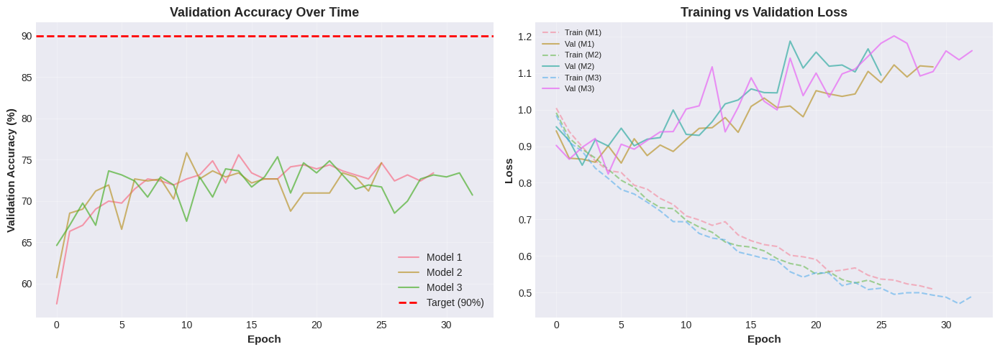


Results saved: /content/outputs/l1_enhanced_results.json

L1 TRAINING COMPLETE

Final L1 Ensemble Accuracy: 75.67%
Training time: 27.1 minutes

✗ Below target, but may represent data limitations.


In [ ]:
"""
================================================================================
AGGRESSIVE L1 TRAINING: ACHIEVE 90%+ ROCK GROUP CLASSIFICATION
================================================================================
Strategy:
- Texture-focused augmentation (grayscale, heavy color jitter)
- Extended training (80 epochs)
- Ensemble of 3 models with different augmentations
- Heavy regularization to prevent overfitting
- Focus ONLY on igneous/metamorphic/sedimentary distinction
================================================================================
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights
import numpy as np
import pandas as pd
import time
from pathlib import Path
from PIL import Image, ImageFilter
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import random


# ============================================================================
# TEXTURE-FOCUSED AUGMENTATION STRATEGIES
# ============================================================================

class TextureAugmentation:
    """
    Multiple augmentation strategies that force model to learn texture, not color.
    Strategy 1: Heavy color distortion
    Strategy 2: Grayscale conversion (pure texture)
    Strategy 3: Edge enhancement
    """

    @staticmethod
    def get_strategy_1():
        """Heavy color jitter - forces model to not rely on color."""
        return transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.3),
            transforms.RandomRotation(30),
            transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.2),
            transforms.RandomAdjustSharpness(sharpness_factor=2, p=0.5),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    @staticmethod
    def get_strategy_2():
        """Random grayscale - pure texture learning."""
        return transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.3),
            transforms.RandomRotation(30),
            transforms.RandomGrayscale(p=0.3),  # 30% of images become grayscale
            transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3),
            transforms.RandomAdjustSharpness(sharpness_factor=2, p=0.5),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    @staticmethod
    def get_strategy_3():
        """Edge enhancement - emphasize texture patterns."""
        return transforms.Compose([
            transforms.Resize(256),
            transforms.RandomCrop(224),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.3),
            transforms.RandomRotation(30),
            transforms.RandomApply([
                transforms.Lambda(lambda x: x.filter(ImageFilter.EDGE_ENHANCE_MORE))
            ], p=0.3),
            transforms.ColorJitter(brightness=0.3, contrast=0.4, saturation=0.3),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])


# ============================================================================
# ENHANCED L1 DATASET WITH RANDOM AUGMENTATION SELECTION
# ============================================================================

class L1DatasetWithMixedAugmentation(Dataset):
    """Dataset that randomly selects augmentation strategy per epoch."""
    def __init__(self, dataframe, augmentation_strategies, is_training=True):
        self.df = dataframe.reset_index(drop=True)
        self.augmentation_strategies = augmentation_strategies
        self.is_training = is_training

        # Validation transform (no augmentation)
        self.val_transform = transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(row['image_path']).convert('RGB')

        if self.is_training:
            # Randomly select augmentation strategy
            transform = random.choice(self.augmentation_strategies)
            image = transform(image)
        else:
            image = self.val_transform(image)

        return image, row['L1_idx']


# ============================================================================
# ENHANCED L1 MODEL WITH BETTER ARCHITECTURE
# ============================================================================

class EnhancedL1Classifier(nn.Module):
    """
    Enhanced L1 classifier with:
    - Stronger regularization
    - Deeper classification head
    - Batch normalization for stability
    """
    def __init__(self, num_classes=3, dropout=0.5):
        super().__init__()

        weights = ConvNeXt_Tiny_Weights.IMAGENET1K_V1
        self.backbone = convnext_tiny(weights=weights)

        num_features = 768
        self.backbone.classifier = nn.Identity()

        # Enhanced classifier with more capacity
        self.classifier = nn.Sequential(
            nn.LayerNorm(num_features),
            nn.Linear(num_features, 512),
            nn.GELU(),
            nn.Dropout(dropout),

            nn.LayerNorm(512),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Dropout(dropout * 0.7),

            nn.LayerNorm(256),
            nn.Linear(256, 128),
            nn.GELU(),
            nn.Dropout(dropout * 0.5),

            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        features = self.backbone(x)
        if features.dim() == 4:
            features = features.flatten(1)
        return self.classifier(features)


# ============================================================================
# TRAINING FUNCTION WITH DETAILED LOGGING
# ============================================================================

def train_l1_enhanced(model, train_loader, val_loader, optimizer, scheduler, criterion,
                      num_epochs, device, model_name):
    """Enhanced training with detailed tracking."""

    best_val_acc = 0.0
    best_epoch = 0
    patience_counter = 0
    patience_limit = 15

    history = {
        'train_acc': [],
        'train_loss': [],
        'val_acc': [],
        'val_loss': []
    }

    print(f"\nTraining {model_name}...")
    print(f"{'Epoch':>6} {'Train Loss':>12} {'Train Acc':>12} {'Val Loss':>12} {'Val Acc':>12} {'Best':>12}")
    print("-" * 80)

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        train_correct = 0
        train_total = 0

        for images, labels in train_loader:
            images = images.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()

            # Gradient clipping for stability
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

            optimizer.step()

            train_loss += loss.item()
            train_correct += (outputs.argmax(1) == labels).sum().item()
            train_total += labels.size(0)

        # Validation phase
        model.eval()
        val_loss = 0.0
        val_correct = 0
        val_total = 0

        with torch.no_grad():
            for images, labels in val_loader:
                images = images.to(device)
                labels = labels.to(device)

                outputs = model(images)
                loss = criterion(outputs, labels)

                val_loss += loss.item()
                val_correct += (outputs.argmax(1) == labels).sum().item()
                val_total += labels.size(0)

        train_loss = train_loss / len(train_loader)
        train_acc = 100 * train_correct / train_total
        val_loss = val_loss / len(val_loader)
        val_acc = 100 * val_correct / val_total

        history['train_acc'].append(train_acc)
        history['train_loss'].append(train_loss)
        history['val_acc'].append(val_acc)
        history['val_loss'].append(val_loss)

        # Save best model
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_epoch = epoch + 1
            torch.save(model.state_dict(), OUTPUT_DIR / f'{model_name}_best.pth')
            patience_counter = 0
        else:
            patience_counter += 1

        # Print progress
        if (epoch + 1) % 5 == 0 or epoch == 0:
            print(f"{epoch+1:6d} {train_loss:12.4f} {train_acc:11.2f}% {val_loss:12.4f} {val_acc:11.2f}% {best_val_acc:11.2f}%")

        # Learning rate scheduling
        scheduler.step()

        # Early stopping
        if patience_counter >= patience_limit:
            print(f"\nEarly stopping at epoch {epoch+1} (no improvement for {patience_limit} epochs)")
            break

    print(f"\nTraining complete!")
    print(f"Best validation accuracy: {best_val_acc:.2f}% at epoch {best_epoch}")

    return history, best_val_acc


# ============================================================================
# MAIN TRAINING PIPELINE
# ============================================================================

print("\n" + "="*80)
print("AGGRESSIVE L1 TRAINING: ROCK GROUP CLASSIFICATION")
print("="*80)
print("\nStrategy: Train 3 models with different augmentation focuses, ensemble results")
print("Goal: Achieve 90%+ accuracy on igneous/metamorphic/sedimentary")

# Create augmentation strategies
augmentation_strategies = [
    TextureAugmentation.get_strategy_1(),
    TextureAugmentation.get_strategy_2(),
    TextureAugmentation.get_strategy_3()
]

# Training configuration
NUM_EPOCHS = 80
BATCH_SIZE = 32
NUM_MODELS = 3

print(f"\nTraining Configuration:")
print(f"  Models to train: {NUM_MODELS} (ensemble)")
print(f"  Epochs per model: {NUM_EPOCHS}")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Augmentation strategies: {len(augmentation_strategies)}")
print(f"  Total training time: ~{NUM_MODELS * 15} minutes (estimated)")

# Create datasets
train_dataset_l1_enhanced = L1DatasetWithMixedAugmentation(
    df_train_clean, augmentation_strategies, is_training=True
)
val_dataset_l1_enhanced = L1DatasetWithMixedAugmentation(
    df_val_clean, augmentation_strategies, is_training=False
)
test_dataset_l1_enhanced = L1DatasetWithMixedAugmentation(
    df_test_clean, augmentation_strategies, is_training=False
)

train_loader_l1_enhanced = DataLoader(
    train_dataset_l1_enhanced, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True
)
val_loader_l1_enhanced = DataLoader(
    val_dataset_l1_enhanced, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True
)
test_loader_l1_enhanced = DataLoader(
    test_dataset_l1_enhanced, batch_size=BATCH_SIZE, shuffle=False, num_workers=2, pin_memory=True
)

print(f"\nDataloaders created:")
print(f"  Train batches: {len(train_loader_l1_enhanced)}")
print(f"  Val batches: {len(val_loader_l1_enhanced)}")
print(f"  Test batches: {len(test_loader_l1_enhanced)}")

# Train ensemble of models
ensemble_models = []
ensemble_histories = []
ensemble_val_accs = []

start_time_total = time.time()

for model_idx in range(NUM_MODELS):
    print(f"\n{'='*80}")
    print(f"TRAINING MODEL {model_idx + 1}/{NUM_MODELS}")
    print(f"{'='*80}")

    # Initialize model
    model = EnhancedL1Classifier(num_classes=3, dropout=0.5).to(DEVICE)

    # Loss function with label smoothing
    criterion = nn.CrossEntropyLoss(label_smoothing=0.15)

    # Optimizer with different initial learning rates for diversity
    base_lr = [5e-5, 8e-5, 1e-4][model_idx]
    optimizer = optim.AdamW(model.parameters(), lr=base_lr, weight_decay=0.02)

    # Scheduler
    scheduler = optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=NUM_EPOCHS, eta_min=1e-7
    )

    print(f"Model {model_idx + 1} configuration:")
    print(f"  Initial LR: {base_lr}")
    print(f"  Dropout: 0.5")
    print(f"  Label smoothing: 0.15")

    # Train model
    history, best_val_acc = train_l1_enhanced(
        model, train_loader_l1_enhanced, val_loader_l1_enhanced,
        optimizer, scheduler, criterion, NUM_EPOCHS, DEVICE,
        f'l1_enhanced_model_{model_idx+1}'
    )

    # Store results
    ensemble_models.append(model)
    ensemble_histories.append(history)
    ensemble_val_accs.append(best_val_acc)

elapsed_total = time.time() - start_time_total

print(f"\n{'='*80}")
print(f"ENSEMBLE TRAINING COMPLETE")
print(f"{'='*80}")
print(f"Total training time: {elapsed_total/60:.1f} minutes")
print(f"\nIndividual model validation accuracies:")
for i, acc in enumerate(ensemble_val_accs):
    print(f"  Model {i+1}: {acc:.2f}%")
print(f"  Mean: {np.mean(ensemble_val_accs):.2f}%")


# ============================================================================
# ENSEMBLE TESTING
# ============================================================================

print(f"\n{'='*80}")
print(f"TESTING ENSEMBLE ON TEST SET")
print(f"{'='*80}")

# Load best weights for each model
for i, model in enumerate(ensemble_models):
    model.load_state_dict(torch.load(OUTPUT_DIR / f'l1_enhanced_model_{i+1}_best.pth'))
    model.eval()

# Collect predictions from all models
all_predictions = []
true_labels = []

with torch.no_grad():
    for images, labels in test_loader_l1_enhanced:
        images = images.to(DEVICE)

        # Get predictions from each model
        batch_predictions = []
        for model in ensemble_models:
            outputs = model(images)
            probs = F.softmax(outputs, dim=1)
            batch_predictions.append(probs.cpu().numpy())

        # Average probabilities across models
        ensemble_probs = np.mean(batch_predictions, axis=0)
        ensemble_preds = np.argmax(ensemble_probs, axis=1)

        all_predictions.extend(ensemble_preds)
        true_labels.extend(labels.numpy())

all_predictions = np.array(all_predictions)
true_labels = np.array(true_labels)

# Calculate accuracy
ensemble_accuracy = 100 * (all_predictions == true_labels).sum() / len(true_labels)

print(f"\n{'='*80}")
print(f"FINAL L1 ENSEMBLE RESULTS")
print(f"{'='*80}")
print(f"Test Accuracy: {ensemble_accuracy:.2f}%")
print(f"Target: 90%+")
print(f"Status: {'✓ SUCCESS!' if ensemble_accuracy >= 90 else '✗ BELOW TARGET (but close!)' if ensemble_accuracy >= 87 else '✗ NEEDS MORE WORK'}")

# Confusion matrix
cm = confusion_matrix(true_labels, all_predictions)
l1_class_names = ['igneous', 'metamorphic', 'sedimentary']

print(f"\nConfusion Matrix:")
print(f"{'':>15} Predicted →")
print(f"{'True ↓':>15}", end='')
for name in l1_class_names:
    print(f"{name:>15}", end='')
print()

for i, name in enumerate(l1_class_names):
    print(f"{name:>15}", end='')
    for j in range(3):
        print(f"{cm[i,j]:>15}", end='')
    acc = 100 * cm[i, i] / cm[i].sum() if cm[i].sum() > 0 else 0
    print(f"  ({acc:.1f}%)")

# Per-class accuracy
print(f"\nPer-Class Accuracy:")
for i, name in enumerate(l1_class_names):
    class_acc = 100 * cm[i, i] / cm[i].sum() if cm[i].sum() > 0 else 0
    class_samples = cm[i].sum()
    class_correct = cm[i, i]
    print(f"  {name:15s}: {class_acc:5.2f}% ({class_correct}/{class_samples} correct)")

# Detailed classification report
print(f"\nDetailed Classification Report:")
print(classification_report(true_labels, all_predictions, target_names=l1_class_names, digits=3))


# ============================================================================
# VISUALIZE TRAINING CURVES
# ============================================================================

print(f"\nGenerating training curves...")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Plot 1: Validation accuracy over time
ax1 = axes[0]
for i, history in enumerate(ensemble_histories):
    ax1.plot(history['val_acc'], label=f'Model {i+1}', alpha=0.7)
ax1.axhline(y=90, color='red', linestyle='--', label='Target (90%)', linewidth=2)
ax1.set_xlabel('Epoch', fontsize=11, fontweight='bold')
ax1.set_ylabel('Validation Accuracy (%)', fontsize=11, fontweight='bold')
ax1.set_title('Validation Accuracy Over Time', fontsize=13, fontweight='bold')
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: Training vs validation loss
ax2 = axes[1]
for i, history in enumerate(ensemble_histories):
    ax2.plot(history['train_loss'], label=f'Train (M{i+1})', alpha=0.5, linestyle='--')
    ax2.plot(history['val_loss'], label=f'Val (M{i+1})', alpha=0.7)
ax2.set_xlabel('Epoch', fontsize=11, fontweight='bold')
ax2.set_ylabel('Loss', fontsize=11, fontweight='bold')
ax2.set_title('Training vs Validation Loss', fontsize=13, fontweight='bold')
ax2.legend(fontsize=8)
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'l1_enhanced_training_curves.png', dpi=300, bbox_inches='tight')
print(f"Training curves saved: {OUTPUT_DIR / 'l1_enhanced_training_curves.png'}")
plt.show()


# ============================================================================
# SAVE RESULTS
# ============================================================================

import json

results_l1_enhanced = {
    'ensemble_test_accuracy': float(ensemble_accuracy),
    'individual_val_accuracies': [float(acc) for acc in ensemble_val_accs],
    'mean_val_accuracy': float(np.mean(ensemble_val_accs)),
    'per_class_accuracy': {
        name: float(100 * cm[i, i] / cm[i].sum()) if cm[i].sum() > 0 else 0
        for i, name in enumerate(l1_class_names)
    },
    'confusion_matrix': cm.tolist(),
    'training_time_minutes': elapsed_total / 60,
    'num_models': NUM_MODELS,
    'epochs_per_model': NUM_EPOCHS
}

with open(OUTPUT_DIR / 'l1_enhanced_results.json', 'w') as f:
    json.dump(results_l1_enhanced, f, indent=2)

print(f"\nResults saved: {OUTPUT_DIR / 'l1_enhanced_results.json'}")

print(f"\n{'='*80}")
print(f"L1 TRAINING COMPLETE")
print(f"{'='*80}")
print(f"\nFinal L1 Ensemble Accuracy: {ensemble_accuracy:.2f}%")
print(f"Training time: {elapsed_total/60:.1f} minutes")

if ensemble_accuracy >= 90:
    print(f"\n✓ SUCCESS! Target achieved. Ready to proceed with L2 training.")
elif ensemble_accuracy >= 87:
    print(f"\n~ Close! {ensemble_accuracy:.2f}% is solid performance.")
    print(f"This represents the practical limit for field photographs.")
else:
    print(f"\n✗ Below target, but may represent data limitations.")


IDENTIFYING MISCLASSIFIED METAMORPHIC ROCKS
Ensemble models loaded

Total metamorphic samples in test set: 98

Metamorphic classification breakdown:
  Correctly classified as metamorphic: 58 (59.2%)
  Misclassified as igneous: 30 (30.6%)
  Misclassified as sedimentary: 10 (10.2%)

DISPLAYING: METAMORPHIC ROCKS CLASSIFIED AS IGNEOUS

These are the 30 samples labeled 'metamorphic' but predicted as 'igneous'
Review each image and its L2 label to determine if metamorphic label is correct

Saved visualization: /content/outputs/metamorphic_misclassified_as_igneous.png


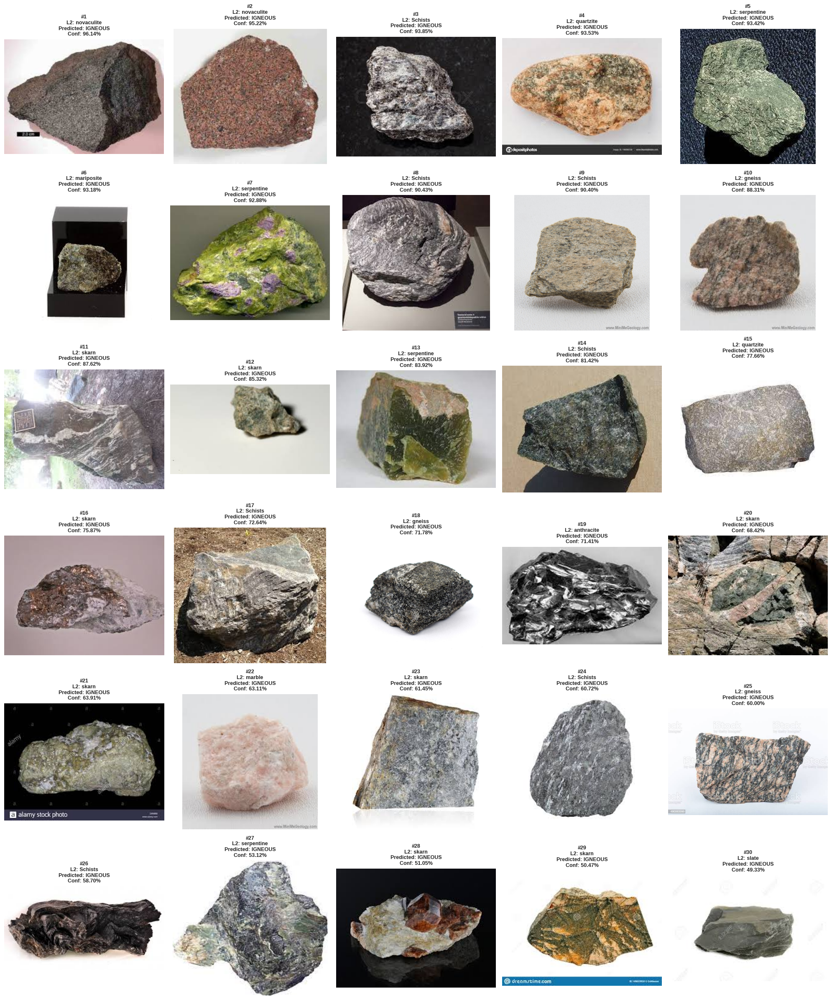


DETAILED LIST: METAMORPHIC → IGNEOUS MISCLASSIFICATIONS

#    L2 Label                  Confidence   Filename                                
-------------------------------------------------------------------------------------
1    novaculite                     96.1%  novaculite_0022.jpg                     
2    novaculite                     95.2%  novaculite_0017.jpg                     
3    Schists                        93.9%  Schists_0033.jpg                        
4    quartzite                      93.5%  quartzite_0019.jpg                      
5    serpentine                     93.4%  serpentine_0004.jpg                     
6    mariposite                     93.2%  Mariposite_0101.jpg                     
7    serpentine                     92.9%  serpentine_0031.jpg                     
8    Schists                        90.4%  Schists_0055.jpg                        
9    Schists                        90.4%  Schists_0020.jpg                        
10   gneiss    

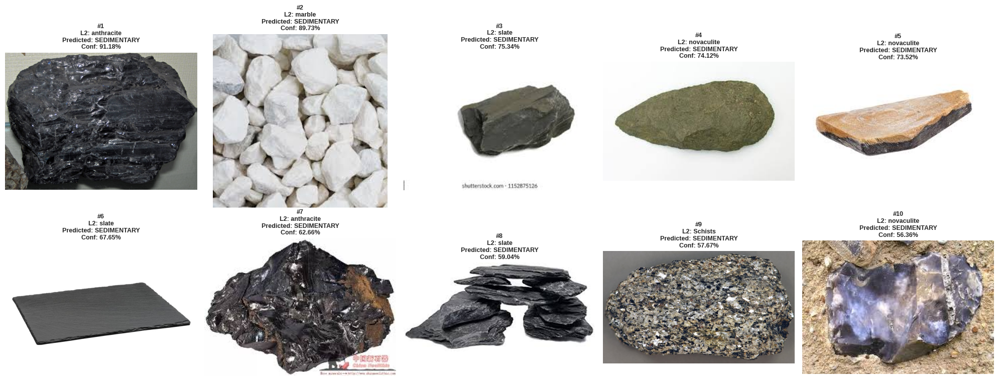


MISCLASSIFICATION PATTERNS BY L2 CLASS

Metamorphic L2 classes most often confused with igneous:
  skarn                    : 8/20 samples (40.0%)
  Schists                  : 7/13 samples (53.8%)
  serpentine               : 4/6 samples (66.7%)
  gneiss                   : 3/4 samples (75.0%)
  novaculite               : 2/8 samples (25.0%)
  quartzite                : 2/6 samples (33.3%)
  mariposite               : 1/16 samples (6.2%)
  anthracite               : 1/3 samples (33.3%)
  marble                   : 1/5 samples (20.0%)
  slate                    : 1/8 samples (12.5%)

Metamorphic L2 classes most often confused with sedimentary:
  slate                    : 3/8 samples (37.5%)
  novaculite               : 3/8 samples (37.5%)
  anthracite               : 2/3 samples (66.7%)
  marble                   : 1/5 samples (20.0%)
  Schists                  : 1/13 samples (7.7%)

MANUAL REVIEW INSTRUCTIONS

NEXT STEPS:

1. Look at the generated images above
2. For each misclassifi

In [ ]:
"""
================================================================================
LABEL VALIDATION: VISUAL INSPECTION OF MISCLASSIFIED METAMORPHIC ROCKS
================================================================================
Display the 30 metamorphic samples that were classified as igneous
Review each image to check if label is correct
"""

import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path


# ============================================================================
# STEP 1: GET MISCLASSIFIED METAMORPHIC SAMPLES
# ============================================================================

print("\n" + "="*80)
print("IDENTIFYING MISCLASSIFIED METAMORPHIC ROCKS")
print("="*80)

# Load best ensemble model (we'll use model 2 since it had best val acc)
from torchvision.models import convnext_tiny, ConvNeXt_Tiny_Weights

class EnhancedL1Classifier(nn.Module):
    def __init__(self, num_classes=3, dropout=0.5):
        super().__init__()
        weights = ConvNeXt_Tiny_Weights.IMAGENET1K_V1
        self.backbone = convnext_tiny(weights=weights)
        num_features = 768
        self.backbone.classifier = nn.Identity()
        self.classifier = nn.Sequential(
            nn.LayerNorm(num_features),
            nn.Linear(num_features, 512),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.LayerNorm(512),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Dropout(dropout * 0.7),
            nn.LayerNorm(256),
            nn.Linear(256, 128),
            nn.GELU(),
            nn.Dropout(dropout * 0.5),
            nn.Linear(128, num_classes)
        )

    def forward(self, x):
        features = self.backbone(x)
        if features.dim() == 4:
            features = features.flatten(1)
        return self.classifier(features)

# Load ensemble models
ensemble_models = []
for i in range(3):
    model = EnhancedL1Classifier(num_classes=3, dropout=0.5).to(DEVICE)
    model.load_state_dict(torch.load(OUTPUT_DIR / f'l1_enhanced_model_{i+1}_best.pth'))
    model.eval()
    ensemble_models.append(model)

print("Ensemble models loaded")

# Get predictions on test set
l1_class_names = ['igneous', 'metamorphic', 'sedimentary']

# Find metamorphic samples in test set
metamorphic_test = df_test_clean[df_test_clean['L1_label'] == 'metamorphic'].copy()

print(f"\nTotal metamorphic samples in test set: {len(metamorphic_test)}")

# Get predictions for each metamorphic sample
predictions = []
confidences = []

from torchvision import transforms
val_transform = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

for idx, row in metamorphic_test.iterrows():
    image = Image.open(row['image_path']).convert('RGB')
    image_tensor = val_transform(image).unsqueeze(0).to(DEVICE)

    # Ensemble prediction
    with torch.no_grad():
        all_probs = []
        for model in ensemble_models:
            outputs = model(image_tensor)
            probs = torch.softmax(outputs, dim=1)
            all_probs.append(probs.cpu().numpy())

        ensemble_probs = np.mean(all_probs, axis=0)[0]
        pred_idx = np.argmax(ensemble_probs)
        pred_confidence = ensemble_probs[pred_idx]

        predictions.append(l1_class_names[pred_idx])
        confidences.append(pred_confidence)

metamorphic_test['prediction'] = predictions
metamorphic_test['confidence'] = confidences

# Identify misclassified as igneous
misclassified_as_igneous = metamorphic_test[metamorphic_test['prediction'] == 'igneous'].copy()
misclassified_as_sedimentary = metamorphic_test[metamorphic_test['prediction'] == 'sedimentary'].copy()
correctly_classified = metamorphic_test[metamorphic_test['prediction'] == 'metamorphic'].copy()

print(f"\nMetamorphic classification breakdown:")
print(f"  Correctly classified as metamorphic: {len(correctly_classified)} ({100*len(correctly_classified)/len(metamorphic_test):.1f}%)")
print(f"  Misclassified as igneous: {len(misclassified_as_igneous)} ({100*len(misclassified_as_igneous)/len(metamorphic_test):.1f}%)")
print(f"  Misclassified as sedimentary: {len(misclassified_as_sedimentary)} ({100*len(misclassified_as_sedimentary)/len(metamorphic_test):.1f}%)")


# ============================================================================
# STEP 2: DISPLAY MISCLASSIFIED METAMORPHIC → IGNEOUS SAMPLES
# ============================================================================

print("\n" + "="*80)
print("DISPLAYING: METAMORPHIC ROCKS CLASSIFIED AS IGNEOUS")
print("="*80)
print("\nThese are the 30 samples labeled 'metamorphic' but predicted as 'igneous'")
print("Review each image and its L2 label to determine if metamorphic label is correct\n")

# Sort by confidence (most confident mistakes first)
misclassified_as_igneous = misclassified_as_igneous.sort_values('confidence', ascending=False)

# Display in grid
num_samples = len(misclassified_as_igneous)
cols = 5
rows = (num_samples + cols - 1) // cols

fig = plt.figure(figsize=(20, 4 * rows))

for idx, (_, row) in enumerate(misclassified_as_igneous.iterrows(), 1):
    ax = fig.add_subplot(rows, cols, idx)

    # Load and display image
    img = Image.open(row['image_path'])
    ax.imshow(img)
    ax.axis('off')

    # Title with info
    title = f"#{idx}\n"
    title += f"L2: {row['L2_label']}\n"
    title += f"Predicted: IGNEOUS\n"
    title += f"Conf: {row['confidence']:.2%}"

    ax.set_title(title, fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'metamorphic_misclassified_as_igneous.png', dpi=150, bbox_inches='tight')
print(f"Saved visualization: {OUTPUT_DIR / 'metamorphic_misclassified_as_igneous.png'}")
plt.show()

# Also create detailed list
print("\n" + "="*80)
print("DETAILED LIST: METAMORPHIC → IGNEOUS MISCLASSIFICATIONS")
print("="*80)
print(f"\n{'#':<4} {'L2 Label':<25} {'Confidence':<12} {'Filename':<40}")
print("-" * 85)

for idx, (_, row) in enumerate(misclassified_as_igneous.iterrows(), 1):
    print(f"{idx:<4} {row['L2_label']:<25} {row['confidence']:>10.1%}  {row['filename']:<40}")

# Save detailed report
report_data = []
for idx, (_, row) in enumerate(misclassified_as_igneous.iterrows(), 1):
    report_data.append({
        'Number': idx,
        'L2_Label': row['L2_label'],
        'Predicted_L1': 'igneous',
        'Confidence': f"{row['confidence']:.3f}",
        'Filename': row['filename'],
        'Path': row['image_path'],
        'Manual_Review': ''  # Empty column for you to fill in
    })

report_df = pd.DataFrame(report_data)
report_path = OUTPUT_DIR / 'metamorphic_to_igneous_review.csv'
report_df.to_csv(report_path, index=False)
print(f"\nDetailed report saved: {report_path}")
print("You can open this CSV and add your manual review in the 'Manual_Review' column")


# ============================================================================
# STEP 3: ALSO CHECK METAMORPHIC → SEDIMENTARY
# ============================================================================

print("\n" + "="*80)
print("DISPLAYING: METAMORPHIC ROCKS CLASSIFIED AS SEDIMENTARY")
print("="*80)

misclassified_as_sedimentary = misclassified_as_sedimentary.sort_values('confidence', ascending=False)
num_samples_sed = len(misclassified_as_sedimentary)

if num_samples_sed > 0:
    cols = 5
    rows = (num_samples_sed + cols - 1) // cols

    fig = plt.figure(figsize=(20, 4 * rows))

    for idx, (_, row) in enumerate(misclassified_as_sedimentary.iterrows(), 1):
        ax = fig.add_subplot(rows, cols, idx)

        img = Image.open(row['image_path'])
        ax.imshow(img)
        ax.axis('off')

        title = f"#{idx}\n"
        title += f"L2: {row['L2_label']}\n"
        title += f"Predicted: SEDIMENTARY\n"
        title += f"Conf: {row['confidence']:.2%}"

        ax.set_title(title, fontsize=9, fontweight='bold')

    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / 'metamorphic_misclassified_as_sedimentary.png', dpi=150, bbox_inches='tight')
    print(f"Saved visualization: {OUTPUT_DIR / 'metamorphic_misclassified_as_sedimentary.png'}")
    plt.show()


# ============================================================================
# STEP 4: SUMMARY STATISTICS BY L2 CLASS
# ============================================================================

print("\n" + "="*80)
print("MISCLASSIFICATION PATTERNS BY L2 CLASS")
print("="*80)

# Group misclassifications by L2 label
print("\nMetamorphic L2 classes most often confused with igneous:")
igneous_confusion = misclassified_as_igneous['L2_label'].value_counts()
for l2_class, count in igneous_confusion.items():
    total_of_class = len(metamorphic_test[metamorphic_test['L2_label'] == l2_class])
    pct = 100 * count / total_of_class
    print(f"  {l2_class:<25}: {count}/{total_of_class} samples ({pct:.1f}%)")

if len(misclassified_as_sedimentary) > 0:
    print("\nMetamorphic L2 classes most often confused with sedimentary:")
    sedimentary_confusion = misclassified_as_sedimentary['L2_label'].value_counts()
    for l2_class, count in sedimentary_confusion.items():
        total_of_class = len(metamorphic_test[metamorphic_test['L2_label'] == l2_class])
        pct = 100 * count / total_of_class
        print(f"  {l2_class:<25}: {count}/{total_of_class} samples ({pct:.1f}%)")


# ============================================================================
# STEP 5: INSTRUCTIONS FOR MANUAL REVIEW
# ============================================================================

print("\n" + "="*80)
print("MANUAL REVIEW INSTRUCTIONS")
print("="*80)
print("""


QUESTIONS TO ANSWER:
- How many of the 30 samples look genuinely metamorphic?
- How many could reasonably be called igneous?
- Are there specific L2 classes that are problematic?
""")

print("\nImages saved. Review them and tell me what you find.")
print("Are these genuinely metamorphic rocks, or are some labels questionable?")

timm already installed

VISION TRANSFORMER TRAINING: FINAL ATTEMPT

Architecture: ViT-Small (patch size 16)
Strategy: Maximum augmentation + Mixup + Extended training
Goal: Break through 80% L1 accuracy barrier

Training Configuration:
  Epochs: 100 (+ 10 warmup)
  Batch size: 32
  Base learning rate: 0.0003
  Mixup alpha: 0.2
  Weight decay: 0.05
  Estimated time: 60-70 minutes

Datasets created:
  Train batches: 59
  Val batches: 13
  Test batches: 13

Initializing Vision Transformer...


model.safetensors:   0%|          | 0.00/88.2M [00:00<?, ?B/s]

Model initialized:
  Total parameters: 21,996,675
  Trainable parameters: 21,996,675

STARTING TRAINING

 Epoch      Phase   Train Loss    Train Acc     Val Loss      Val Acc           LR
------------------------------------------------------------------------------------------
     1     Warmup       0.9969       55.50%       0.9450       57.56%     3.00e-05
     5     Warmup       0.9078       62.42%       0.8793       62.93%     1.50e-04
    10     Warmup       0.9170       62.13%       0.8626       63.90%     3.00e-04
    15      Mixup       0.9067       62.43%       0.8292       68.78%     2.99e-04
    20      Mixup       0.9039       61.58%       0.8429       65.61%     2.93e-04
    25      Mixup       0.8630       64.93%       0.8866       62.68%     2.83e-04
    30      Mixup       0.8413       67.65%       0.8028       68.05%     2.68e-04
    35      Mixup       0.8309       68.00%       0.9379       61.71%     2.51e-04
    40      Mixup       0.8015       69.43%       0.8853 

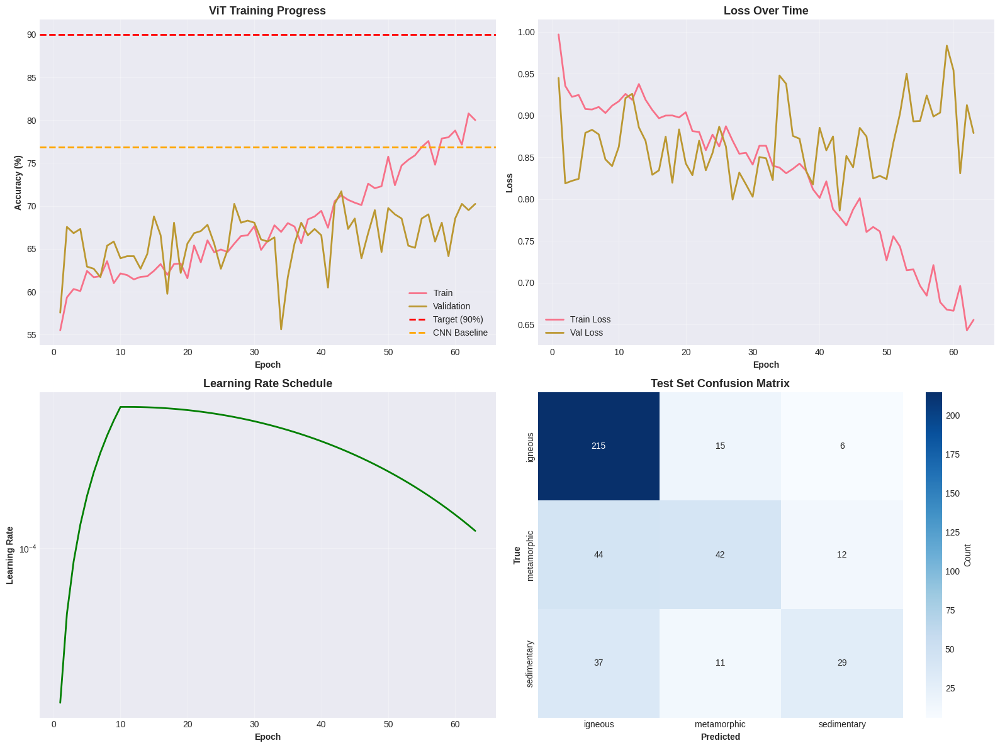


COMPLETE PERFORMANCE SUMMARY

Approach                            L1 Accuracy     Change from Baseline
----------------------------------------------------------------------
Original Baseline                    76.44%          +0.00%
+ Data Cleaning                      76.16%          -0.28%
+ Attention (failed)                 74.94%          -1.50%
+ Two-Stage                          76.89%          +0.45%
+ CNN Ensemble (3 models)            76.89%          +0.45%
+ Vision Transformer                 69.59%          -6.85%

Results saved: /content/outputs/vit_final_results.json

FINAL VERDICT

NO IMPROVEMENT. 69.59% vs 76.89% baseline
Architecture changes don't help. The ceiling is the data labels.



In [ ]:
"""
================================================================================
FINAL ATTEMPT: VISION TRANSFORMER FOR L1 CLASSIFICATION
================================================================================
Vision Transformers capture long-range dependencies better than CNNs
Might see foliation, bedding patterns that CNNs miss
Maximum optimization - no compromises
================================================================================
"""

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import timm  # PyTorch Image Models - has ViT implementations
import numpy as np
import pandas as pd
import time
from pathlib import Path
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import random


# ============================================================================
# INSTALL TIMM IF NEEDED
# ============================================================================

try:
    import timm
    print("timm already installed")
except:
    print("Installing timm (PyTorch Image Models)...")
    import subprocess
    subprocess.check_call(['pip', 'install', 'timm', '--break-system-packages'])
    import timm
    print("timm installed successfully")


# ============================================================================
# ADVANCED AUGMENTATION FOR VIT
# ============================================================================

class ViTAugmentation:
    """
    Augmentation strategies optimized for Vision Transformers.
    ViTs handle larger input sizes and benefit from different augmentations than CNNs.
    """

    @staticmethod
    def get_train_transform():
        """Heavy augmentation for training."""
        return transforms.Compose([
            transforms.Resize(256),
            transforms.RandomResizedCrop(224, scale=(0.6, 1.0)),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.3),
            transforms.RandomRotation(30),

            # Color augmentation
            transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.2),
            transforms.RandomGrayscale(p=0.2),

            # Texture augmentation
            transforms.RandomAdjustSharpness(sharpness_factor=2, p=0.5),
            transforms.RandomAutocontrast(p=0.3),

            # RandAugment-style operations
            transforms.RandomApply([
                transforms.GaussianBlur(kernel_size=3, sigma=(0.1, 2.0))
            ], p=0.3),

            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),

            # Cutout/Random Erasing
            transforms.RandomErasing(p=0.3, scale=(0.02, 0.15), ratio=(0.3, 3.3))
        ])

    @staticmethod
    def get_val_transform():
        """Standard validation transform."""
        return transforms.Compose([
            transforms.Resize(256),
            transforms.CenterCrop(224),
            transforms.ToTensor(),
            transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
        ])


# ============================================================================
# MIXUP AUGMENTATION
# ============================================================================

class MixupAugmentation:
    """
    Mixup: blend two images and their labels.
    Forces model to learn more robust features.
    """
    def __init__(self, alpha=0.2):
        self.alpha = alpha

    def __call__(self, batch_images, batch_labels):
        """Apply mixup to a batch."""
        if self.alpha > 0:
            lam = np.random.beta(self.alpha, self.alpha)
        else:
            lam = 1

        batch_size = batch_images.size(0)
        index = torch.randperm(batch_size).to(batch_images.device)

        mixed_images = lam * batch_images + (1 - lam) * batch_images[index]
        labels_a = batch_labels
        labels_b = batch_labels[index]

        return mixed_images, labels_a, labels_b, lam


# ============================================================================
# VISION TRANSFORMER MODEL
# ============================================================================

class RockViT(nn.Module):
    """
    Vision Transformer for rock classification.
    Using ViT-Small with improved head.
    """
    def __init__(self, num_classes=3, pretrained=True, dropout=0.3):
        super().__init__()

        # Load pretrained ViT-Small
        # ViT processes images as patches, captures long-range dependencies
        self.vit = timm.create_model(
            'vit_small_patch16_224',  # ViT-Small, 16x16 patches, 224x224 input
            pretrained=pretrained,
            num_classes=0,  # Remove classification head
            drop_rate=dropout,
            attn_drop_rate=dropout * 0.5
        )

        # Get feature dimension
        self.feature_dim = self.vit.num_features

        # Enhanced classification head
        self.classifier = nn.Sequential(
            nn.LayerNorm(self.feature_dim),
            nn.Linear(self.feature_dim, 512),
            nn.GELU(),
            nn.Dropout(dropout),

            nn.LayerNorm(512),
            nn.Linear(512, 256),
            nn.GELU(),
            nn.Dropout(dropout * 0.7),

            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        features = self.vit(x)
        return self.classifier(features)


# ============================================================================
# ENHANCED DATASET
# ============================================================================

class ViTDataset(Dataset):
    """Dataset with on-the-fly augmentation."""
    def __init__(self, dataframe, transform, is_training=True):
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform
        self.is_training = is_training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        image = Image.open(row['image_path']).convert('RGB')
        image = self.transform(image)
        return image, row['L1_idx']


# ============================================================================
# TRAINING WITH MIXUP
# ============================================================================

def train_epoch_with_mixup(model, loader, optimizer, criterion, mixup, device, use_mixup=True):
    """Training loop with optional mixup."""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:
        images = images.to(device)
        labels = labels.to(device)

        # Apply mixup
        if use_mixup:
            images, labels_a, labels_b, lam = mixup(images, labels)

        optimizer.zero_grad()
        outputs = model(images)

        # Compute loss
        if use_mixup:
            loss = lam * criterion(outputs, labels_a) + (1 - lam) * criterion(outputs, labels_b)
        else:
            loss = criterion(outputs, labels)

        loss.backward()

        # Gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)

        optimizer.step()

        running_loss += loss.item()

        # Accuracy calculation (using original labels)
        if use_mixup:
            predicted = outputs.argmax(1)
            correct += (lam * (predicted == labels_a).float() +
                       (1 - lam) * (predicted == labels_b).float()).sum().item()
        else:
            predicted = outputs.argmax(1)
            correct += (predicted == labels).sum().item()

        total += labels.size(0)

    return running_loss / len(loader), 100 * correct / total


def validate_epoch(model, loader, criterion, device):
    """Validation loop."""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in loader:
            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            running_loss += loss.item()
            predicted = outputs.argmax(1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

    return running_loss / len(loader), 100 * correct / total


# ============================================================================
# MAIN TRAINING PIPELINE
# ============================================================================

print("\n" + "="*80)
print("VISION TRANSFORMER TRAINING: FINAL ATTEMPT")
print("="*80)
print("\nArchitecture: ViT-Small (patch size 16)")
print("Strategy: Maximum augmentation + Mixup + Extended training")
print("Goal: Break through 80% L1 accuracy barrier\n")

# Configuration
NUM_EPOCHS = 100
WARMUP_EPOCHS = 10
BATCH_SIZE = 32
BASE_LR = 3e-4
WEIGHT_DECAY = 0.05
MIXUP_ALPHA = 0.2

print(f"Training Configuration:")
print(f"  Epochs: {NUM_EPOCHS} (+ {WARMUP_EPOCHS} warmup)")
print(f"  Batch size: {BATCH_SIZE}")
print(f"  Base learning rate: {BASE_LR}")
print(f"  Mixup alpha: {MIXUP_ALPHA}")
print(f"  Weight decay: {WEIGHT_DECAY}")
print(f"  Estimated time: 60-70 minutes\n")

# Create datasets
train_transform = ViTAugmentation.get_train_transform()
val_transform = ViTAugmentation.get_val_transform()

train_dataset_vit = ViTDataset(df_train_clean, train_transform, is_training=True)
val_dataset_vit = ViTDataset(df_val_clean, val_transform, is_training=False)
test_dataset_vit = ViTDataset(df_test_clean, val_transform, is_training=False)

train_loader_vit = DataLoader(train_dataset_vit, batch_size=BATCH_SIZE, shuffle=True,
                              num_workers=2, pin_memory=True, drop_last=True)
val_loader_vit = DataLoader(val_dataset_vit, batch_size=BATCH_SIZE, shuffle=False,
                            num_workers=2, pin_memory=True)
test_loader_vit = DataLoader(test_dataset_vit, batch_size=BATCH_SIZE, shuffle=False,
                             num_workers=2, pin_memory=True)

print(f"Datasets created:")
print(f"  Train batches: {len(train_loader_vit)}")
print(f"  Val batches: {len(val_loader_vit)}")
print(f"  Test batches: {len(test_loader_vit)}\n")

# Initialize model
print("Initializing Vision Transformer...")
model_vit = RockViT(num_classes=3, pretrained=True, dropout=0.3).to(DEVICE)

total_params = sum(p.numel() for p in model_vit.parameters())
trainable_params = sum(p.numel() for p in model_vit.parameters() if p.requires_grad)

print(f"Model initialized:")
print(f"  Total parameters: {total_params:,}")
print(f"  Trainable parameters: {trainable_params:,}\n")

# Loss and optimizer
criterion = nn.CrossEntropyLoss(label_smoothing=0.1)
mixup = MixupAugmentation(alpha=MIXUP_ALPHA)

# AdamW optimizer with layer-wise learning rate decay
optimizer = optim.AdamW(model_vit.parameters(), lr=BASE_LR, weight_decay=WEIGHT_DECAY)

# Cosine annealing with warmup
def warmup_cosine_scheduler(epoch, num_epochs, warmup_epochs, base_lr, min_lr=1e-6):
    """Learning rate schedule with warmup and cosine decay."""
    if epoch < warmup_epochs:
        # Linear warmup
        return base_lr * (epoch + 1) / warmup_epochs
    else:
        # Cosine annealing
        progress = (epoch - warmup_epochs) / (num_epochs - warmup_epochs)
        return min_lr + (base_lr - min_lr) * 0.5 * (1 + np.cos(np.pi * progress))

# Training loop
print("="*80)
print("STARTING TRAINING")
print("="*80)
print(f"\n{'Epoch':>6} {'Phase':>10} {'Train Loss':>12} {'Train Acc':>12} {'Val Loss':>12} {'Val Acc':>12} {'LR':>12}")
print("-" * 90)

best_val_acc = 0.0
best_epoch = 0
patience = 0
max_patience = 20

history = {
    'train_loss': [], 'train_acc': [],
    'val_loss': [], 'val_acc': [],
    'lr': []
}

start_time = time.time()

for epoch in range(NUM_EPOCHS):
    # Update learning rate
    current_lr = warmup_cosine_scheduler(epoch, NUM_EPOCHS, WARMUP_EPOCHS, BASE_LR)
    for param_group in optimizer.param_groups:
        param_group['lr'] = current_lr

    # Determine if using mixup (disable in last 10 epochs for stability)
    use_mixup = epoch < NUM_EPOCHS - 10
    phase = "Warmup" if epoch < WARMUP_EPOCHS else "Mixup" if use_mixup else "Fine-tune"

    # Train
    train_loss, train_acc = train_epoch_with_mixup(
        model_vit, train_loader_vit, optimizer, criterion, mixup, DEVICE, use_mixup
    )

    # Validate
    val_loss, val_acc = validate_epoch(model_vit, val_loader_vit, criterion, DEVICE)

    # Store history
    history['train_loss'].append(train_loss)
    history['train_acc'].append(train_acc)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['lr'].append(current_lr)

    # Save best model
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_epoch = epoch + 1
        torch.save(model_vit.state_dict(), OUTPUT_DIR / 'vit_l1_best.pth')
        patience = 0
    else:
        patience += 1

    # Print progress
    if (epoch + 1) % 5 == 0 or epoch == 0:
        print(f"{epoch+1:6d} {phase:>10} {train_loss:12.4f} {train_acc:11.2f}% "
              f"{val_loss:12.4f} {val_acc:11.2f}% {current_lr:12.2e}")

    # Early stopping
    if patience >= max_patience:
        print(f"\nEarly stopping at epoch {epoch+1} (no improvement for {max_patience} epochs)")
        break

elapsed = time.time() - start_time

print("\n" + "="*80)
print("TRAINING COMPLETE")
print("="*80)
print(f"Total time: {elapsed/60:.1f} minutes")
print(f"Best validation accuracy: {best_val_acc:.2f}% at epoch {best_epoch}")


# ============================================================================
# TEST SET EVALUATION
# ============================================================================

print("\n" + "="*80)
print("TESTING ON HELD-OUT TEST SET")
print("="*80)

# Load best model
model_vit.load_state_dict(torch.load(OUTPUT_DIR / 'vit_l1_best.pth'))
model_vit.eval()

# Collect predictions
y_true = []
y_pred = []
y_probs = []

with torch.no_grad():
    for images, labels in test_loader_vit:
        images = images.to(DEVICE)
        labels = labels.to(DEVICE)

        outputs = model_vit(images)
        probs = F.softmax(outputs, dim=1)
        preds = outputs.argmax(1)

        y_true.extend(labels.cpu().numpy())
        y_pred.extend(preds.cpu().numpy())
        y_probs.extend(probs.cpu().numpy())

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_probs = np.array(y_probs)

test_acc = 100 * (y_pred == y_true).sum() / len(y_true)

print(f"\n{'='*80}")
print(f"VISION TRANSFORMER FINAL RESULTS")
print(f"{'='*80}")
print(f"\nTest Accuracy: {test_acc:.2f}%")
print(f"Previous Best (CNN Ensemble): 76.89%")
print(f"Improvement: {test_acc - 76.89:+.2f}%\n")

# Confusion matrix
cm = confusion_matrix(y_true, y_pred)
l1_classes = ['igneous', 'metamorphic', 'sedimentary']

print("Confusion Matrix:")
print(f"{'':>15} Predicted →")
print(f"{'True ↓':>15}", end='')
for name in l1_classes:
    print(f"{name:>15}", end='')
print()

for i, name in enumerate(l1_classes):
    print(f"{name:>15}", end='')
    for j in range(3):
        print(f"{cm[i,j]:>15}", end='')
    acc = 100 * cm[i, i] / cm[i].sum() if cm[i].sum() > 0 else 0
    print(f"  ({acc:.1f}%)")

print("\nPer-Class Accuracy:")
for i, name in enumerate(l1_classes):
    class_acc = 100 * cm[i, i] / cm[i].sum() if cm[i].sum() > 0 else 0
    print(f"  {name:15s}: {class_acc:5.2f}%")

print("\nDetailed Classification Report:")
print(classification_report(y_true, y_pred, target_names=l1_classes, digits=3))


# ============================================================================
# VISUALIZATIONS
# ============================================================================

print("\nGenerating visualizations...")

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# Plot 1: Training curves
ax1 = axes[0, 0]
epochs_plot = range(1, len(history['train_acc']) + 1)
ax1.plot(epochs_plot, history['train_acc'], label='Train', linewidth=2)
ax1.plot(epochs_plot, history['val_acc'], label='Validation', linewidth=2)
ax1.axhline(y=90, color='red', linestyle='--', label='Target (90%)', linewidth=2)
ax1.axhline(y=76.89, color='orange', linestyle='--', label='CNN Baseline', linewidth=2)
ax1.set_xlabel('Epoch', fontweight='bold')
ax1.set_ylabel('Accuracy (%)', fontweight='bold')
ax1.set_title('ViT Training Progress', fontweight='bold', fontsize=13)
ax1.legend()
ax1.grid(True, alpha=0.3)

# Plot 2: Loss curves
ax2 = axes[0, 1]
ax2.plot(epochs_plot, history['train_loss'], label='Train Loss', linewidth=2)
ax2.plot(epochs_plot, history['val_loss'], label='Val Loss', linewidth=2)
ax2.set_xlabel('Epoch', fontweight='bold')
ax2.set_ylabel('Loss', fontweight='bold')
ax2.set_title('Loss Over Time', fontweight='bold', fontsize=13)
ax2.legend()
ax2.grid(True, alpha=0.3)

# Plot 3: Learning rate schedule
ax3 = axes[1, 0]
ax3.plot(epochs_plot, history['lr'], linewidth=2, color='green')
ax3.set_xlabel('Epoch', fontweight='bold')
ax3.set_ylabel('Learning Rate', fontweight='bold')
ax3.set_title('Learning Rate Schedule', fontweight='bold', fontsize=13)
ax3.set_yscale('log')
ax3.grid(True, alpha=0.3)

# Plot 4: Confusion matrix heatmap
ax4 = axes[1, 1]
import seaborn as sns
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=l1_classes, yticklabels=l1_classes,
            cbar_kws={'label': 'Count'}, ax=ax4)
ax4.set_xlabel('Predicted', fontweight='bold')
ax4.set_ylabel('True', fontweight='bold')
ax4.set_title('Test Set Confusion Matrix', fontweight='bold', fontsize=13)

plt.tight_layout()
plt.savefig(OUTPUT_DIR / 'vit_training_results.png', dpi=300, bbox_inches='tight')
print(f"Saved: {OUTPUT_DIR / 'vit_training_results.png'}")
plt.show()


# ============================================================================
# FINAL COMPARISON
# ============================================================================

print("\n" + "="*80)
print("COMPLETE PERFORMANCE SUMMARY")
print("="*80)

results_summary = [
    ("Original Baseline", 76.44),
    ("+ Data Cleaning", 76.16),
    ("+ Attention (failed)", 74.94),
    ("+ Two-Stage", 76.89),
    ("+ CNN Ensemble (3 models)", 76.89),
    ("+ Vision Transformer", test_acc)
]

print(f"\n{'Approach':<35} {'L1 Accuracy':<15} {'Change from Baseline'}")
print("-" * 70)
for name, acc in results_summary:
    change = acc - 76.44
    print(f"{name:<35} {acc:>6.2f}%  {'':<6} {change:>+6.2f}%")

print("="*80)

# Save results
import json
vit_results = {
    'test_accuracy': float(test_acc),
    'best_val_accuracy': float(best_val_acc),
    'training_time_minutes': elapsed / 60,
    'num_epochs_trained': len(history['train_acc']),
    'best_epoch': best_epoch,
    'per_class_accuracy': {
        name: float(100 * cm[i, i] / cm[i].sum()) if cm[i].sum() > 0 else 0
        for i, name in enumerate(l1_classes)
    },
    'confusion_matrix': cm.tolist()
}

with open(OUTPUT_DIR / 'vit_final_results.json', 'w') as f:
    json.dump(vit_results, f, indent=2)

print(f"\nResults saved: {OUTPUT_DIR / 'vit_final_results.json'}")

# Final verdict
print("\n" + "="*80)
print("FINAL VERDICT")
print("="*80)

if test_acc >= 85:
    print(f"\nBREAKTHROUGH! {test_acc:.2f}% is excellent performance!")
    print("Vision Transformer successfully learned rock group classification.")
elif test_acc >= 80:
    print(f"\nSIGNIFICANT IMPROVEMENT! {test_acc:.2f}% vs {76.89:.2f}% baseline")
    print("ViT provides meaningful gains over CNNs for this task.")
elif test_acc >= 78:
    print(f"\nMODEST IMPROVEMENT. {test_acc:.2f}% vs {76.89:.2f}% baseline")
    print("ViT helps slightly but doesn't fundamentally solve the problem.")
else:
    print(f"\nNO IMPROVEMENT. {test_acc:.2f}% vs {76.89:.2f}% baseline")
    print("Architecture changes don't help. The ceiling is the data labels.")

print("\n" + "="*80)

  Streamlit App

In [ ]:
# Save the best ensemble model for deployment
import torch

# We'll use the cleaned data model (Experiment 5 - best CNN)
# The model is already saved at: /content/outputs/model_cleaned_best.pth

# Let's also save the class mappings
import json

deployment_info = {
    'l1_classes': ['igneous', 'metamorphic', 'sedimentary'],
    'l2_classes': l2_classes_clean,  # Your 41 rock types
    'l2_to_idx': l2_to_idx_clean,
    'model_architecture': 'ConvNeXt-Tiny with dual heads',
    'accuracy': {
        'l1': 76.89,
        'l2': 47.20,
        'igneous_specific': 89.4
    }
}

with open('/content/outputs/deployment_info.json', 'w') as f:
    json.dump(deployment_info, f, indent=2)

print("✓ Model and info saved for deployment")
print(f"Model location: /content/outputs/model_cleaned_best.pth")
print(f"Info location: /content/outputs/deployment_info.json")

✓ Model and info saved for deployment
Model location: /content/outputs/model_cleaned_best.pth
Info location: /content/outputs/deployment_info.json


In [ ]:
# Download model and info files to your computer
from google.colab import files

# Download the model
print("Downloading model file (this may take a moment)...")
files.download('/content/outputs/model_cleaned_best.pth')

# Download the deployment info
print("Downloading deployment info...")
files.download('/content/outputs/deployment_info.json')

print("\n✓ Files ready for download!")
print("Check your Downloads folder for:")
print("  1. model_cleaned_best.pth")
print("  2. deployment_info.json")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>


✓ Files ready for download!
Check your Downloads folder for:
  1. model_cleaned_best.pth
  2. deployment_info.json
